<p> The details of the Kaggle contest in question are at https://www.kaggle.com/c/tweet-sentiment-extraction/overview. In this notebook, we attempt to pre-process input datasets to prepare them for NLP modelling. Input tweet sequences are cleaned and tokenized, and then wrapped in a BERT embedding for contextual awareness. Output text sequences are merely tokenized on an external library given the need to preserve sentence phrases. A local BERT client is used to generate the datasets. To run BERT locally, <br\><br/>
<i>
pip install bert-serving-server <br/>
pip install bert-serving-client <br/>
wget https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip && unzip uncased_L-12_H-768_A-12.zip
<br/>
bert-serving-start -model_dir uncased_L-12_H-768_A-12/ -num_worker=2 -max_seq_len 100
</i>
<p>

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import sklearn.metrics
import sklearn.preprocessing
import tensorflow as tf
import tensorflow.keras as keras
from bert_serving.client import BertClient
import matplotlib.pyplot as plt
import seaborn as sns
import re
import pickle
import nltk.probability
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, GRU, LSTM, Conv1D, MaxPooling1D, RNN, Bidirectional
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [2]:
data = pd.read_csv("./data/train.csv")
testdata = pd.read_csv("./data/test.csv")
data.dropna(how="any", inplace=True)

Since the evaluation of modelling is on a word-level Jaccard score, we need to preserve spacing and punctuation. However, to improve BERT accuracy and trainY vocabulary indexing, we shall perform cleaning, and recover original punctuation after model prediction with a character-level input string comparison.

In [3]:
def cleaner(sent):
    #Tokenize web-links and space out punctuation for vocabulary creation
    sent = " ".join(np.vectorize(lambda s:"WEBSITE" if "http" in s else s)(np.array(sent.split())))
    sent = re.sub("[!.?:;,`()]", " ", sent)
    return sent.lower()
for col in ['text','selected_text']:
    data[col] = data[col].apply(lambda s: cleaner(s))
testdata['text'] = testdata['text'].apply(lambda s: cleaner(s))
data = data.loc[data.text.apply(lambda s: len(s))!=1]

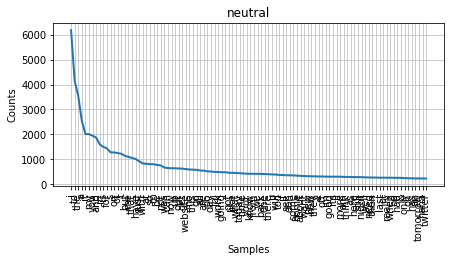

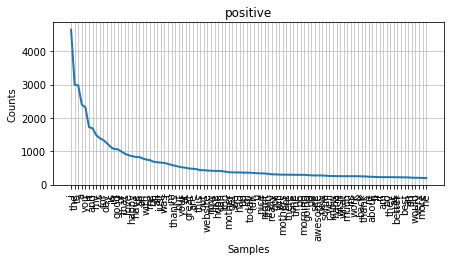

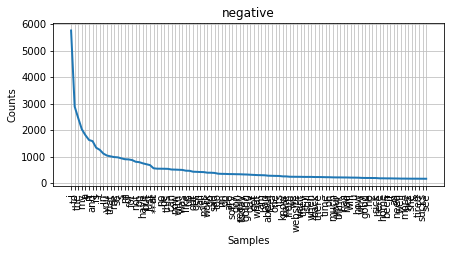

In [4]:
#Explore word frequencies for each sentiment
for label in data['sentiment'].value_counts().index:
    words = data.loc[data['sentiment']==label,"text"].values
    plt.figure(figsize=(7,3))
    plt.title(label)
    nltk.probability.FreqDist([token for row in words for token in row.split()]).plot(100)
    plt.show()

Given varied word frequency distributions, we can attempt different models for each sentiment label. Thus, independent word embeddings and model architectures are attempted on each of the positive, negative, and neutral labels. Since the sentiment is a parameter available before prediction, this design does not introduce data leakage.

<h2> Individual Label Datasets </h2>

In [7]:
tokenizer = keras.preprocessing.text.Tokenizer(num_words=None, filters='\n', lower=True, split=' ', 
                                                   char_level=False, oov_token=None, document_count=0)
tokenizer.fit_on_texts(data['text'].values)
progress = pd.DataFrame(index=data.sentiment.value_counts().index, columns=['TrainX','TrainY','TestX'])
for sent in data.sentiment.value_counts().index:
    print("Entering Sentiment "+sent)
    #BERT-encode training set
    bc = BertClient()
    trainX = bc.encode(data.loc[data.sentiment==sent, "text"].to_list())
    #We set a null-padded tockenized array of size equivalent to longest tweet for label as the output sequence
    maxlen = data.loc[data.sentiment==sent, "text"].apply(lambda s: len(s.split())).max()
    trainY = tokenizer.texts_to_sequences(data.loc[data.sentiment==sent, "selected_text"])
    trainY = keras.preprocessing.sequence.pad_sequences(trainY, maxlen=maxlen, padding="post", value=0)
    #Encode test set
    testX = bc.encode(testdata.loc[testdata.sentiment==sent, "text"].to_list())
    #Save data artifacts for modelling pipeline
    pickle.dump(trainX, open("./data/"+sent+"trainmainX.pkl", "wb"))
    pickle.dump(trainY, open("./data/"+sent+"trainY.pkl", "wb"))
    pickle.dump(testX, open("./data/"+sent+"testX.pkl", "wb"))
    progress.loc[sent] = [trainX.shape, trainY.shape, testX.shape]

Entering Sentiment neutral
Entering Sentiment positive
Entering Sentiment negative


In [8]:
progress

,TrainX,TrainY,TestX
neutral,"(11116, 768)","(11116, 34)","(1430, 768)"
positive,"(8582, 768)","(8582, 34)","(1103, 768)"
negative,"(7781, 768)","(7781, 33)","(1001, 768)"


In [5]:
#Tensorflow Jaccard Loss
def jaccard_loss(y_true, y_pred):
    def value(ten):
        if not ten.shape[0]: return 0
        sliceval = int(ten.shape[0]/2)
        x = tf.cast(tf.slice(ten,[0],[sliceval]), dtype=tf.int32)
        y = tf.cast(tf.slice(ten,[sliceval],[sliceval]), dtype=tf.int32)
        common = tf.sets.intersection(tf.reshape(y[y!=0],[1,-1]), tf.reshape(x[x!=0],[1,-1])).values
        x = tf.unique_with_counts(x[x!=0])[0]
        y = tf.unique_with_counts(y[y!=0])[0]
        if None in [common.shape[0], x.shape[0], y.shape[0]]: return 0
        if x.shape[0]==0 and y.shape[0]==0: return 1
        return common.shape[0]/(x.shape[0]+y.shape[0]-common.shape[0])
    var = tf.concat([tf.cast(y_true, dtype=tf.float32), tf.cast(y_pred, dtype=tf.float32)], axis=-1)
    return -tf.math.reduce_sum(tf.map_fn(value, var))

In [6]:
#Tensorflow BERT Loss
def bert_loss(y_true, y_pred):
    bc = BertClient()
    def bert(arr):
        bc.encode([" ".join([tokenizer.index_word.get(i," ") for i in arr])])[0]
    y_pred = tf.map_fn(bert, tf.cast(y_pred, dtype=tf.int32))
    y_true = tf.map_fn(bert, y_true)
    return tf.math.reduce_sum((y_true-y_pred)**2)

In [7]:
#CV Multi-Class Distance Score
def distance_score(estimator, X, Y):
    pred = estimator.predict_proba(X)
    maxval = np.tile(np.argmax(Y, axis=1).reshape(-1,1), [1, Y.shape[1]])
    pos = np.tile(np.arange(Y.shape[1]).reshape(1,-1), [Y.shape[0],1])
    return -np.sum(np.abs(pos-maxval)*pred)

We try re-phrasing the question as binary classification instead. We train deep-learning models to identify the subtext masks, as a multi-label multi-classification problem, optimized by categorical cross_entropy.

In [8]:
#New definitions of Y
#There are some edge cases where some words in selected_text do not appear in the main text, 
#partially since words are broken. We drop such tweets from the training set
def mask(s, shift):
    target = s.selected_text.split()
    if shift==-1: shift=len(target)-1
    source = s.text.split()
    start = None
    for i in range(len(source)):
        if (source[i]==target[0]) and (source[i:i+len(target)]==target):
            start = i
            break
    retval = np.zeros(len(source))
    if start==None: return retval #Invalid entries
    retval[start+shift] = 1
    return retval
posbegintrainY = data.loc[data.sentiment=="positive"].apply(lambda s: mask(s, 0), axis=1).values

In [9]:
goodmask = [sum(i==1)!=0 for i in posbegintrainY]
postrainX = pickle.load(open("./data/positivetrainmainX.pkl", "rb"))[goodmask]
maxlen = data.loc[data.sentiment=="positive", "text"][goodmask].apply(lambda s: len(s.split())).max()
posbegintrainY = keras.preprocessing.sequence.pad_sequences(posbegintrainY[goodmask], maxlen=maxlen, 
                                                            padding="post", value=0)
postrainX.shape, posbegintrainY.shape

((7845, 768), (7845, 34))

In [10]:
#Dense ANN
def dense_mdl(nunits=200, l2reg=0.05, drp=0.05, activation="relu", layers=1):
    model = Sequential()
    for _ in range(layers):
        model.add(Dense(nunits, kernel_regularizer=keras.regularizers.l2(l2reg), activation=activation,
                        bias_regularizer=keras.regularizers.l2(l2reg)))
    model.add(Dropout(drp))
    model.add(Dense(maxlen, kernel_regularizer=keras.regularizers.l2(l2reg),
                    bias_regularizer=keras.regularizers.l2(l2reg), activation="softmax"))
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=2e-7), loss="categorical_crossentropy")
    return model

In [11]:
weights = (np.sum(pd.DataFrame(posbegintrainY)).sum()/np.sum(pd.DataFrame(posbegintrainY))).replace(
    [np.nan, np.inf], 0)
classweights = dict(zip(weights.index, weights.values))

In [15]:
nnparams = {'nunits':np.arange(100,300,10), 'l2reg':sp.stats.uniform(loc=0,scale=0.15), 
            'drp':sp.stats.uniform(loc=0,scale=0.15), 'activation':["relu","selu","tanh"], "layers":[1,2,3],
           "epochs":[1000], "batch_size":[100]}
scoring = {"neg_log_loss":"neg_log_loss", "distance_score":distance_score}
nnmdl = RandomizedSearchCV(KerasClassifier(build_fn=dense_mdl), nnparams, refit="neg_log_loss", 
                           n_jobs=1, scoring=scoring, return_train_score=True, n_iter=40, cv=3)
nnmdl.fit(postrainX, posbegintrainY, class_weight=classweights)
nnmdl.best_estimator_.model.save("./data/posbeginindexNN.h5")

Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 119us/sample - loss: 160.5377
Epoch 2/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.3352
Epoch 3/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.5295
Epoch 4/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.4531
Epoch 5/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.4120
Epoch 6/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.2195
Epoch 7/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.3177
Epoch 8/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.2871
Epoch 9/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.1635
Epoch 10/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.2619
Epoch 11/1000
5230/5230 [==============================] - 0s 22us/sample - 

5230/5230 [==============================] - 0s 20us/sample - loss: 156.7761
Epoch 180/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.7345
Epoch 181/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.7052
Epoch 182/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.6759
Epoch 183/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.7578
Epoch 184/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.6452
Epoch 185/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.6155
Epoch 186/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.6629
Epoch 187/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.7007
Epoch 188/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.6134
Epoch 189/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.6917
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 154.4248
Epoch 358/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4499
Epoch 359/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4304
Epoch 360/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.3360
Epoch 361/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.2307
Epoch 362/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4540
Epoch 363/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.3121
Epoch 364/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4086
Epoch 365/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4832
Epoch 366/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.3661
Epoch 367/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.3072
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 152.6198
Epoch 536/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.5346
Epoch 537/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.8602
Epoch 538/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.8421
Epoch 539/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.6554
Epoch 540/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.6026
Epoch 541/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.5873
Epoch 542/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 152.4648
Epoch 543/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 152.5540
Epoch 544/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.6119
Epoch 545/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.5050
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 151.0674
Epoch 714/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.0916
Epoch 715/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.0955
Epoch 716/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 151.0030
Epoch 717/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 151.1044
Epoch 718/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 151.1384
Epoch 719/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.9839
Epoch 720/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.1252
Epoch 721/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 151.0948
Epoch 722/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 151.0857
Epoch 723/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 151.0086
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 149.7628
Epoch 892/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.7752
Epoch 893/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.7164
Epoch 894/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.6733
Epoch 895/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7697
Epoch 896/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5823
Epoch 897/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7333
Epoch 898/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7428
Epoch 899/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5764
Epoch 900/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.6789
Epoch 901/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.9041
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 164.8631
Epoch 70/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.8913
Epoch 71/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.8732
Epoch 72/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.6896
Epoch 73/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.8235
Epoch 74/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.7292
Epoch 75/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.7718
Epoch 76/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.6718
Epoch 77/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.7511
Epoch 78/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.5932
Epoch 79/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.6482
Epoch 80/1000

5230/5230 [==============================] - 0s 20us/sample - loss: 161.2710
Epoch 248/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.2570
Epoch 249/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.2581
Epoch 250/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.5025
Epoch 251/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.3902
Epoch 252/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.2414
Epoch 253/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.3051
Epoch 254/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.1342
Epoch 255/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.2574
Epoch 256/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.2852
Epoch 257/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.0884
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 158.8481
Epoch 426/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.1930
Epoch 427/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.0411
Epoch 428/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.0802
Epoch 429/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.8139
Epoch 430/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.9041
Epoch 431/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.0179
Epoch 432/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.9922
Epoch 433/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.1320
Epoch 434/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.9213
Epoch 435/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.0459
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 157.4862
Epoch 604/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.2359
Epoch 605/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.3812
Epoch 606/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.3720
Epoch 607/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.2803
Epoch 608/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.2422
Epoch 609/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.2741
Epoch 610/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.2720
Epoch 611/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.2753
Epoch 612/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.2511
Epoch 613/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.2520
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 155.8511
Epoch 782/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.8873
Epoch 783/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.8307
Epoch 784/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.7665
Epoch 785/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.7604
Epoch 786/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.8028
Epoch 787/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.7124
Epoch 788/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.7274
Epoch 789/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.7551
Epoch 790/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.8265
Epoch 791/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.7448
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 154.5529
Epoch 960/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.5352
Epoch 961/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.6361
Epoch 962/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.7027
Epoch 963/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.6032
Epoch 964/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 154.6424
Epoch 965/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.5902
Epoch 966/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.5819
Epoch 967/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 154.4775
Epoch 968/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4517
Epoch 969/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 154.5436
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 162.8295
Epoch 138/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.7301
Epoch 139/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.7917
Epoch 140/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.7771
Epoch 141/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.4770
Epoch 142/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.6698
Epoch 143/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.6811
Epoch 144/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.6111
Epoch 145/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.5899
Epoch 146/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.4762
Epoch 147/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.5995
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 159.9384
Epoch 316/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.8895
Epoch 317/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.9118
Epoch 318/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.0958
Epoch 319/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.9534
Epoch 320/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.8425
Epoch 321/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.8462
Epoch 322/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.8875
Epoch 323/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.7627
Epoch 324/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.0599
Epoch 325/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.8748
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 157.9715
Epoch 494/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.9628
Epoch 495/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.9349
Epoch 496/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.9329
Epoch 497/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.9028
Epoch 498/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0132
Epoch 499/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.8378
Epoch 500/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.8934
Epoch 501/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9478
Epoch 502/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 157.9720
Epoch 503/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.8836
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 156.4676
Epoch 672/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.3228
Epoch 673/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.3469
Epoch 674/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.2413
Epoch 675/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.3059
Epoch 676/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.2086
Epoch 677/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.2686
Epoch 678/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.2633
Epoch 679/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.2713
Epoch 680/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.3329
Epoch 681/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.2283
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 155.1271
Epoch 850/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.1677
Epoch 851/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 154.9490
Epoch 852/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.8531
Epoch 853/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.0097
Epoch 854/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.7961
Epoch 855/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.9515
Epoch 856/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.8728
Epoch 857/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.9030
Epoch 858/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 154.9579
Epoch 859/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.7856
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 157.5034
Epoch 28/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.7502
Epoch 29/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.9424
Epoch 30/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.5017
Epoch 31/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.0868
Epoch 32/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.2395
Epoch 33/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.8515
Epoch 34/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.4890
Epoch 35/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.4921
Epoch 36/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.3870
Epoch 37/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.4457
Epoch 38/1000

Epoch 117/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.1812
Epoch 118/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.4708
Epoch 119/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.1551
Epoch 120/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.3676
Epoch 121/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.1696
Epoch 122/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.2743
Epoch 123/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.1139
Epoch 124/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.3792
Epoch 125/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.9387
Epoch 126/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.1154
Epoch 127/1000
5230/5230 [==============================] - 0s 24us/sample - los

5230/5230 [==============================] - 0s 23us/sample - loss: 153.6580
Epoch 207/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.2981
Epoch 208/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.8173
Epoch 209/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.9364
Epoch 210/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.0895
Epoch 211/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.7738
Epoch 212/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.7740
Epoch 213/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.5567
Epoch 214/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.7501
Epoch 215/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.7451
Epoch 216/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.1730
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 151.4329
Epoch 385/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.5687
Epoch 386/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.4539
Epoch 387/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.1413
Epoch 388/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.5578
Epoch 389/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.1700
Epoch 390/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.4373
Epoch 391/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.0647
Epoch 392/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.6269
Epoch 393/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.0762
Epoch 394/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.4984
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 149.7568
Epoch 563/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 149.4295
Epoch 564/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 149.4302
Epoch 565/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 149.8454
Epoch 566/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 149.2661
Epoch 567/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 149.5565
Epoch 568/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 149.8423
Epoch 569/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 149.9475
Epoch 570/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 149.8441
Epoch 571/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 149.7888
Epoch 572/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 149.7596
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 148.1735
Epoch 741/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.1400
Epoch 742/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.9239
Epoch 743/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.9953
Epoch 744/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.2867
Epoch 745/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.9719
Epoch 746/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.8910
Epoch 747/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.1094
Epoch 748/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.2901
Epoch 749/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.9957
Epoch 750/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.3281
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 146.4928
Epoch 919/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 147.0157
Epoch 920/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.6594
Epoch 921/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 146.8543
Epoch 922/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.7261
Epoch 923/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.6444
Epoch 924/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 146.5790
Epoch 925/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.5556
Epoch 926/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.6542
Epoch 927/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 146.1371
Epoch 928/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.6585
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 163.5416
Epoch 8/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 163.0266
Epoch 9/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 163.0929
Epoch 10/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.2857
Epoch 11/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 163.3247
Epoch 12/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 163.0134
Epoch 13/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.8597
Epoch 14/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 163.3980
Epoch 15/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.9915
Epoch 16/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.8308
Epoch 17/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.9023
Epoch 18/1000
5

5230/5230 [==============================] - 0s 28us/sample - loss: 158.5372
Epoch 187/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 158.4986
Epoch 188/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 158.6987
Epoch 189/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 158.8951
Epoch 190/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.7327
Epoch 191/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.5292
Epoch 192/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.3787
Epoch 193/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.6160
Epoch 194/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.4451
Epoch 195/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.1783
Epoch 196/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.6337
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 157.1640
Epoch 276/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 157.2439
Epoch 277/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 157.1398
Epoch 278/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 157.1364
Epoch 279/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 157.6237
Epoch 280/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 157.3329
Epoch 281/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 157.4236
Epoch 282/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 157.1994
Epoch 283/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 157.1356
Epoch 284/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 157.5924
Epoch 285/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 157.1549
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 154.7637
Epoch 454/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.5594
Epoch 455/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 155.2573
Epoch 456/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 155.1954
Epoch 457/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 155.1665
Epoch 458/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 155.1974
Epoch 459/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 154.9313
Epoch 460/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 155.1131
Epoch 461/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.9676
Epoch 462/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 155.1428
Epoch 463/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 155.3007
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 153.5095
Epoch 632/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.6808
Epoch 633/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.0419
Epoch 634/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.4493
Epoch 635/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 152.9606
Epoch 636/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.0011
Epoch 637/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.2519
Epoch 638/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.3872
Epoch 639/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.1291
Epoch 640/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.1502
Epoch 641/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.2590
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 151.9581
Epoch 810/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.7514
Epoch 811/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.0024
Epoch 812/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.0987
Epoch 813/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.5755
Epoch 814/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.8709
Epoch 815/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.7023
Epoch 816/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 152.0411
Epoch 817/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.3793
Epoch 818/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.4752
Epoch 819/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.6983
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 150.6706
Epoch 988/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.5251
Epoch 989/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.3004
Epoch 990/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.4212
Epoch 991/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.3862
Epoch 992/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.5139
Epoch 993/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 149.9476
Epoch 994/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.1432
Epoch 995/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.2809
Epoch 996/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 149.8483
Epoch 997/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.3206
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 159.3574
Epoch 166/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.6115
Epoch 167/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.2286
Epoch 168/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.5446
Epoch 169/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.6909
Epoch 170/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.3719
Epoch 171/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.1126
Epoch 172/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.7138
Epoch 173/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.4410
Epoch 174/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.3490
Epoch 175/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 159.8747
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 156.8175
Epoch 344/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.4073
Epoch 345/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 155.9928
Epoch 346/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.5205
Epoch 347/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.4481
Epoch 348/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.2154
Epoch 349/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.4922
Epoch 350/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.3543
Epoch 351/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.0019
Epoch 352/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.6265
Epoch 353/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 156.1243
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 154.3609
Epoch 522/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 154.6614
Epoch 523/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.1172
Epoch 524/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.3308
Epoch 525/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 154.6325
Epoch 526/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 154.0792
Epoch 527/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 154.3377
Epoch 528/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.5340
Epoch 529/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.0257
Epoch 530/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.8364
Epoch 531/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.5230
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 153.0479
Epoch 700/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.0204
Epoch 701/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.8419
Epoch 702/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.7236
Epoch 703/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.5333
Epoch 704/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.7033
Epoch 705/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.2236
Epoch 706/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.1891
Epoch 707/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.8305
Epoch 708/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 153.3964
Epoch 709/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.9469
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 151.5778
Epoch 878/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.9820
Epoch 879/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.7443
Epoch 880/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.3119
Epoch 881/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.6607
Epoch 882/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.0898
Epoch 883/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.3147
Epoch 884/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.1068
Epoch 885/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.7621
Epoch 886/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.6068
Epoch 887/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 151.2135
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 170.9998
Epoch 56/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.6582
Epoch 57/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.8142
Epoch 58/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.8777
Epoch 59/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.7788
Epoch 60/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.8840
Epoch 61/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.7831
Epoch 62/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.8557
Epoch 63/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.5863
Epoch 64/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.6446
Epoch 65/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.8019
Epoch 66/1000

5230/5230 [==============================] - 0s 28us/sample - loss: 168.2828
Epoch 234/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 168.1873
Epoch 235/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1015
Epoch 236/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.3022
Epoch 237/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.2913
Epoch 238/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.3849
Epoch 239/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.3154
Epoch 240/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1597
Epoch 241/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.2294
Epoch 242/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1957
Epoch 243/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.2732
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 166.0103
Epoch 412/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0370
Epoch 413/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 166.1044
Epoch 414/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.1217
Epoch 415/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0052
Epoch 416/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 166.0284
Epoch 417/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 166.0218
Epoch 418/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 165.8459
Epoch 419/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 166.0737
Epoch 420/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0300
Epoch 421/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 165.9753
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 163.9356
Epoch 590/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.8210
Epoch 591/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.8380
Epoch 592/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.9309
Epoch 593/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.9969
Epoch 594/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.9433
Epoch 595/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.8607
Epoch 596/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.8947
Epoch 597/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.8365
Epoch 598/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 163.8436
Epoch 599/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.8759
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 161.9909
Epoch 768/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.8847
Epoch 769/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.7233
Epoch 770/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 162.1031
Epoch 771/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.9183
Epoch 772/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.8832
Epoch 773/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.9152
Epoch 774/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 162.0554
Epoch 775/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.8107
Epoch 776/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.9401
Epoch 777/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.9382
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 160.1084
Epoch 946/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.1726
Epoch 947/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 159.9780
Epoch 948/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.4414
Epoch 949/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.0581
Epoch 950/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 159.9588
Epoch 951/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.0971
Epoch 952/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.0708
Epoch 953/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.0951
Epoch 954/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 159.9611
Epoch 955/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.0900
Epo

Epoch 124/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.4483
Epoch 125/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.1775
Epoch 126/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.3193
Epoch 127/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.1063
Epoch 128/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.2459
Epoch 129/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.4403
Epoch 130/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.2641
Epoch 131/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.2378
Epoch 132/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.0712
Epoch 133/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.1990
Epoch 134/1000
5230/5230 [==============================] - 0s 28us/sample - los

5230/5230 [==============================] - 0s 28us/sample - loss: 172.7354
Epoch 302/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.4771
Epoch 303/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.4876
Epoch 304/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.6801
Epoch 305/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.4547
Epoch 306/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.5615
Epoch 307/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.4833
Epoch 308/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.6251
Epoch 309/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.5240
Epoch 310/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.5512
Epoch 311/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.6011
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 170.4525
Epoch 480/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.4026
Epoch 481/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.1470
Epoch 482/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.3234
Epoch 483/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.3371
Epoch 484/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.3139
Epoch 485/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.4062
Epoch 486/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.1735
Epoch 487/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.2545
Epoch 488/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.2902
Epoch 489/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.2859
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 168.1355
Epoch 658/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1152
Epoch 659/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1912
Epoch 660/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1174
Epoch 661/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.2263
Epoch 662/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1957
Epoch 663/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1338
Epoch 664/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 168.0576
Epoch 665/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 168.0664
Epoch 666/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.1663
Epoch 667/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.0541
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 166.2298
Epoch 835/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 165.9646
Epoch 836/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.2024
Epoch 837/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0382
Epoch 838/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.2092
Epoch 839/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0345
Epoch 840/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0864
Epoch 841/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.0232
Epoch 842/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.1578
Epoch 843/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.1597
Epoch 844/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 165.8990
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 175.9985
Epoch 13/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.9407
Epoch 14/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.8590
Epoch 15/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.6760
Epoch 16/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.6341
Epoch 17/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.8062
Epoch 18/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.7060
Epoch 19/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.4847
Epoch 20/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.7574
Epoch 21/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.4054
Epoch 22/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.4656
Epoch 23/1000

5230/5230 [==============================] - 0s 29us/sample - loss: 174.4254
Epoch 103/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.0240
Epoch 104/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 174.2179
Epoch 105/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.2818
Epoch 106/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.0450
Epoch 107/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.0665
Epoch 108/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.1728
Epoch 109/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.2135
Epoch 110/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.0356
Epoch 111/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.9129
Epoch 112/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.1383
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 171.5777
Epoch 281/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.6007
Epoch 282/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.5975
Epoch 283/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.4758
Epoch 284/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.6285
Epoch 285/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 171.3163
Epoch 286/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.5783
Epoch 287/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.4286
Epoch 288/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.5576
Epoch 289/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.4806
Epoch 290/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 171.5260
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 169.4548
Epoch 459/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.1773
Epoch 460/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.3454
Epoch 461/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.2479
Epoch 462/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 169.2940
Epoch 463/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.2244
Epoch 464/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.5002
Epoch 465/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.1271
Epoch 466/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.1092
Epoch 467/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.2589
Epoch 468/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.0561
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 167.1721
Epoch 637/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 167.3948
Epoch 638/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.1068
Epoch 639/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.2575
Epoch 640/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.9285
Epoch 641/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 167.2082
Epoch 642/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.2320
Epoch 643/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 167.0036
Epoch 644/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.3143
Epoch 645/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.1152
Epoch 646/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.1993
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 165.2827
Epoch 815/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.1203
Epoch 816/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.0594
Epoch 817/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.2203
Epoch 818/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.2852
Epoch 819/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.2415
Epoch 820/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 165.1049
Epoch 821/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 165.4347
Epoch 822/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 165.0743
Epoch 823/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.0915
Epoch 824/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.0849
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 163.2980
Epoch 993/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.0179
Epoch 994/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.2710
Epoch 995/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.0484
Epoch 996/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.1678
Epoch 997/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.2857
Epoch 998/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.0755
Epoch 999/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.1332
Epoch 1000/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.3991
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 142us/sample - loss: 148.7042
Epoch 2/1000
5230/5230 [==============================] - 0s 31us/sample 

Epoch 82/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 139.8958
Epoch 83/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.1091
Epoch 84/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 140.9799
Epoch 85/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.1874
Epoch 86/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 139.6280
Epoch 87/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.5735
Epoch 88/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 139.7098
Epoch 89/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 139.9041
Epoch 90/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 139.9389
Epoch 91/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.0153
Epoch 92/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.3005

5230/5230 [==============================] - 0s 32us/sample - loss: 133.0933
Epoch 261/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.9431
Epoch 262/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.8153
Epoch 263/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.0581
Epoch 264/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.0983
Epoch 265/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.2951
Epoch 266/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.0935
Epoch 267/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 132.9120
Epoch 268/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.7491
Epoch 269/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.2294
Epoch 270/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.6466
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 129.3549
Epoch 439/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.1702
Epoch 440/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.5507
Epoch 441/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.7657
Epoch 442/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.9907
Epoch 443/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 128.8503
Epoch 444/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.0811
Epoch 445/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.6666
Epoch 446/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.9716
Epoch 447/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.4242
Epoch 448/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.7210
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 126.8090
Epoch 617/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.1945
Epoch 618/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 127.1124
Epoch 619/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 127.3229
Epoch 620/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.3383
Epoch 621/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 126.0348
Epoch 622/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.2016
Epoch 623/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.6573
Epoch 624/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.5497
Epoch 625/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.1672
Epoch 626/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.0045
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 124.3270
Epoch 795/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 123.3119
Epoch 796/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 125.5009
Epoch 797/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.7593
Epoch 798/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.6848
Epoch 799/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.2334
Epoch 800/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.6332
Epoch 801/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 123.9548
Epoch 802/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.9252
Epoch 803/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.1343
Epoch 804/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.6845
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 122.4611
Epoch 973/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.2354
Epoch 974/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.5673
Epoch 975/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.3649
Epoch 976/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 121.3329
Epoch 977/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.1160
Epoch 978/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.3957
Epoch 979/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.6850
Epoch 980/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.0613
Epoch 981/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 122.1658
Epoch 982/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 121.9040
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 141.8032
Epoch 151/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.5545
Epoch 152/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.7432
Epoch 153/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 141.8339
Epoch 154/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 141.2241
Epoch 155/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 141.0398
Epoch 156/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.8213
Epoch 157/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.0482
Epoch 158/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 141.0480
Epoch 159/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.1576
Epoch 160/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 140.5390
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 135.3094
Epoch 329/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 136.3523
Epoch 330/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 136.2590
Epoch 331/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.0360
Epoch 332/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.7263
Epoch 333/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.8926
Epoch 334/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.3149
Epoch 335/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.7546
Epoch 336/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.5579
Epoch 337/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 136.0163
Epoch 338/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.2461
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 133.3833
Epoch 507/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.7879
Epoch 508/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.8165
Epoch 509/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.7086
Epoch 510/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.9059
Epoch 511/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.3704
Epoch 512/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.2081
Epoch 513/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.8802
Epoch 514/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.4624
Epoch 515/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 131.7414
Epoch 516/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.5102
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 130.7514
Epoch 685/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 131.2598
Epoch 686/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.8147
Epoch 687/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.7323
Epoch 688/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.7917
Epoch 689/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.9533
Epoch 690/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.5799
Epoch 691/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.3947
Epoch 692/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.6990
Epoch 693/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.3623
Epoch 694/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.4439
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 128.0032
Epoch 863/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.4318
Epoch 864/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.5088
Epoch 865/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.8580
Epoch 866/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.8864
Epoch 867/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.9270
Epoch 868/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.7373
Epoch 869/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.2105
Epoch 870/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.6407
Epoch 871/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.3294
Epoch 872/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.8928
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 149.2008
Epoch 41/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.5312
Epoch 42/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 147.6331
Epoch 43/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.6960
Epoch 44/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 146.9845
Epoch 45/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.9070
Epoch 46/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 148.1828
Epoch 47/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.3475
Epoch 48/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.6161
Epoch 49/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.3182
Epoch 50/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 146.7029
Epoch 51/1000

5230/5230 [==============================] - 0s 32us/sample - loss: 138.3294
Epoch 219/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.5118
Epoch 220/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.5460
Epoch 221/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.2917
Epoch 222/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.0509
Epoch 223/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.3780
Epoch 224/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.4848
Epoch 225/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.2996
Epoch 226/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.6793
Epoch 227/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.1175
Epoch 228/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 138.3650
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 134.7987
Epoch 397/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.4078
Epoch 398/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.5122
Epoch 399/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.7400
Epoch 400/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.3405
Epoch 401/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.6445
Epoch 402/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.4680
Epoch 403/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.0297
Epoch 404/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.8955
Epoch 405/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.5638
Epoch 406/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.2867
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 132.7390
Epoch 575/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.9270
Epoch 576/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.2862
Epoch 577/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.7542
Epoch 578/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.6735
Epoch 579/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.6938
Epoch 580/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.2331
Epoch 581/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.0531
Epoch 582/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 131.4044
Epoch 583/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 131.2274
Epoch 584/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 131.2003
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 129.7692
Epoch 753/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.2793
Epoch 754/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.9346
Epoch 755/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.3589
Epoch 756/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.7731
Epoch 757/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.8996
Epoch 758/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.9268
Epoch 759/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.8364
Epoch 760/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.7418
Epoch 761/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.1551
Epoch 762/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.6279
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 127.8338
Epoch 931/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.5491
Epoch 932/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.2045
Epoch 933/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.1404
Epoch 934/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.5357
Epoch 935/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.0315
Epoch 936/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.6581
Epoch 937/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.0395
Epoch 938/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 127.0933
Epoch 939/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 127.0394
Epoch 940/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.5830
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 107.0625
Epoch 110/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 107.1086
Epoch 111/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 107.0890
Epoch 112/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 106.8266
Epoch 113/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 106.8440
Epoch 114/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 106.9128
Epoch 115/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 106.8893
Epoch 116/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 106.7653
Epoch 117/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.1928
Epoch 118/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 106.8479
Epoch 119/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 106.9894
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 106.2310
Epoch 288/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 106.1762
Epoch 289/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 106.1399
Epoch 290/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.0599
Epoch 291/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.1649
Epoch 292/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 106.1513
Epoch 293/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.3037
Epoch 294/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.0831
Epoch 295/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.0339
Epoch 296/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.3848
Epoch 297/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.9975
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 105.4486
Epoch 466/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.3993
Epoch 467/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.5139
Epoch 468/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.5293
Epoch 469/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.5256
Epoch 470/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.3782
Epoch 471/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.3168
Epoch 472/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.4523
Epoch 473/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.5135
Epoch 474/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.5034
Epoch 475/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.4465
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 104.9158
Epoch 644/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.1285
Epoch 645/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.9013
Epoch 646/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 105.0229
Epoch 647/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 104.9487
Epoch 648/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.9258
Epoch 649/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.9628
Epoch 650/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.7147
Epoch 651/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.0193
Epoch 652/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.1356
Epoch 653/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 105.0306
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 104.3647
Epoch 822/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.5685
Epoch 823/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.3001
Epoch 824/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.3754
Epoch 825/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.3947
Epoch 826/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.3470
Epoch 827/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.4002
Epoch 828/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.4677
Epoch 829/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 104.1972
Epoch 830/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.4231
Epoch 831/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 104.3663
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 104.0531
Epoch 1000/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 104.0169
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 138us/sample - loss: 113.1796
Epoch 2/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 113.0148
Epoch 3/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 112.9825
Epoch 4/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 112.8786
Epoch 5/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 113.0940
Epoch 6/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 112.9181
Epoch 7/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 112.4914
Epoch 8/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 112.9169
Epoch 9/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 113.06

5230/5230 [==============================] - 0s 23us/sample - loss: 112.2734
Epoch 90/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.3140
Epoch 91/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.2520
Epoch 92/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.1868
Epoch 93/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.1789
Epoch 94/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.4445
Epoch 95/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.1540
Epoch 96/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.1815
Epoch 97/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.2157
Epoch 98/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.1237
Epoch 99/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.0303
Epoch 100/100

5230/5230 [==============================] - 0s 23us/sample - loss: 111.1010
Epoch 268/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 110.9801
Epoch 269/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 111.1099
Epoch 270/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 110.9327
Epoch 271/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 110.9795
Epoch 272/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 111.2572
Epoch 273/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.2385
Epoch 274/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.2329
Epoch 275/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.9904
Epoch 276/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.0333
Epoch 277/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.0139
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 110.2375
Epoch 446/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.3785
Epoch 447/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.2397
Epoch 448/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.2529
Epoch 449/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.2268
Epoch 450/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.1498
Epoch 451/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.2734
Epoch 452/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.1027
Epoch 453/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.3161
Epoch 454/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.3005
Epoch 455/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 110.2858
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 109.5475
Epoch 624/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.6103
Epoch 625/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.8103
Epoch 626/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.6500
Epoch 627/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.6544
Epoch 628/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.3855
Epoch 629/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.5629
Epoch 630/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.4811
Epoch 631/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.2770
Epoch 632/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.6322
Epoch 633/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.4813
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 109.0262
Epoch 802/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.7756
Epoch 803/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.9379
Epoch 804/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.8939
Epoch 805/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.7668
Epoch 806/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.9558
Epoch 807/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.9011
Epoch 808/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.8575
Epoch 809/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.8249
Epoch 810/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.7925
Epoch 811/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.8715
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 108.1901
Epoch 980/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1547
Epoch 981/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.5281
Epoch 982/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1107
Epoch 983/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.3335
Epoch 984/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0101
Epoch 985/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.5592
Epoch 986/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0557
Epoch 987/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0559
Epoch 988/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0177
Epoch 989/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1050
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 111.0018
Epoch 158/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.8755
Epoch 159/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.9367
Epoch 160/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.0630
Epoch 161/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.0125
Epoch 162/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.8177
Epoch 163/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.0024
Epoch 164/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.7097
Epoch 165/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.7385
Epoch 166/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 111.0338
Epoch 167/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 110.7058
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 109.7208
Epoch 336/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.6936
Epoch 337/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.9131
Epoch 338/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.7031
Epoch 339/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.8191
Epoch 340/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.9099
Epoch 341/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.7294
Epoch 342/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.7113
Epoch 343/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.6578
Epoch 344/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 110.1035
Epoch 345/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.8503
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 108.9757
Epoch 514/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.7645
Epoch 515/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.1650
Epoch 516/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.1824
Epoch 517/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.8913
Epoch 518/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.9354
Epoch 519/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.7578
Epoch 520/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.8157
Epoch 521/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.8381
Epoch 522/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.1188
Epoch 523/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.8715
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 108.0608
Epoch 692/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 107.9794
Epoch 693/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1137
Epoch 694/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.3498
Epoch 695/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1354
Epoch 696/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1308
Epoch 697/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0771
Epoch 698/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1249
Epoch 699/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 107.9844
Epoch 700/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0593
Epoch 701/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.0946
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 107.4983
Epoch 870/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.2922
Epoch 871/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.1043
Epoch 872/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.1988
Epoch 873/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.1348
Epoch 874/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.1988
Epoch 875/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 107.3680
Epoch 876/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.1941
Epoch 877/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 107.4283
Epoch 878/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 106.9677
Epoch 879/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 107.2746
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 157.2865
Epoch 48/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.3744
Epoch 49/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.5325
Epoch 50/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.5733
Epoch 51/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.4876
Epoch 52/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.5846
Epoch 53/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.6301
Epoch 54/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.7337
Epoch 55/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 156.4885
Epoch 56/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.5616
Epoch 57/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.5404
Epoch 58/1000

5230/5230 [==============================] - 0s 20us/sample - loss: 149.9914
Epoch 226/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.6839
Epoch 227/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.4743
Epoch 228/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.3073
Epoch 229/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.1103
Epoch 230/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.4803
Epoch 231/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.9653
Epoch 232/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.0914
Epoch 233/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7876
Epoch 234/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.0136
Epoch 235/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.0538
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 146.7820
Epoch 404/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 147.1162
Epoch 405/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 146.2691
Epoch 406/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 146.7123
Epoch 407/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 146.3543
Epoch 408/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 146.5768
Epoch 409/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 146.7212
Epoch 410/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 146.0649
Epoch 411/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 146.3270
Epoch 412/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 146.7462
Epoch 413/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 146.4852
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 143.9474
Epoch 582/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.1880
Epoch 583/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.2789
Epoch 584/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.7219
Epoch 585/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.7664
Epoch 586/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.7361
Epoch 587/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.7059
Epoch 588/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.0303
Epoch 589/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.7611
Epoch 590/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.1558
Epoch 591/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.0468
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 142.5550
Epoch 760/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.3352
Epoch 761/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 141.8514
Epoch 762/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.2037
Epoch 763/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.5068
Epoch 764/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.1604
Epoch 765/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.1900
Epoch 766/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.3681
Epoch 767/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.4810
Epoch 768/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 141.8632
Epoch 769/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 141.5257
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 140.6686
Epoch 938/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.5072
Epoch 939/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.6161
Epoch 940/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.8345
Epoch 941/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.1107
Epoch 942/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.1312
Epoch 943/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.0420
Epoch 944/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.3121
Epoch 945/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 139.9508
Epoch 946/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.4517
Epoch 947/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.3322
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 154.0366
Epoch 117/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.1486
Epoch 118/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.9591
Epoch 119/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4261
Epoch 120/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.3114
Epoch 121/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4135
Epoch 122/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.7637
Epoch 123/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.3191
Epoch 124/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.0906
Epoch 125/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.7232
Epoch 126/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.1995
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 150.1925
Epoch 295/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.6497
Epoch 296/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.9195
Epoch 297/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.1018
Epoch 298/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5177
Epoch 299/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.6343
Epoch 300/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.5626
Epoch 301/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7553
Epoch 302/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.8511
Epoch 303/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.0326
Epoch 304/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.1494
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 146.8920
Epoch 473/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.2690
Epoch 474/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 147.3254
Epoch 475/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.4840
Epoch 476/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.9885
Epoch 477/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.1317
Epoch 478/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.3777
Epoch 479/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.2891
Epoch 480/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 147.0125
Epoch 481/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 146.8787
Epoch 482/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 147.2404
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 145.3353
Epoch 651/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.5878
Epoch 652/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.4952
Epoch 653/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.3583
Epoch 654/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.6527
Epoch 655/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.8857
Epoch 656/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.1649
Epoch 657/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 146.0012
Epoch 658/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.5305
Epoch 659/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.5451
Epoch 660/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.4873
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 144.0527
Epoch 829/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.0885
Epoch 830/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.3977
Epoch 831/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.6672
Epoch 832/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.7692
Epoch 833/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.8700
Epoch 834/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.5167
Epoch 835/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.9718
Epoch 836/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.1598
Epoch 837/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.9465
Epoch 838/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.7163
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 164.9291
Epoch 7/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.6740
Epoch 8/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.5069
Epoch 9/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.0539
Epoch 10/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.5448
Epoch 11/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 164.5137
Epoch 12/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.4225
Epoch 13/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.5972
Epoch 14/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.5581
Epoch 15/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.7731
Epoch 16/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.7351
Epoch 17/1000
52

5230/5230 [==============================] - 0s 20us/sample - loss: 154.7561
Epoch 186/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.0431
Epoch 187/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.1027
Epoch 188/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.8864
Epoch 189/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.8130
Epoch 190/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.7597
Epoch 191/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.9219
Epoch 192/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.1079
Epoch 193/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.7955
Epoch 194/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.4872
Epoch 195/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.0935
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 150.0926
Epoch 364/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.9269
Epoch 365/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.7184
Epoch 366/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.1400
Epoch 367/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.4716
Epoch 368/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5659
Epoch 369/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.6891
Epoch 370/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.2796
Epoch 371/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.5804
Epoch 372/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 150.2594
Epoch 373/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.8395
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 147.1100
Epoch 542/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.6601
Epoch 543/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.6446
Epoch 544/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.5384
Epoch 545/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 146.7100
Epoch 546/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.1859
Epoch 547/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.0855
Epoch 548/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.5687
Epoch 549/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.2152
Epoch 550/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.2208
Epoch 551/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.3746
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 145.2526
Epoch 720/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.5705
Epoch 721/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.0126
Epoch 722/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.2110
Epoch 723/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.0604
Epoch 724/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.5856
Epoch 725/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.8997
Epoch 726/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.1617
Epoch 727/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.2975
Epoch 728/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.9636
Epoch 729/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.1579
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 143.7244
Epoch 898/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.4769
Epoch 899/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.4544
Epoch 900/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.8573
Epoch 901/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.4484
Epoch 902/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.9997
Epoch 903/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.8632
Epoch 904/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.9715
Epoch 905/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.0419
Epoch 906/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.0083
Epoch 907/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.8804
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 123.0797
Epoch 76/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.5926
Epoch 77/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 123.0985
Epoch 78/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.8016
Epoch 79/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.5602
Epoch 80/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.3455
Epoch 81/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.5045
Epoch 82/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 122.6654
Epoch 83/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.3663
Epoch 84/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.6355
Epoch 85/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 122.5502
Epoch 86/1000

5230/5230 [==============================] - 0s 19us/sample - loss: 115.5164
Epoch 254/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 116.4807
Epoch 255/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.1834
Epoch 256/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 115.9711
Epoch 257/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 116.0001
Epoch 258/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.4835
Epoch 259/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.0833
Epoch 260/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 115.9324
Epoch 261/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 115.5811
Epoch 262/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 115.8601
Epoch 263/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.0179
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 112.5060
Epoch 432/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.4873
Epoch 433/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.6045
Epoch 434/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.0836
Epoch 435/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.0421
Epoch 436/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.7530
Epoch 437/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.3598
Epoch 438/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.3446
Epoch 439/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 112.0462
Epoch 440/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.9919
Epoch 441/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.8485
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 109.6598
Epoch 610/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 110.1930
Epoch 611/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.8953
Epoch 612/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.3265
Epoch 613/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.7349
Epoch 614/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.7467
Epoch 615/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 109.4335
Epoch 616/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.1113
Epoch 617/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.1792
Epoch 618/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.4793
Epoch 619/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 109.9687
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 107.9005
Epoch 788/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 107.7703
Epoch 789/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 107.8928
Epoch 790/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 107.9796
Epoch 791/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 107.9314
Epoch 792/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 108.2294
Epoch 793/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 107.9586
Epoch 794/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 107.8008
Epoch 795/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 107.7434
Epoch 796/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 107.6937
Epoch 797/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 108.2787
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 106.4984
Epoch 966/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.7255
Epoch 967/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.3248
Epoch 968/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.0427
Epoch 969/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.4137
Epoch 970/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.2915
Epoch 971/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.6814
Epoch 972/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.3866
Epoch 973/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.6214
Epoch 974/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 106.4245
Epoch 975/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 105.7869
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 120.7150
Epoch 144/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.3213
Epoch 145/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.6002
Epoch 146/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.2699
Epoch 147/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.4456
Epoch 148/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.7347
Epoch 149/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.0873
Epoch 150/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.4129
Epoch 151/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.2487
Epoch 152/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.3074
Epoch 153/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 120.4480
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 116.3457
Epoch 322/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.9929
Epoch 323/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.4911
Epoch 324/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.9430
Epoch 325/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 117.0180
Epoch 326/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 117.3572
Epoch 327/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.9562
Epoch 328/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.9091
Epoch 329/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.8497
Epoch 330/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.9140
Epoch 331/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.4672
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 114.3383
Epoch 500/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.9549
Epoch 501/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.4919
Epoch 502/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.3109
Epoch 503/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 113.6474
Epoch 504/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 113.8380
Epoch 505/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.9903
Epoch 506/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.8593
Epoch 507/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.3024
Epoch 508/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.1670
Epoch 509/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.3302
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 112.7230
Epoch 678/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.8081
Epoch 679/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.4310
Epoch 680/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.7145
Epoch 681/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.9649
Epoch 682/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.5747
Epoch 683/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.8186
Epoch 684/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.7654
Epoch 685/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.8869
Epoch 686/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.4506
Epoch 687/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.3805
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 111.6488
Epoch 856/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 111.1226
Epoch 857/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 111.5338
Epoch 858/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 111.3814
Epoch 859/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 111.0704
Epoch 860/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 111.2249
Epoch 861/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 111.0280
Epoch 862/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 110.3441
Epoch 863/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 111.0827
Epoch 864/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 111.3637
Epoch 865/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 111.0934
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 123.7700
Epoch 34/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.9057
Epoch 35/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.3579
Epoch 36/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 123.8886
Epoch 37/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 124.1149
Epoch 38/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.8135
Epoch 39/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.6960
Epoch 40/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.2553
Epoch 41/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.4488
Epoch 42/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.7109
Epoch 43/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.0917
Epoch 44/1000

Epoch 123/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 121.5305
Epoch 124/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.0572
Epoch 125/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.3304
Epoch 126/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.5082
Epoch 127/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.0638
Epoch 128/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 121.6910
Epoch 129/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.2969
Epoch 130/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.2575
Epoch 131/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.2374
Epoch 132/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 120.9968
Epoch 133/1000
5230/5230 [==============================] - 0s 19us/sample - los

5230/5230 [==============================] - 0s 19us/sample - loss: 119.4522
Epoch 213/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 119.7123
Epoch 214/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 119.7007
Epoch 215/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.6169
Epoch 216/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.3220
Epoch 217/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 119.1093
Epoch 218/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 119.3139
Epoch 219/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 118.9231
Epoch 220/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 119.4518
Epoch 221/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 119.1884
Epoch 222/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 119.2685
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 116.3084
Epoch 391/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.7087
Epoch 392/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 115.9371
Epoch 393/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 117.0962
Epoch 394/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.0833
Epoch 395/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.2271
Epoch 396/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 115.7388
Epoch 397/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.5021
Epoch 398/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.3658
Epoch 399/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 116.4818
Epoch 400/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 115.8585
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 114.1375
Epoch 569/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.3218
Epoch 570/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 114.6261
Epoch 571/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.5926
Epoch 572/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 114.4550
Epoch 573/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 114.5686
Epoch 574/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 114.2314
Epoch 575/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.2810
Epoch 576/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 114.6610
Epoch 577/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.2893
Epoch 578/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 114.1328
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 113.0963
Epoch 747/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.3404
Epoch 748/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.6248
Epoch 749/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.2172
Epoch 750/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.8581
Epoch 751/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.1993
Epoch 752/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.2449
Epoch 753/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.9076
Epoch 754/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.7190
Epoch 755/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.5712
Epoch 756/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 112.6729
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 111.2624
Epoch 925/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 111.2448
Epoch 926/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.2679
Epoch 927/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 111.1783
Epoch 928/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 111.4738
Epoch 929/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 111.5131
Epoch 930/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 110.9530
Epoch 931/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 111.4569
Epoch 932/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.1289
Epoch 933/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.2166
Epoch 934/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 111.7514
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 155.7582
Epoch 104/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.6369
Epoch 105/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.7666
Epoch 106/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.6448
Epoch 107/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5750
Epoch 108/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5648
Epoch 109/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5553
Epoch 110/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5443
Epoch 111/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5626
Epoch 112/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5315
Epoch 113/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 155.5060
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 152.3791
Epoch 282/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.3673
Epoch 283/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.4087
Epoch 284/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 152.3136
Epoch 285/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.2414
Epoch 286/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.1837
Epoch 287/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.3037
Epoch 288/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.3308
Epoch 289/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.2698
Epoch 290/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.1363
Epoch 291/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.2708
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 149.7249
Epoch 460/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.8006
Epoch 461/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.6391
Epoch 462/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5661
Epoch 463/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7025
Epoch 464/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5153
Epoch 465/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.6231
Epoch 466/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5882
Epoch 467/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.6441
Epoch 468/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.5828
Epoch 469/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.7217
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 147.4073
Epoch 638/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.4436
Epoch 639/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.4099
Epoch 640/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.3387
Epoch 641/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.5820
Epoch 642/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.4104
Epoch 643/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.3145
Epoch 644/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.2942
Epoch 645/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.2200
Epoch 646/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.3837
Epoch 647/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 147.2186
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 145.4595
Epoch 816/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.4335
Epoch 817/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.2688
Epoch 818/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.5334
Epoch 819/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.4917
Epoch 820/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.3192
Epoch 821/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.4287
Epoch 822/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.3693
Epoch 823/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.4334
Epoch 824/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.3632
Epoch 825/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 145.2478
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 143.6705
Epoch 994/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 143.4494
Epoch 995/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.7640
Epoch 996/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.4643
Epoch 997/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.6118
Epoch 998/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.6403
Epoch 999/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.4324
Epoch 1000/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.4549
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 105us/sample - loss: 165.8279
Epoch 2/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 165.8555
Epoch 3/1000
5230/5230 [==============================] - 0s 20us/sample - 

Epoch 83/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2189
Epoch 84/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2650
Epoch 85/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2292
Epoch 86/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.4055
Epoch 87/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.3268
Epoch 88/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2238
Epoch 89/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2529
Epoch 90/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2363
Epoch 91/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.9621
Epoch 92/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.2732
Epoch 93/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.0152

5230/5230 [==============================] - 0s 20us/sample - loss: 159.1442
Epoch 262/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.1872
Epoch 263/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.2247
Epoch 264/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.1423
Epoch 265/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.2817
Epoch 266/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.1229
Epoch 267/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.0957
Epoch 268/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.2223
Epoch 269/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.4054
Epoch 270/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.0919
Epoch 271/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.9251
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 156.0776
Epoch 440/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.9782
Epoch 441/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.9966
Epoch 442/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.9006
Epoch 443/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.9690
Epoch 444/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.2135
Epoch 445/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.0429
Epoch 446/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.1505
Epoch 447/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.0186
Epoch 448/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.9007
Epoch 449/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.9911
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 153.3486
Epoch 618/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.6563
Epoch 619/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4033
Epoch 620/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.3170
Epoch 621/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4683
Epoch 622/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4028
Epoch 623/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.3679
Epoch 624/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.3611
Epoch 625/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4197
Epoch 626/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.3620
Epoch 627/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.4336
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 151.3897
Epoch 796/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 151.3684
Epoch 797/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.1314
Epoch 798/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.0971
Epoch 799/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.2489
Epoch 800/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 151.1377
Epoch 801/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 151.1312
Epoch 802/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.0228
Epoch 803/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 151.1986
Epoch 804/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.0798
Epoch 805/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 151.0952
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 149.1861
Epoch 974/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.3067
Epoch 975/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.0639
Epoch 976/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.9753
Epoch 977/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.3140
Epoch 978/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.1208
Epoch 979/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.1902
Epoch 980/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.1132
Epoch 981/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.0718
Epoch 982/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.0728
Epoch 983/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.1303
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 160.7656
Epoch 152/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.9635
Epoch 153/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.8853
Epoch 154/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.8923
Epoch 155/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.7030
Epoch 156/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.9222
Epoch 157/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.7430
Epoch 158/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.8397
Epoch 159/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.6020
Epoch 160/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.4422
Epoch 161/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.7549
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 158.7741
Epoch 241/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.7197
Epoch 242/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.7280
Epoch 243/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.8971
Epoch 244/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.6795
Epoch 245/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.7301
Epoch 246/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.8798
Epoch 247/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.7073
Epoch 248/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.6553
Epoch 249/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.5905
Epoch 250/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.6007
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 155.32090s - loss: 153.314
Epoch 419/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 155.6060
Epoch 420/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 155.5798
Epoch 421/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 155.5384
Epoch 422/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.4500
Epoch 423/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 155.5127
Epoch 424/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 155.5686
Epoch 425/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 155.3216
Epoch 426/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 155.3527
Epoch 427/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 155.2579
Epoch 428/1000
5230/5230 [==============================] - 0s 38us/sample - 

5230/5230 [==============================] - 0s 29us/sample - loss: 153.9170
Epoch 508/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.8405
Epoch 509/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 154.1200
Epoch 510/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.1418
Epoch 511/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 153.9386
Epoch 512/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 153.8832
Epoch 513/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 154.0502
Epoch 514/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 153.8243
Epoch 515/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.9643
Epoch 516/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.1799
Epoch 517/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.9914
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 152.8620
Epoch 597/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 152.8256
Epoch 598/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 152.8146
Epoch 599/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 152.7953
Epoch 600/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 152.7133
Epoch 601/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 152.8542
Epoch 602/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 152.6492
Epoch 603/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 152.8142
Epoch 604/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 152.6603
Epoch 605/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 152.5795
Epoch 606/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 152.6879
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 150.3051
Epoch 775/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 150.4282
Epoch 776/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.4352
Epoch 777/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.3490
Epoch 778/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.4942
Epoch 779/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.3367
Epoch 780/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.3910
Epoch 781/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.4351
Epoch 782/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 150.4744
Epoch 783/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 150.4002
Epoch 784/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.4399
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 148.4903
Epoch 953/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.4139
Epoch 954/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.3280
Epoch 955/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.4714
Epoch 956/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 148.5477
Epoch 957/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.2393
Epoch 958/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.3307
Epoch 959/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.2731
Epoch 960/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.3018
Epoch 961/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 148.2887
Epoch 962/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 148.4617
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 134.1113
Epoch 131/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 134.1337
Epoch 132/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 133.9427
Epoch 133/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 134.0539
Epoch 134/1000
5230/5230 [==============================] - 0s 43us/sample - loss: 133.9812
Epoch 135/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 133.9870
Epoch 136/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 133.8931
Epoch 137/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 134.0923
Epoch 138/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 133.7356
Epoch 139/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 133.8598
Epoch 140/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 133.9931
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 132.1533
Epoch 220/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.1589
Epoch 221/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.1247
Epoch 222/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.2031
Epoch 223/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.4000
Epoch 224/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.2954
Epoch 225/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.4570
Epoch 226/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 132.3906
Epoch 227/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 132.0899
Epoch 228/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 132.3295
Epoch 229/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.9709
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 129.8841
Epoch 398/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.8270
Epoch 399/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.9308
Epoch 400/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.9230
Epoch 401/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.7698
Epoch 402/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 129.5902
Epoch 403/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.9697
Epoch 404/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.9024
Epoch 405/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.7858
Epoch 406/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 129.7203
Epoch 407/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 129.8169
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 128.0587
Epoch 576/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.8553
Epoch 577/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.0190
Epoch 578/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.8554
Epoch 579/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 127.7730
Epoch 580/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.7369
Epoch 581/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 127.9007
Epoch 582/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.9506
Epoch 583/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.6806
Epoch 584/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.8731
Epoch 585/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 127.7101
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 126.0925
Epoch 753/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 125.9196
Epoch 754/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.0284
Epoch 755/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.0029
Epoch 756/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 126.2578
Epoch 757/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 126.0520
Epoch 758/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.9710
Epoch 759/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.8491
Epoch 760/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 125.8542
Epoch 761/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 125.9354
Epoch 762/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.9776
Epo

Epoch 841/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.1056
Epoch 842/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.1475
Epoch 843/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 125.2814
Epoch 844/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.1450
Epoch 845/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 125.2193
Epoch 846/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 124.9304
Epoch 847/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.0039
Epoch 848/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 125.1285
Epoch 849/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 125.2170
Epoch 850/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.2278
Epoch 851/1000
5230/5230 [==============================] - 0s 35us/sample - los

5230/5230 [==============================] - 0s 35us/sample - loss: 124.4134
Epoch 931/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 124.2544
Epoch 932/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 124.4769
Epoch 933/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 124.3115
Epoch 934/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 124.5501
Epoch 935/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 124.2440
Epoch 936/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 124.2422
Epoch 937/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 124.3222
Epoch 938/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 124.0633
Epoch 939/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 124.0859
Epoch 940/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 124.2678
Epo

5230/5230 [==============================] - 0s 47us/sample - loss: 140.4713
Epoch 109/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 140.1612
Epoch 110/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 140.4459
Epoch 111/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 140.2337
Epoch 112/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 140.1660
Epoch 113/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 140.5593
Epoch 114/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 140.2694
Epoch 115/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 140.2319
Epoch 116/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 140.3007
Epoch 117/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 140.0480
Epoch 118/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 139.9340
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 136.5243
Epoch 287/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 136.5105
Epoch 288/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 136.5083
Epoch 289/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 136.5575
Epoch 290/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 136.3682
Epoch 291/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 136.7841
Epoch 292/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 136.6143
Epoch 293/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 136.4653
Epoch 294/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 136.7076
Epoch 295/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 136.5763
Epoch 296/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 136.4089
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 134.4802
Epoch 465/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 134.1949
Epoch 466/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.2861
Epoch 467/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 134.1595
Epoch 468/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 133.9625
Epoch 469/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 134.2689
Epoch 470/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 134.1700
Epoch 471/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 134.2563
Epoch 472/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 134.2064
Epoch 473/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 134.1276
Epoch 474/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 134.2436
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 132.3661
Epoch 643/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.1972
Epoch 644/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.4509
Epoch 645/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 131.9972
Epoch 646/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.3459
Epoch 647/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.2259
Epoch 648/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.3995
Epoch 649/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.1125
Epoch 650/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.3135
Epoch 651/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 132.3463
Epoch 652/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 132.2686
Epo

Epoch 731/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.1234
Epoch 732/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 131.3334
Epoch 733/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.3492
Epoch 734/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.5532
Epoch 735/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 131.2898
Epoch 736/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.0915
Epoch 737/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.1093
Epoch 738/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.4246
Epoch 739/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.1335
Epoch 740/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 131.1417
Epoch 741/1000
5230/5230 [==============================] - 0s 35us/sample - los

5230/5230 [==============================] - 0s 34us/sample - loss: 130.2707
Epoch 821/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 130.7046
Epoch 822/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 130.3163
Epoch 823/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 130.1583
Epoch 824/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 130.3413
Epoch 825/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 130.1980
Epoch 826/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 130.2660
Epoch 827/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.4493
Epoch 828/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.1864
Epoch 829/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 130.1374
Epoch 830/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 130.1537
Epo

Epoch 998/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 128.6985
Epoch 999/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 128.7707
Epoch 1000/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 128.8614
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 150us/sample - loss: 143.6043
Epoch 2/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 143.5739
Epoch 3/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 143.4486
Epoch 4/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 142.7947
Epoch 5/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 143.3326
Epoch 6/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 143.4197
Epoch 7/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 143.0963
Epoch 8/1000
5230/5230 [==============================] - 0s 31us/samp

5230/5230 [==============================] - 0s 34us/sample - loss: 137.9269
Epoch 177/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 137.7596
Epoch 178/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 137.9865
Epoch 179/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 137.6777
Epoch 180/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 137.5309
Epoch 181/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 137.5831
Epoch 182/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 137.6329
Epoch 183/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 137.7522
Epoch 184/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 137.8134
Epoch 185/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 137.7614
Epoch 186/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 137.7891
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 135.2577
Epoch 355/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.0367
Epoch 356/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.0740
Epoch 357/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.2377
Epoch 358/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 135.0034
Epoch 359/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 135.0741
Epoch 360/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 135.1680
Epoch 361/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 134.9730
Epoch 362/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 135.2768
Epoch 363/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 135.2001
Epoch 364/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 134.8404
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 133.4176
Epoch 533/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.0410
Epoch 534/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 132.9731
Epoch 535/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.2126
Epoch 536/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.0732
Epoch 537/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.1240
Epoch 538/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 133.2379
Epoch 539/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 133.2533
Epoch 540/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 133.1123
Epoch 541/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 132.8682
Epoch 542/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 133.1139
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 131.2349
Epoch 711/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 131.3049
Epoch 712/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 130.9671
Epoch 713/1000
5230/5230 [==============================] - 0s 43us/sample - loss: 131.4302
Epoch 714/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 131.4223
Epoch 715/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 131.6437
Epoch 716/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 131.1563
Epoch 717/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 131.0534
Epoch 718/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.1580
Epoch 719/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.3033
Epoch 720/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 131.4846
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 129.5433
Epoch 889/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.7226
Epoch 890/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.6430
Epoch 891/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 129.5601
Epoch 892/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.3292
Epoch 893/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.7019
Epoch 894/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.6823
Epoch 895/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.4629
Epoch 896/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.5189
Epoch 897/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.6150
Epoch 898/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.6031
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 115.1471
Epoch 67/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 115.4029
Epoch 68/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 115.1178
Epoch 69/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.3191
Epoch 70/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.1918
Epoch 71/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.1165
Epoch 72/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.1178
Epoch 73/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.3047
Epoch 74/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.0412
Epoch 75/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 115.2077
Epoch 76/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 115.0810
Epoch 77/1000

Epoch 244/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.6048
Epoch 245/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.4196
Epoch 246/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.5572
Epoch 247/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.5270
Epoch 248/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.5209
Epoch 249/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.5445
Epoch 250/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 113.6756
Epoch 251/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.4535
Epoch 252/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.4824
Epoch 253/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.4728
Epoch 254/1000
5230/5230 [==============================] - 0s 24us/sample - los

5230/5230 [==============================] - 0s 24us/sample - loss: 112.5921
Epoch 334/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 112.8968
Epoch 335/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 112.8302
Epoch 336/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 112.8697
Epoch 337/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 112.8097
Epoch 338/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 112.7441
Epoch 339/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 112.8528
Epoch 340/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 112.7907
Epoch 341/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 112.7562
Epoch 342/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 113.0173
Epoch 343/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 112.8278
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 111.5575
Epoch 512/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 111.5761
Epoch 513/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 111.4771
Epoch 514/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 111.7294
Epoch 515/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 111.6083
Epoch 516/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 111.0755
Epoch 517/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 111.5007
Epoch 518/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 111.5730
Epoch 519/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 111.5371
Epoch 520/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 111.4291
Epoch 521/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 111.5175
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 110.3028
Epoch 689/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.5287
Epoch 690/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 110.6237
Epoch 691/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 110.5983
Epoch 692/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 110.3907
Epoch 693/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 110.4842
Epoch 694/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 110.6226
Epoch 695/1000
5230/5230 [==============================] - 0s 49us/sample - loss: 110.3239
Epoch 696/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 110.5176
Epoch 697/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.4895
Epoch 698/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.4151
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 109.3312
Epoch 867/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 109.4211
Epoch 868/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 109.4244
Epoch 869/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 109.4866
Epoch 870/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 109.5515
Epoch 871/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 109.4893
Epoch 872/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 109.6125
Epoch 873/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 109.4883
Epoch 874/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 109.5134
Epoch 875/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 109.5352
Epoch 876/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 109.5811
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 121.0839
Epoch 45/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.0538
Epoch 46/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 121.2185
Epoch 47/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 120.8534
Epoch 48/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.0955
Epoch 49/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.1314
Epoch 50/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 120.7924
Epoch 51/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.0646
Epoch 52/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.9199
Epoch 53/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.8069
Epoch 54/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.8496
Epoch 55/1000

5230/5230 [==============================] - 0s 25us/sample - loss: 119.3580
Epoch 223/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.2805
Epoch 224/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.0486
Epoch 225/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.2238
Epoch 226/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.0253
Epoch 227/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.0737
Epoch 228/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.2795
Epoch 229/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.2366
Epoch 230/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.2084
Epoch 231/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.7305
Epoch 232/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.1369
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 117.7272
Epoch 401/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.6237
Epoch 402/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.8000
Epoch 403/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.5559
Epoch 404/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.9598
Epoch 405/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 117.9072
Epoch 406/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.8883
Epoch 407/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.7949
Epoch 408/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.7046
Epoch 409/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.8701
Epoch 410/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7140
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 116.6476
Epoch 579/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 116.5431
Epoch 580/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 116.6434
Epoch 581/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 116.6376
Epoch 582/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 116.7203
Epoch 583/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.4875
Epoch 584/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.3645
Epoch 585/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.3187
Epoch 586/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.4808
Epoch 587/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.6406
Epoch 588/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.6861
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 115.4654
Epoch 757/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.4742
Epoch 758/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 115.5841
Epoch 759/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.2988
Epoch 760/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.6603
Epoch 761/1000
5230/5230 [==============================] - ETA: 0s - loss: 118.342 - 0s 24us/sample - loss: 115.5896
Epoch 762/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.2583
Epoch 763/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.5774
Epoch 764/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.4736
Epoch 765/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.4341
Epoch 766/1000
5230/5230 [==============================] - 0s 24us/s

Epoch 845/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.9053
Epoch 846/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.8912
Epoch 847/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.8952
Epoch 848/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.9237
Epoch 849/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.8072
Epoch 850/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 114.8318
Epoch 851/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 114.7935
Epoch 852/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.9080
Epoch 853/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 114.8541
Epoch 854/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.9281
Epoch 855/1000
5230/5230 [==============================] - 0s 25us/sample - los

5230/5230 [==============================] - 0s 24us/sample - loss: 114.2581
Epoch 935/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.2407
Epoch 936/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.1482
Epoch 937/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3779
Epoch 938/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3817
Epoch 939/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3135
Epoch 940/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.2098
Epoch 941/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.1748
Epoch 942/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.2640
Epoch 943/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3049
Epoch 944/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.1846
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 118.7620
Epoch 114/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.7701
Epoch 115/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 118.7076
Epoch 116/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.1763
Epoch 117/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.8030
Epoch 118/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.9214
Epoch 119/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.5549
Epoch 120/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.7918
Epoch 121/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 118.7883
Epoch 122/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 118.9289
Epoch 123/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 118.9537
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 117.4277
Epoch 292/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.2197
Epoch 293/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.1544
Epoch 294/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.4338
Epoch 295/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.2252
Epoch 296/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.1843
Epoch 297/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.3779
Epoch 298/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.0502
Epoch 299/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 117.1634
Epoch 300/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.9207
Epoch 301/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.0965
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 116.0392
Epoch 470/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.7824
Epoch 471/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.9440
Epoch 472/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.6531
Epoch 473/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.1082
Epoch 474/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.2590
Epoch 475/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.8581
Epoch 476/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 116.0275
Epoch 477/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 116.0434
Epoch 478/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.9521
Epoch 479/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 115.7661
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 114.8243
Epoch 648/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.6365
Epoch 649/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 115.0076
Epoch 650/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.9240
Epoch 651/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.6169
Epoch 652/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.6095
Epoch 653/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.6105
Epoch 654/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.7926
Epoch 655/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.5736
Epoch 656/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.6666
Epoch 657/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.8832
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 114.3682
Epoch 737/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.5375
Epoch 738/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3234
Epoch 739/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.5744
Epoch 740/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.2430
Epoch 741/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.2155
Epoch 742/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3044
Epoch 743/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.2329
Epoch 744/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.4283
Epoch 745/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.3873
Epoch 746/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 114.2812
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 113.2584
Epoch 915/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.1435
Epoch 916/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.1173
Epoch 917/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.4028
Epoch 918/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.4053
Epoch 919/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.4146
Epoch 920/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.5909
Epoch 921/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.2526
Epoch 922/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.2906
Epoch 923/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.4756
Epoch 924/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 113.3223
Epo

Epoch 3/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 127.0867
Epoch 4/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 126.6819
Epoch 5/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.6072
Epoch 6/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.2772
Epoch 7/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.8867
Epoch 8/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.1918
Epoch 9/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 126.0203
Epoch 10/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 125.8350
Epoch 11/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 125.8795
Epoch 12/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 125.3826
Epoch 13/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 125.6356
Epoch 

5230/5230 [==============================] - 0s 33us/sample - loss: 118.5581
Epoch 94/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.5204
Epoch 95/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.2837
Epoch 96/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.1045
Epoch 97/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.1977
Epoch 98/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 117.7953
Epoch 99/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.0235
Epoch 100/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 117.7674
Epoch 101/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 118.4251
Epoch 102/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.3063
Epoch 103/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.2464
Epoch 104

5230/5230 [==============================] - 0s 33us/sample - loss: 111.4850
Epoch 272/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 111.4350
Epoch 273/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 111.0090
Epoch 274/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.7467
Epoch 275/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 111.6010
Epoch 276/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 111.6446
Epoch 277/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 111.4132
Epoch 278/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.6069
Epoch 279/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.2566
Epoch 280/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.6318
Epoch 281/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.1655
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 107.7622
Epoch 450/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 108.6215
Epoch 451/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 108.1811
Epoch 452/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 108.0355
Epoch 453/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 108.4556
Epoch 454/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 108.2774
Epoch 455/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 107.5407
Epoch 456/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 108.1819
Epoch 457/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 107.9297
Epoch 458/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 108.2288
Epoch 459/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 108.0148
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 105.4020
Epoch 628/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.9397
Epoch 629/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.2366
Epoch 630/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.2750
Epoch 631/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 105.4894
Epoch 632/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 105.8162
Epoch 633/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 105.3310
Epoch 634/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 106.3886
Epoch 635/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.2648
Epoch 636/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.4371
Epoch 637/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 105.3558
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 103.3947
Epoch 806/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 102.5295
Epoch 807/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.5646
Epoch 808/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.0443
Epoch 809/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.2848
Epoch 810/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.7587
Epoch 811/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.2896
Epoch 812/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.4271
Epoch 813/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.6352
Epoch 814/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.3645
Epoch 815/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 103.6219
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 101.1970
Epoch 984/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 101.3561
Epoch 985/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 101.3223
Epoch 986/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.9362
Epoch 987/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 101.8014
Epoch 988/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 101.2446
Epoch 989/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 101.1974
Epoch 990/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 101.3773
Epoch 991/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 101.4323
Epoch 992/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 101.4407
Epoch 993/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 101.5885
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 121.3760
Epoch 162/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 121.5613
Epoch 163/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 121.1827
Epoch 164/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 121.3004
Epoch 165/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 120.7341
Epoch 166/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 120.8397
Epoch 167/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 120.9110
Epoch 168/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 121.3342
Epoch 169/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 120.3877
Epoch 170/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 120.4781
Epoch 171/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 120.3027
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 116.5439
Epoch 340/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 116.2522
Epoch 341/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 115.7908
Epoch 342/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 116.8349
Epoch 343/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 116.1267
Epoch 344/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 115.9936
Epoch 345/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 115.8607
Epoch 346/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 115.6762
Epoch 347/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 115.7237
Epoch 348/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 116.5073
Epoch 349/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 116.0259
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 113.3288
Epoch 518/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 113.0028
Epoch 519/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.4946
Epoch 520/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.0031
Epoch 521/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.2804
Epoch 522/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.5168
Epoch 523/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.3553
Epoch 524/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.3760
Epoch 525/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 114.0489
Epoch 526/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 113.0455
Epoch 527/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.3506
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 110.6627
Epoch 696/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 110.8328
Epoch 697/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 110.9135
Epoch 698/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 110.3878
Epoch 699/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.3464
Epoch 700/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 110.0405
Epoch 701/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.1930
Epoch 702/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.2194
Epoch 703/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 110.2782
Epoch 704/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 110.6492
Epoch 705/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 110.3045
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 108.7250
Epoch 874/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 108.6445
Epoch 875/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 108.6505
Epoch 876/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.4316
Epoch 877/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 108.8096
Epoch 878/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.1975
Epoch 879/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.5265
Epoch 880/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.7995
Epoch 881/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 108.3401
Epoch 882/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 108.7002
Epoch 883/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 108.7990
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 126.3982
Epoch 52/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.9483
Epoch 53/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 126.9604
Epoch 54/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 126.7182
Epoch 55/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 126.4376
Epoch 56/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 126.0530
Epoch 57/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.1855
Epoch 58/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.7729
Epoch 59/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 126.1452
Epoch 60/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 125.7863
Epoch 61/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 125.1300
Epoch 62/1000

5230/5230 [==============================] - 0s 34us/sample - loss: 117.7470
Epoch 230/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.4366
Epoch 231/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.5241
Epoch 232/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.8463
Epoch 233/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.7676
Epoch 234/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 118.6472
Epoch 235/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.2641
Epoch 236/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.6466
Epoch 237/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.4845
Epoch 238/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 118.9367
Epoch 239/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 118.6756
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 115.3167
Epoch 408/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.5289
Epoch 409/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 113.8140
Epoch 410/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.8115
Epoch 411/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.8289
Epoch 412/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.3025
Epoch 413/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 115.0570
Epoch 414/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.1498
Epoch 415/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 114.9394
Epoch 416/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.1347
Epoch 417/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 114.2890
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 111.5557
Epoch 586/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.0906
Epoch 587/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.6246
Epoch 588/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 112.0428
Epoch 589/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 111.7164
Epoch 590/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.2508
Epoch 591/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 111.7994
Epoch 592/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.7228
Epoch 593/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 110.7055
Epoch 594/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 111.6209
Epoch 595/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.2576
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 109.1325
Epoch 764/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 109.0913
Epoch 765/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.1991
Epoch 766/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.3743
Epoch 767/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.1673
Epoch 768/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.2965
Epoch 769/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.9253
Epoch 770/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 110.0630
Epoch 771/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 109.1697
Epoch 772/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.3342
Epoch 773/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 109.4778
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 108.1492
Epoch 942/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 107.6316
Epoch 943/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 107.0710
Epoch 944/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.5434
Epoch 945/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 107.4562
Epoch 946/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 107.1152
Epoch 947/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 106.9685
Epoch 948/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 106.8548
Epoch 949/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 107.1149
Epoch 950/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 106.5304
Epoch 951/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 106.9143
Epo

Epoch 120/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.7249
Epoch 121/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.6829
Epoch 122/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 166.5455
Epoch 123/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.1517
Epoch 124/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.7417
Epoch 125/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.4448
Epoch 126/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 166.3980
Epoch 127/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.5831
Epoch 128/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.4646
Epoch 129/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.4505
Epoch 130/1000
5230/5230 [==============================] - 0s 22us/sample - los

5230/5230 [==============================] - 0s 22us/sample - loss: 163.9442
Epoch 210/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.7659
Epoch 211/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.6943
Epoch 212/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.8760
Epoch 213/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.6436
Epoch 214/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.6987
Epoch 215/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.4734
Epoch 216/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.6261
Epoch 217/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 163.3538
Epoch 218/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.7316
Epoch 219/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.4240
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 160.0899
Epoch 388/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.7410
Epoch 389/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.9697
Epoch 390/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.0144
Epoch 391/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.8108
Epoch 392/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.0977
Epoch 393/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9420
Epoch 394/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.7369
Epoch 395/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.0079
Epoch 396/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.6318
Epoch 397/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.6274
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 157.2953
Epoch 566/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.2781
Epoch 567/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.2672
Epoch 568/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.3153
Epoch 569/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.5959
Epoch 570/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.4793
Epoch 571/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.2372
Epoch 572/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.2763
Epoch 573/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.3214
Epoch 574/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.2068
Epoch 575/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.1646
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 155.3799
Epoch 744/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 155.4481
Epoch 745/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.4896
Epoch 746/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 155.3572
Epoch 747/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.6023
Epoch 748/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.3832
Epoch 749/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.0047
Epoch 750/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.3920
Epoch 751/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.3421
Epoch 752/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.3585
Epoch 753/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 155.1102
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 153.5546
Epoch 922/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.6260
Epoch 923/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.7649
Epoch 924/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.6410
Epoch 925/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.6807
Epoch 926/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.5177
Epoch 927/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.6744
Epoch 928/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.7260
Epoch 929/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.2792
Epoch 930/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.7553
Epoch 931/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 153.3238
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 175.0470
Epoch 11/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.9214
Epoch 12/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 175.0210
Epoch 13/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.8877
Epoch 14/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.7852
Epoch 15/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.6410
Epoch 16/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.6553
Epoch 17/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.8673
Epoch 18/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.7983
Epoch 19/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.7313
Epoch 20/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 174.5232
Epoch 21/1000

5230/5230 [==============================] - 0s 26us/sample - loss: 168.5082
Epoch 190/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.6498
Epoch 191/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.5189
Epoch 192/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.6302
Epoch 193/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.3908
Epoch 194/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.4044
Epoch 195/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.7040
Epoch 196/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.4216
Epoch 197/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.2934
Epoch 198/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.3487
Epoch 199/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 167.9973
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 164.8149
Epoch 368/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.0186
Epoch 369/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.7816
Epoch 370/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.7385
Epoch 371/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.8153
Epoch 372/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.7956
Epoch 373/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.7803
Epoch 374/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.5201
Epoch 375/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 164.6663
Epoch 376/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 164.7383
Epoch 377/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.2891
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 162.0186
Epoch 546/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.3210
Epoch 547/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.0923
Epoch 548/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.1215
Epoch 549/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.2112
Epoch 550/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.3884
Epoch 551/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.1922
Epoch 552/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.2767
Epoch 553/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.2010
Epoch 554/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.1596
Epoch 555/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.1210
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 160.0919
Epoch 724/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.0296
Epoch 725/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.6265
Epoch 726/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9453
Epoch 727/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.2454
Epoch 728/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9574
Epoch 729/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.9451
Epoch 730/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.9155
Epoch 731/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.3429
Epoch 732/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.0925
Epoch 733/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.8180
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 158.2851
Epoch 902/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.2222
Epoch 903/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0106
Epoch 904/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.3795
Epoch 905/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.3649
Epoch 906/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0913
Epoch 907/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.4725
Epoch 908/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.3826
Epoch 909/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.4601
Epoch 910/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.2813
Epoch 911/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.1816
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 170.5531
Epoch 80/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.5321
Epoch 81/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.5037
Epoch 82/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.3322
Epoch 83/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.1338
Epoch 84/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.5725
Epoch 85/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.0132
Epoch 86/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.2747
Epoch 87/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.2084
Epoch 88/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 169.8700
Epoch 89/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 170.1362
Epoch 90/1000

5230/5230 [==============================] - 0s 22us/sample - loss: 166.2404
Epoch 258/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.4754
Epoch 259/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.2423
Epoch 260/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.2909
Epoch 261/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.2095
Epoch 262/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 166.1094
Epoch 263/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.1348
Epoch 264/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 165.9815
Epoch 265/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.2674
Epoch 266/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.3718
Epoch 267/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.2380
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 163.2718
Epoch 436/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.2578
Epoch 437/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.4536
Epoch 438/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.2903
Epoch 439/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.6528
Epoch 440/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.3710
Epoch 441/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.4231
Epoch 442/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.3624
Epoch 443/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.4908
Epoch 444/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.4389
Epoch 445/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.9192
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 161.4682
Epoch 614/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.9960
Epoch 615/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.3122
Epoch 616/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.0991
Epoch 617/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.9550
Epoch 618/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.0526
Epoch 619/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.0594
Epoch 620/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.1195
Epoch 621/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.1873
Epoch 622/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.0455
Epoch 623/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.9164
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 159.4960
Epoch 792/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.3304
Epoch 793/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.4835
Epoch 794/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.2856
Epoch 795/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.1890
Epoch 796/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 159.0896
Epoch 797/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.0568
Epoch 798/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.0045
Epoch 799/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.2013
Epoch 800/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.2031
Epoch 801/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.2461
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 157.4613
Epoch 970/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.5757
Epoch 971/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.7281
Epoch 972/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.4320
Epoch 973/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.5833
Epoch 974/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.4654
Epoch 975/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.5409
Epoch 976/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.3764
Epoch 977/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.8253
Epoch 978/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.4912
Epoch 979/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.5271
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 135.2813
Epoch 148/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 136.5321
Epoch 149/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 136.7642
Epoch 150/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 135.6009
Epoch 151/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 136.0214
Epoch 152/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 136.2211
Epoch 153/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 135.8694
Epoch 154/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 135.6857
Epoch 155/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.8512
Epoch 156/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 136.2025
Epoch 157/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.4469
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 130.6688
Epoch 326/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 130.5195
Epoch 327/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.4662
Epoch 328/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.0858
Epoch 329/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.7004
Epoch 330/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.5474
Epoch 331/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.7476
Epoch 332/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 130.3348
Epoch 333/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.2743
Epoch 334/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.0312
Epoch 335/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.6951
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 128.1084
Epoch 504/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 127.6423
Epoch 505/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 127.5148
Epoch 506/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 127.3496
Epoch 507/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 127.7702
Epoch 508/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.8265
Epoch 509/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.8178
Epoch 510/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 127.6759
Epoch 511/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.7183
Epoch 512/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.8109
Epoch 513/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.9097
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 126.2807
Epoch 682/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.3486
Epoch 683/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.4463
Epoch 684/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 126.0509
Epoch 685/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.7317
Epoch 686/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 126.3062
Epoch 687/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.6570
Epoch 688/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 125.7654
Epoch 689/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 125.2106
Epoch 690/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.5944
Epoch 691/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.6454
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 123.8747
Epoch 860/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 123.9115
Epoch 861/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.9873
Epoch 862/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.3371
Epoch 863/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 124.7717
Epoch 864/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.1108
Epoch 865/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.8940
Epoch 866/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.7110
Epoch 867/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.5534
Epoch 868/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.8426
Epoch 869/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.5342
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 147.2111
Epoch 38/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 147.2692
Epoch 39/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 145.7916
Epoch 40/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 145.4143
Epoch 41/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 146.6104
Epoch 42/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 145.8306
Epoch 43/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 146.0265
Epoch 44/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.2454
Epoch 45/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 145.3503
Epoch 46/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 145.4057
Epoch 47/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 146.5839
Epoch 48/1000

5230/5230 [==============================] - 0s 27us/sample - loss: 139.3269
Epoch 216/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.1440
Epoch 217/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 138.9516
Epoch 218/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.4525
Epoch 219/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.3840
Epoch 220/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.6336
Epoch 221/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.3993
Epoch 222/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.5142
Epoch 223/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.6690
Epoch 224/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.4424
Epoch 225/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 139.9778
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 135.7594
Epoch 394/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 135.4177
Epoch 395/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 136.8961
Epoch 396/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.7454
Epoch 397/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.8180
Epoch 398/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 135.9318
Epoch 399/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 136.0503
Epoch 400/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 135.0676
Epoch 401/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.1418
Epoch 402/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.8737
Epoch 403/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.6031
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 133.5007
Epoch 572/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 133.1147
Epoch 573/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 133.0577
Epoch 574/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 132.3805
Epoch 575/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 132.9910
Epoch 576/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 133.1941
Epoch 577/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 132.9295
Epoch 578/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 133.2619
Epoch 579/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 133.4638
Epoch 580/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 133.1646
Epoch 581/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 132.8121
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 131.3774
Epoch 750/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.8719
Epoch 751/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.4733
Epoch 752/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.4397
Epoch 753/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.0244
Epoch 754/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.0466
Epoch 755/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 130.7361
Epoch 756/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.1373
Epoch 757/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.0249
Epoch 758/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.3681
Epoch 759/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.6897
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 129.4696
Epoch 928/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 128.5608
Epoch 929/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 129.0154
Epoch 930/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 128.6231
Epoch 931/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.3131
Epoch 932/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.7716
Epoch 933/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.0065
Epoch 934/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 128.3428
Epoch 935/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.3353
Epoch 936/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 128.8319
Epoch 937/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 129.7559
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 142.0741
Epoch 107/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 142.8935
Epoch 108/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 142.5432
Epoch 109/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 141.8273
Epoch 110/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 141.8918
Epoch 111/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 141.7218
Epoch 112/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 141.5211
Epoch 113/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 142.3570
Epoch 114/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 141.7805
Epoch 115/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 141.6436
Epoch 116/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 141.6282
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 134.4954
Epoch 285/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.9028
Epoch 286/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.2905
Epoch 287/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.2383
Epoch 288/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.9476
Epoch 289/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.5406
Epoch 290/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.5424
Epoch 291/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.6340
Epoch 292/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 134.5728
Epoch 293/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.6947
Epoch 294/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.6899
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 131.5489
Epoch 463/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.2201
Epoch 464/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 131.5165
Epoch 465/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.4297
Epoch 466/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.5483
Epoch 467/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.1990
Epoch 468/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.7969
Epoch 469/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.7035
Epoch 470/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.1084
Epoch 471/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.8935
Epoch 472/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.3598
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 129.1668
Epoch 641/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 128.7622
Epoch 642/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 128.6783
Epoch 643/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 129.7447
Epoch 644/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 129.0865
Epoch 645/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 129.1639
Epoch 646/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 129.0904
Epoch 647/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 129.4816
Epoch 648/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.0812
Epoch 649/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 129.6980
Epoch 650/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.0749
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 127.2341
Epoch 819/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 127.8175
Epoch 820/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 126.9024
Epoch 821/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.4423
Epoch 822/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.1625
Epoch 823/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 126.9846
Epoch 824/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.9870
Epoch 825/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.8386
Epoch 826/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.3635
Epoch 827/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.7529
Epoch 828/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.2799
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 126.0903
Epoch 997/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.0265
Epoch 998/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.6476
Epoch 999/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.1370
Epoch 1000/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.5212
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 3s 600us/sample - loss: 162.7189
Epoch 2/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 162.6681
Epoch 3/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 162.6792
Epoch 4/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 162.6446
Epoch 5/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 162.6285
Epoch 6/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 

Epoch 86/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.9707
Epoch 87/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.9733
Epoch 88/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.9114
Epoch 89/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.9234
Epoch 90/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.9074
Epoch 91/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.9477
Epoch 92/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.8344
Epoch 93/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 160.9068
Epoch 94/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 160.7873
Epoch 95/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.8494
Epoch 96/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 160.7262

5230/5230 [==============================] - 0s 28us/sample - loss: 158.0678
Epoch 265/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.0607
Epoch 266/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 157.9893
Epoch 267/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 158.0256
Epoch 268/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 158.0195
Epoch 269/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 157.9633
Epoch 270/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.0915
Epoch 271/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.0519
Epoch 272/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 157.9668
Epoch 273/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 158.0268
Epoch 274/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 157.9165
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 155.7108
Epoch 443/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.5206
Epoch 444/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.6500
Epoch 445/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.7558
Epoch 446/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.6818
Epoch 447/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.6196
Epoch 448/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.5999
Epoch 449/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.6679
Epoch 450/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.6036
Epoch 451/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.6226
Epoch 452/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.5764
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 153.4644
Epoch 621/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 153.4947
Epoch 622/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.5152
Epoch 623/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.5383
Epoch 624/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.5406
Epoch 625/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.4413
Epoch 626/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.3868
Epoch 627/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 153.3772
Epoch 628/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 153.4529
Epoch 629/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 153.3971
Epoch 630/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.4315
Epo

5230/5230 [==============================] - 0s 41us/sample - loss: 151.4825
Epoch 799/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 151.4383
Epoch 800/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 151.4263
Epoch 801/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 151.3769
Epoch 802/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 151.4382
Epoch 803/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.3623
Epoch 804/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.4107
Epoch 805/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.3787
Epoch 806/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 151.3045
Epoch 807/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 151.4546
Epoch 808/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.4123
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 149.4804
Epoch 977/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.4339
Epoch 978/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.4728
Epoch 979/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.4230
Epoch 980/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.4819
Epoch 981/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 149.3783
Epoch 982/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.3671
Epoch 983/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.3805
Epoch 984/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.3645
Epoch 985/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.3496
Epoch 986/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 149.3389
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 163.6423
Epoch 155/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.5852
Epoch 156/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.5617
Epoch 157/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.5417
Epoch 158/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 163.7157
Epoch 159/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.5366
Epoch 160/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.5001
Epoch 161/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 163.5625
Epoch 162/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.5171
Epoch 163/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.4980
Epoch 164/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 163.4461
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 161.2653
Epoch 333/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.3021
Epoch 334/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.3139
Epoch 335/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 161.3076
Epoch 336/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1556
Epoch 337/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1849
Epoch 338/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1359
Epoch 339/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1362
Epoch 340/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1236
Epoch 341/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1327
Epoch 342/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 161.1734
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 159.1150
Epoch 511/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 159.0942
Epoch 512/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 159.0682
Epoch 513/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 159.0501
Epoch 514/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 159.0114
Epoch 515/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 159.12570s - loss: 157.832
Epoch 516/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 158.9922
Epoch 517/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 159.0253
Epoch 518/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 159.0406
Epoch 519/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 159.0091
Epoch 520/1000
5230/5230 [==============================] - 0s 29us/sample - 

5230/5230 [==============================] - 0s 33us/sample - loss: 158.0381
Epoch 600/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 158.2075
Epoch 601/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 158.1959
Epoch 602/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 158.1216
Epoch 603/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 158.0479
Epoch 604/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 158.0480
Epoch 605/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 158.0974
Epoch 606/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 158.0224
Epoch 607/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 158.1092
Epoch 608/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 158.0800
Epoch 609/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 158.0084
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 156.2246
Epoch 778/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 156.1582
Epoch 779/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 156.1212
Epoch 780/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 156.1927
Epoch 781/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 156.1447
Epoch 782/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 156.0658
Epoch 783/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 156.1983
Epoch 784/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 156.0630
Epoch 785/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 156.0919
Epoch 786/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 156.1256
Epoch 787/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 156.0498
Epo

Epoch 866/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.2145
Epoch 867/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.1812
Epoch 868/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.2630
Epoch 869/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.2549
Epoch 870/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.1786
Epoch 871/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.2557
Epoch 872/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.1813
Epoch 873/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.1371
Epoch 874/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.1620
Epoch 875/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 155.1350
Epoch 876/1000
5230/5230 [==============================] - 0s 29us/sample - los

5230/5230 [==============================] - 0s 29us/sample - loss: 154.3142
Epoch 956/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.3059
Epoch 957/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.4283
Epoch 958/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.3176
Epoch 959/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 154.3113
Epoch 960/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.1756
Epoch 961/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.3312
Epoch 962/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.2464
Epoch 963/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 154.2764
Epoch 964/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 154.1975
Epoch 965/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 154.1392
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 164.2112
Epoch 134/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.1179
Epoch 135/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.2548
Epoch 136/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 164.1395
Epoch 137/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 164.1352
Epoch 138/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.1724
Epoch 139/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.2632
Epoch 140/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 164.0504
Epoch 141/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.0145
Epoch 142/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.0603
Epoch 143/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 164.0050
Epo

5230/5230 [==============================] - 0s 42us/sample - loss: 161.7303
Epoch 312/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 161.6001
Epoch 313/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 161.6243
Epoch 314/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 161.5088
Epoch 315/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 161.6146
Epoch 316/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 161.5348
Epoch 317/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 161.5506
Epoch 318/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 161.6538
Epoch 319/1000
5230/5230 [==============================] - 0s 49us/sample - loss: 161.5942
Epoch 320/1000
5230/5230 [==============================] - 0s 59us/sample - loss: 161.4277
Epoch 321/1000
5230/5230 [==============================] - 0s 52us/sample - loss: 161.5741
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 159.5028
Epoch 490/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 159.4667
Epoch 491/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 159.4512
Epoch 492/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 159.3602
Epoch 493/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 159.4897
Epoch 494/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 159.3814
Epoch 495/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 159.4580
Epoch 496/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 159.2870
Epoch 497/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 159.3992
Epoch 498/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 159.3494
Epoch 499/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 159.3679
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 157.5179
Epoch 668/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 157.5298
Epoch 669/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 157.4254
Epoch 670/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 157.5403
Epoch 671/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 157.3369
Epoch 672/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 157.3698
Epoch 673/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 157.3785
Epoch 674/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 157.4872
Epoch 675/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 157.4370
Epoch 676/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 157.4902
Epoch 677/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 157.4200
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 155.5489
Epoch 846/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.6388
Epoch 847/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.7251
Epoch 848/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.7147
Epoch 849/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.4422
Epoch 850/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.5379
Epoch 851/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.5139
Epoch 852/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.6089
Epoch 853/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 155.4781
Epoch 854/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.5032
Epoch 855/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 155.4881
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 151.0365
Epoch 24/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.1380
Epoch 25/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.8283
Epoch 26/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.4263
Epoch 27/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.1730
Epoch 28/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.7470
Epoch 29/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.0596
Epoch 30/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.9702
Epoch 31/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.5034
Epoch 32/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.5256
Epoch 33/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.4570
Epoch 34/1000

5230/5230 [==============================] - 0s 18us/sample - loss: 149.8720
Epoch 114/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.7179
Epoch 115/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 150.0630
Epoch 116/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.1581
Epoch 117/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 149.0596
Epoch 118/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.7164
Epoch 119/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.1643
Epoch 120/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 149.7181
Epoch 121/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 148.9505
Epoch 122/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 149.7305
Epoch 123/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 149.1843
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 147.8811
Epoch 292/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.1712
Epoch 293/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.7848
Epoch 294/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.3991
Epoch 295/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.2323
Epoch 296/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.7086
Epoch 297/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.1708
Epoch 298/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.8657
Epoch 299/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.3181
Epoch 300/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.5488
Epoch 301/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 147.0744
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 144.7749
Epoch 470/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.1587
Epoch 471/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.7154
Epoch 472/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.1779
Epoch 473/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.0057
Epoch 474/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.2261
Epoch 475/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.0090
Epoch 476/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.2648
Epoch 477/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.2460
Epoch 478/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 145.1186
Epoch 479/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.6418
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 144.4128
Epoch 559/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.4642
Epoch 560/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.0561
Epoch 561/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.2672
Epoch 562/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.3913
Epoch 563/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.2939
Epoch 564/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.1510
Epoch 565/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.6195
Epoch 566/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.4117
Epoch 567/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.8325
Epoch 568/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.3300
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 142.7269
Epoch 737/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.8623
Epoch 738/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.5655
Epoch 739/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.9069
Epoch 740/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4855
Epoch 741/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.9918
Epoch 742/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4522
Epoch 743/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.8327
Epoch 744/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.3827
Epoch 745/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 142.5500
Epoch 746/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4478
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 141.2331
Epoch 915/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.5974
Epoch 916/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.8053
Epoch 917/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.1196
Epoch 918/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.5731
Epoch 919/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.6253
Epoch 920/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.9860
Epoch 921/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.1117
Epoch 922/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.0224
Epoch 923/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.8867
Epoch 924/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.1896
Epo

Epoch 3/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 156.2595
Epoch 4/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.9380
Epoch 5/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.9909
Epoch 6/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.2125
Epoch 7/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.5938
Epoch 8/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.5178
Epoch 9/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 156.5108
Epoch 10/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.6655
Epoch 11/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.2465
Epoch 12/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.7136
Epoch 13/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.9274
Epoch 

5230/5230 [==============================] - 0s 18us/sample - loss: 154.6610
Epoch 94/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.4550
Epoch 95/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.6423
Epoch 96/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 155.0689
Epoch 97/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.6174
Epoch 98/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.9042
Epoch 99/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.5428
Epoch 100/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.9478
Epoch 101/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.7301
Epoch 102/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.3978
Epoch 103/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.6376
Epoch 104

5230/5230 [==============================] - 0s 18us/sample - loss: 152.7220
Epoch 272/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.1896
Epoch 273/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.3991
Epoch 274/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.1788
Epoch 275/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.5079
Epoch 276/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.6164
Epoch 277/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.8167
Epoch 278/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.1283
Epoch 279/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 152.3835
Epoch 280/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 152.6683
Epoch 281/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.7893
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 149.9280
Epoch 450/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.5540
Epoch 451/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.5359
Epoch 452/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.4087
Epoch 453/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.6066
Epoch 454/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.6369
Epoch 455/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.4799
Epoch 456/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.3932
Epoch 457/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.4038
Epoch 458/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.6137
Epoch 459/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.6805
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 148.5398
Epoch 628/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.0008
Epoch 629/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.4764
Epoch 630/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.0494
Epoch 631/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.8281
Epoch 632/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.7046
Epoch 633/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.5037
Epoch 634/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.5909
Epoch 635/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.7741
Epoch 636/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.0060
Epoch 637/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.3208
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 147.1309
Epoch 806/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.5605
Epoch 807/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.5505
Epoch 808/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.3382
Epoch 809/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.7215
Epoch 810/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.7296
Epoch 811/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.0901
Epoch 812/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.5105
Epoch 813/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.8797
Epoch 814/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.1434
Epoch 815/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.1171
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 146.0827
Epoch 984/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.1860
Epoch 985/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.0516
Epoch 986/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.4509
Epoch 987/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.8404
Epoch 988/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.9227
Epoch 989/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.2700
Epoch 990/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.3031
Epoch 991/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.5123
Epoch 992/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.5377
Epoch 993/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.5687
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 153.8762
Epoch 162/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.2572
Epoch 163/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.9636
Epoch 164/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.6748
Epoch 165/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.9655
Epoch 166/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.0330
Epoch 167/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.4469
Epoch 168/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.0771
Epoch 169/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.1274
Epoch 170/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 153.9631
Epoch 171/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 154.0830
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 150.9977
Epoch 340/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.3625
Epoch 341/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.4361
Epoch 342/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.0604
Epoch 343/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.5769
Epoch 344/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.4533
Epoch 345/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 151.5776
Epoch 346/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 150.9760
Epoch 347/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 151.5070
Epoch 348/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 151.9110
Epoch 349/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 151.5744
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 149.8440
Epoch 518/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.0985
Epoch 519/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.4224
Epoch 520/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.0166
Epoch 521/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.8877
Epoch 522/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.4890
Epoch 523/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.8701
Epoch 524/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.7161
Epoch 525/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.2996
Epoch 526/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 149.6322
Epoch 527/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 148.9435
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 148.1171
Epoch 696/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.0563
Epoch 697/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.4899
Epoch 698/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.8245
Epoch 699/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.6500
Epoch 700/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 147.2875
Epoch 701/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 147.2888
Epoch 702/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.5335
Epoch 703/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.3237
Epoch 704/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.8149
Epoch 705/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 147.3818
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 145.9629
Epoch 874/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.8020
Epoch 875/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.7295
Epoch 876/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.1587
Epoch 877/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.3958
Epoch 878/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.7165
Epoch 879/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.1985
Epoch 880/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.3381
Epoch 881/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.4098
Epoch 882/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.7213
Epoch 883/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.8475
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 121.7800
Epoch 52/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 121.9150
Epoch 53/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 121.5424
Epoch 54/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 121.4538
Epoch 55/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 121.3625
Epoch 56/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 121.4519
Epoch 57/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 120.8518
Epoch 58/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 121.3547
Epoch 59/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 120.9388
Epoch 60/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 120.6918
Epoch 61/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 121.0188
Epoch 62/1000

5230/5230 [==============================] - 0s 36us/sample - loss: 112.0526
Epoch 230/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 111.8834
Epoch 231/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.2402
Epoch 232/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.0908
Epoch 233/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.7512
Epoch 234/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.9316
Epoch 235/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.0469
Epoch 236/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.1216
Epoch 237/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.0635
Epoch 238/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.1209
Epoch 239/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 111.7682
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 108.0840
Epoch 408/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.3503
Epoch 409/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.2689
Epoch 410/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.0474
Epoch 411/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.2414
Epoch 412/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 108.4542
Epoch 413/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 107.8888
Epoch 414/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.2052
Epoch 415/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 107.9991
Epoch 416/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.3181
Epoch 417/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.1438
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 105.3616
Epoch 586/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.6052
Epoch 587/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.2713
Epoch 588/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 104.9620
Epoch 589/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 105.3767
Epoch 590/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.3323
Epoch 591/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.2896
Epoch 592/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.4370
Epoch 593/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.0785
Epoch 594/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.5198
Epoch 595/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 104.9519
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 102.8228
Epoch 764/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.6445
Epoch 765/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.5908
Epoch 766/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.6710
Epoch 767/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.5443
Epoch 768/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.8150
Epoch 769/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.6095
Epoch 770/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.5081
Epoch 771/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 102.6447
Epoch 772/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 102.5643
Epoch 773/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 102.6401
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 100.6998
Epoch 941/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.3957
Epoch 942/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.3246
Epoch 943/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 100.4070
Epoch 944/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.1442
Epoch 945/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.2478
Epoch 946/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.2437
Epoch 947/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.4881
Epoch 948/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.1316
Epoch 949/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.5247
Epoch 950/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 100.2890
Epo

Epoch 119/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 121.8042
Epoch 120/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 122.0962
Epoch 121/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 121.9610
Epoch 122/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 121.3483
Epoch 123/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 121.7288
Epoch 124/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 121.5647
Epoch 125/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 121.5974
Epoch 126/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 121.3265
Epoch 127/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 121.6151
Epoch 128/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 121.3260
Epoch 129/1000
5230/5230 [==============================] - 0s 35us/sample - los

5230/5230 [==============================] - 0s 34us/sample - loss: 117.7401
Epoch 209/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.8673
Epoch 210/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.8595
Epoch 211/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.7436
Epoch 212/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.4590
Epoch 213/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.3287
Epoch 214/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.2253
Epoch 215/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.7625
Epoch 216/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.7909
Epoch 217/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.6414
Epoch 218/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 117.6706
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 113.1312
Epoch 387/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.6686
Epoch 388/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.5651
Epoch 389/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.7003
Epoch 390/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.6460
Epoch 391/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.7812
Epoch 392/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.4798
Epoch 393/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.3374
Epoch 394/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.7890
Epoch 395/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.4790
Epoch 396/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.5923
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 108.9696
Epoch 565/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.1561
Epoch 566/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.8591
Epoch 567/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.6676
Epoch 568/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.3414
Epoch 569/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.0627
Epoch 570/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.1546
Epoch 571/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.7797
Epoch 572/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.0160
Epoch 573/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.9351
Epoch 574/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 108.9206
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 106.1651
Epoch 743/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.3929
Epoch 744/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.1148
Epoch 745/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.8444
Epoch 746/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.8404
Epoch 747/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.1088
Epoch 748/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.9694
Epoch 749/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.1488
Epoch 750/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.2420
Epoch 751/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 105.6464
Epoch 752/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 105.9073
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 103.2876
Epoch 921/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.2636
Epoch 922/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.4095
Epoch 923/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.1788
Epoch 924/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.5871
Epoch 925/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.3149
Epoch 926/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.6054
Epoch 927/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.2011
Epoch 928/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.4037
Epoch 929/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.1827
Epoch 930/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.0930
Epo

5230/5230 [==============================] - 0s 34us/sample - loss: 130.2695
Epoch 10/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.9394
Epoch 11/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.9311
Epoch 12/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.7784
Epoch 13/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.6260
Epoch 14/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 129.6422
Epoch 15/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.1547
Epoch 16/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.7672
Epoch 17/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 129.0226
Epoch 18/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.2621
Epoch 19/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 128.4733
Epoch 20/1000

5230/5230 [==============================] - 0s 35us/sample - loss: 116.9743
Epoch 189/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 116.9975
Epoch 190/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 117.0391
Epoch 191/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 116.9130
Epoch 192/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 117.0867
Epoch 193/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 116.7325
Epoch 194/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 116.7104
Epoch 195/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 116.5916
Epoch 196/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 116.6488
Epoch 197/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 116.4371
Epoch 198/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 116.7168
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 112.8064
Epoch 367/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.5957
Epoch 368/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.7528
Epoch 369/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.7015
Epoch 370/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.5541
Epoch 371/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.2727
Epoch 372/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.4059
Epoch 373/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.4375
Epoch 374/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 112.5278
Epoch 375/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.5192
Epoch 376/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 112.5014
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 109.3945
Epoch 545/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.1449
Epoch 546/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.1946
Epoch 547/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.3987
Epoch 548/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.3113
Epoch 549/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 109.6259
Epoch 550/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.4695
Epoch 551/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.3567
Epoch 552/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.3884
Epoch 553/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 109.3190
Epoch 554/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 108.8271
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 106.4870
Epoch 723/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.7423
Epoch 724/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.3666
Epoch 725/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.3857
Epoch 726/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.5676
Epoch 727/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 106.4755
Epoch 728/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.7939
Epoch 729/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.4918
Epoch 730/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.6390
Epoch 731/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.3299
Epoch 732/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 106.2281
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 103.6442
Epoch 901/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.9833
Epoch 902/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.7481
Epoch 903/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.8492
Epoch 904/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 103.7212
Epoch 905/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 104.0423
Epoch 906/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.7764
Epoch 907/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.6732
Epoch 908/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.8882
Epoch 909/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.7030
Epoch 910/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 103.9803
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 129.9387
Epoch 79/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.5692
Epoch 80/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.2546
Epoch 81/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 130.5712
Epoch 82/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.9174
Epoch 83/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 130.4402
Epoch 84/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6070
Epoch 85/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.4001
Epoch 86/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.1123
Epoch 87/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.0111
Epoch 88/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.1220
Epoch 89/1000

5230/5230 [==============================] - 0s 23us/sample - loss: 124.4400
Epoch 257/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.3077
Epoch 258/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.8759
Epoch 259/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.6363
Epoch 260/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2842
Epoch 261/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.8487
Epoch 262/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.9218
Epoch 263/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.9018
Epoch 264/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.3896
Epoch 265/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.6186
Epoch 266/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.7791
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 120.8950
Epoch 435/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.7447
Epoch 436/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.2992
Epoch 437/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.7601
Epoch 438/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.9249
Epoch 439/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.1056
Epoch 440/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.2322
Epoch 441/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.2338
Epoch 442/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.2857
Epoch 443/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.1794
Epoch 444/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.9765
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 118.7688
Epoch 613/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.2604
Epoch 614/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.2430
Epoch 615/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.0780
Epoch 616/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.7455
Epoch 617/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.8298
Epoch 618/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.7977
Epoch 619/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.7926
Epoch 620/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.4751
Epoch 621/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.6751
Epoch 622/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.0595
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 117.0428
Epoch 791/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.0712
Epoch 792/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.7790
Epoch 793/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.4635
Epoch 794/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.0745
Epoch 795/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.4367
Epoch 796/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.5400
Epoch 797/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.2560
Epoch 798/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.6819
Epoch 799/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.4118
Epoch 800/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.2139
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 115.0844
Epoch 969/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.1958
Epoch 970/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.5560
Epoch 971/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.6553
Epoch 972/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.4893
Epoch 973/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.1233
Epoch 974/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.3665
Epoch 975/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.7430
Epoch 976/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.8718
Epoch 977/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.8594
Epoch 978/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.1732
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 133.0518
Epoch 147/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.3839
Epoch 148/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.8408
Epoch 149/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.8695
Epoch 150/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.2739
Epoch 151/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.0970
Epoch 152/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 133.0821
Epoch 153/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.9946
Epoch 154/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.1298
Epoch 155/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.1204
Epoch 156/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.6173
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 128.0122
Epoch 325/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.9545
Epoch 326/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.1098
Epoch 327/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.8737
Epoch 328/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.1205
Epoch 329/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.1901
Epoch 330/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.1639
Epoch 331/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.1133
Epoch 332/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.3746
Epoch 333/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.8555
Epoch 334/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.7042
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 124.3913
Epoch 503/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.4265
Epoch 504/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.4502
Epoch 505/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.1441
Epoch 506/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.6184
Epoch 507/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.7506
Epoch 508/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 125.1742
Epoch 509/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 125.0505
Epoch 510/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 125.5816
Epoch 511/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.6513
Epoch 512/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.1047
Epo

5230/5230 [==============================] - 0s 42us/sample - loss: 123.2039
Epoch 681/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 123.6516
Epoch 682/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 123.1125
Epoch 683/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 123.7835
Epoch 684/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 122.5787
Epoch 685/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 123.4098
Epoch 686/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 123.1648
Epoch 687/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 124.2764
Epoch 688/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 123.4664
Epoch 689/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 123.7489
Epoch 690/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 123.4132
Epo

Epoch 769/1000
5230/5230 [==============================] - 0s 46us/sample - loss: 122.6377
Epoch 770/1000
5230/5230 [==============================] - 0s 47us/sample - loss: 121.8788
Epoch 771/1000
5230/5230 [==============================] - 0s 46us/sample - loss: 122.8768
Epoch 772/1000
5230/5230 [==============================] - 0s 50us/sample - loss: 122.4663
Epoch 773/1000
5230/5230 [==============================] - 0s 46us/sample - loss: 122.1304
Epoch 774/1000
5230/5230 [==============================] - 0s 46us/sample - loss: 122.5334
Epoch 775/1000
5230/5230 [==============================] - 0s 48us/sample - loss: 122.7254
Epoch 776/1000
5230/5230 [==============================] - 0s 43us/sample - loss: 122.0993
Epoch 777/1000
5230/5230 [==============================] - 0s 43us/sample - loss: 121.4664
Epoch 778/1000
5230/5230 [==============================] - 0s 47us/sample - loss: 121.8271
Epoch 779/1000
5230/5230 [==============================] - 0s 40us/sample - los

5230/5230 [==============================] - 0s 26us/sample - loss: 121.6135
Epoch 859/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.4190
Epoch 860/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 121.9635
Epoch 861/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.3635
Epoch 862/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.7677
Epoch 863/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 122.1798
Epoch 864/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 120.8857
Epoch 865/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 120.9368
Epoch 866/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 122.3303
Epoch 867/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 121.2675
Epoch 868/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 122.5690
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 136.8301
Epoch 37/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 137.1543
Epoch 38/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.5891
Epoch 39/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 135.5462
Epoch 40/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.2208
Epoch 41/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 135.1146
Epoch 42/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.2715
Epoch 43/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.5010
Epoch 44/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.1898
Epoch 45/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 135.5931
Epoch 46/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.3399
Epoch 47/1000

5230/5230 [==============================] - 0s 24us/sample - loss: 130.3358
Epoch 215/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.0645
Epoch 216/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.4110
Epoch 217/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.4298
Epoch 218/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.9748
Epoch 219/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 130.1341
Epoch 220/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.4280
Epoch 221/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.7813
Epoch 222/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 130.1400
Epoch 223/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 130.3589
Epoch 224/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.5347
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 126.1592
Epoch 393/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.2204
Epoch 394/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 125.7295
Epoch 395/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.5710
Epoch 396/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.6935
Epoch 397/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.9351
Epoch 398/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.4047
Epoch 399/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.3122
Epoch 400/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.3010
Epoch 401/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.3612
Epoch 402/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.1672
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 124.2798
Epoch 571/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.5737
Epoch 572/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.2344
Epoch 573/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.6714
Epoch 574/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.2127
Epoch 575/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.8859
Epoch 576/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.9598
Epoch 577/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 123.6730
Epoch 578/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.7491
Epoch 579/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.4703
Epoch 580/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.5416
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 122.7050
Epoch 749/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.8985
Epoch 750/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.3562
Epoch 751/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 122.7648
Epoch 752/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.5112
Epoch 753/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.1664
Epoch 754/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.5075
Epoch 755/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.0401
Epoch 756/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 122.0310
Epoch 757/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.8255
Epoch 758/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 122.1407
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 120.8765
Epoch 927/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 120.2279
Epoch 928/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.1435
Epoch 929/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 121.1273
Epoch 930/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 121.4222
Epoch 931/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.1602
Epoch 932/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.1244
Epoch 933/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.1324
Epoch 934/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 120.2473
Epoch 935/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 121.2527
Epoch 936/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 121.0103
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 217.2407
Epoch 106/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 216.9509
Epoch 107/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 217.4204
Epoch 108/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 217.5439
Epoch 109/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.9100
Epoch 110/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.2477
Epoch 111/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.7468
Epoch 112/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 217.2414
Epoch 113/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 217.2494
Epoch 114/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 216.6497
Epoch 115/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 217.0304
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 209.0024
Epoch 284/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.8847
Epoch 285/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 209.4171
Epoch 286/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.6063
Epoch 287/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.7220
Epoch 288/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 208.2794
Epoch 289/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 208.3827
Epoch 290/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.8609
Epoch 291/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 208.4733
Epoch 292/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.8111
Epoch 293/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.7607
Epo

Epoch 372/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 207.0121
Epoch 373/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 207.1413
Epoch 374/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 206.4144
Epoch 375/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 206.6070
Epoch 376/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 206.4880
Epoch 377/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 206.4730
Epoch 378/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 206.2606
Epoch 379/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 206.2982
Epoch 380/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 206.1925
Epoch 381/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 206.8820
Epoch 382/1000
5230/5230 [==============================] - 0s 35us/sample - los

5230/5230 [==============================] - 0s 35us/sample - loss: 204.0579
Epoch 462/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 205.0410
Epoch 463/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 204.8777
Epoch 464/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 205.2117
Epoch 465/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 204.9911
Epoch 466/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 204.8266
Epoch 467/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 204.6966
Epoch 468/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 204.8056
Epoch 469/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 204.8947
Epoch 470/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 204.8763
Epoch 471/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 204.8712
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 202.3821
Epoch 640/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 202.3966
Epoch 641/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 202.2849
Epoch 642/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 201.6654
Epoch 643/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 202.2761
Epoch 644/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 201.7131
Epoch 645/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 202.0010
Epoch 646/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 201.8467
Epoch 647/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 201.5806
Epoch 648/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 201.8187
Epoch 649/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 202.0674
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 199.7831
Epoch 818/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 199.5503
Epoch 819/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 199.0563
Epoch 820/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 199.0774
Epoch 821/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 199.2803
Epoch 822/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 199.4361
Epoch 823/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 199.5218
Epoch 824/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 198.6880
Epoch 825/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 199.5219
Epoch 826/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 199.2806
Epoch 827/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 198.7550
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 196.7043
Epoch 996/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 197.0882
Epoch 997/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 196.9748
Epoch 998/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 196.6619
Epoch 999/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 196.5729
Epoch 1000/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 196.8681
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 170us/sample - loss: 231.9970
Epoch 2/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 231.3616
Epoch 3/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 231.2107
Epoch 4/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 231.5865
Epoch 5/1000
5230/5230 [==============================] - 0s 35us/sample - loss

Epoch 85/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.9789
Epoch 86/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.7724
Epoch 87/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.8335
Epoch 88/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.2435
Epoch 89/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.9268
Epoch 90/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.7499
Epoch 91/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.6777
Epoch 92/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.7559
Epoch 93/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 219.7949
Epoch 94/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.2296
Epoch 95/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 219.8792

5230/5230 [==============================] - 0s 37us/sample - loss: 213.7958
Epoch 264/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 213.2323
Epoch 265/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 213.1928
Epoch 266/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 213.2626
Epoch 267/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 213.3974
Epoch 268/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 213.5273
Epoch 269/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 213.4744
Epoch 270/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 214.0553
Epoch 271/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 213.2863
Epoch 272/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 213.2292
Epoch 273/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 212.6009
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 209.6376
Epoch 442/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 209.5740
Epoch 443/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 209.6560
Epoch 444/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 209.3663
Epoch 445/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 209.4238
Epoch 446/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 209.5527
Epoch 447/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 209.5127
Epoch 448/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 209.3837
Epoch 449/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 209.5934
Epoch 450/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 209.4689
Epoch 451/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.9938
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 206.3416
Epoch 620/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 205.6886
Epoch 621/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 206.1898
Epoch 622/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 206.2618
Epoch 623/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 206.4946
Epoch 624/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 206.4338
Epoch 625/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 205.5777
Epoch 626/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 205.9423
Epoch 627/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 205.7277
Epoch 628/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 205.7633
Epoch 629/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 206.0064
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 203.4334
Epoch 798/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 203.3219
Epoch 799/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 203.9666
Epoch 800/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 203.0050
Epoch 801/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 203.6583
Epoch 802/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 203.4752
Epoch 803/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 203.5784
Epoch 804/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 203.8277
Epoch 805/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 203.4513
Epoch 806/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 203.2042
Epoch 807/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 203.4195
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 200.8110
Epoch 976/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 200.8679
Epoch 977/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.6294
Epoch 978/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.4930
Epoch 979/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.5181
Epoch 980/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 200.3207
Epoch 981/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 200.9957
Epoch 982/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.5514
Epoch 983/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 201.0051
Epoch 984/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.7284
Epoch 985/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.1225
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 215.8730
Epoch 154/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 216.3151
Epoch 155/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 216.2164
Epoch 156/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 215.9238
Epoch 157/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 215.9742
Epoch 158/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 216.7760
Epoch 159/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 216.6061
Epoch 160/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 215.9797
Epoch 161/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 217.3703
Epoch 162/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 215.7907
Epoch 163/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 215.9434
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 212.1977
Epoch 332/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 212.1616
Epoch 333/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 212.1191
Epoch 334/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 211.7937
Epoch 335/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 211.8915
Epoch 336/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 212.1412
Epoch 337/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 212.0052
Epoch 338/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 211.7662
Epoch 339/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 212.0707
Epoch 340/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 212.1161
Epoch 341/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 212.3862
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 208.7076
Epoch 510/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 208.4110
Epoch 511/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.1326
Epoch 512/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 209.0341
Epoch 513/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 209.1247
Epoch 514/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 208.6859
Epoch 515/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 208.2723
Epoch 516/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.5936
Epoch 517/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 208.2869
Epoch 518/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 208.3671
Epoch 519/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 208.4867
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 205.5589
Epoch 688/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 206.3572
Epoch 689/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 206.4839
Epoch 690/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 206.3221
Epoch 691/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 206.0874
Epoch 692/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 206.1192
Epoch 693/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 205.3454
Epoch 694/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 205.8265
Epoch 695/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 206.1017
Epoch 696/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 205.4455
Epoch 697/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 205.2790
Epo

5230/5230 [==============================] - 0s 41us/sample - loss: 203.0569
Epoch 866/1000
5230/5230 [==============================] - 0s 43us/sample - loss: 202.9274
Epoch 867/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 202.9934
Epoch 868/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 203.2968
Epoch 869/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 203.1654
Epoch 870/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 202.5930
Epoch 871/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 202.6181
Epoch 872/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 202.9885
Epoch 873/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 203.0763
Epoch 874/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 202.5442
Epoch 875/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 202.7083
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 178.9571
Epoch 44/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.0950
Epoch 45/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.8150
Epoch 46/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 177.8338
Epoch 47/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.4541
Epoch 48/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.3250
Epoch 49/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 177.9494
Epoch 50/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.9700
Epoch 51/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 177.8635
Epoch 52/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 178.3156
Epoch 53/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 178.2083
Epoch 54/1000

5230/5230 [==============================] - 0s 25us/sample - loss: 173.1488
Epoch 222/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 173.0744
Epoch 223/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.8621
Epoch 224/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.9748
Epoch 225/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.0840
Epoch 226/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.9163
Epoch 227/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.4510
Epoch 228/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.6852
Epoch 229/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.4711
Epoch 230/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.8611
Epoch 231/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.1215
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 170.0231
Epoch 400/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.7875
Epoch 401/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.7940
Epoch 402/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.5768
Epoch 403/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.7612
Epoch 404/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.8090
Epoch 405/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.7877
Epoch 406/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.0878
Epoch 407/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.6038
Epoch 408/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 169.4779
Epoch 409/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.4187
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 168.7730
Epoch 489/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.9825
Epoch 490/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 168.6265
Epoch 491/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.9030
Epoch 492/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 168.5266
Epoch 493/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 168.7527
Epoch 494/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.3473
Epoch 495/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 168.7142
Epoch 496/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.0015
Epoch 497/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.0248
Epoch 498/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.8566
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 167.8194
Epoch 578/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.8652
Epoch 579/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.4086
Epoch 580/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.9508
Epoch 581/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 167.1667
Epoch 582/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.6015
Epoch 583/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.5996
Epoch 584/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 167.3231
Epoch 585/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 167.7539
Epoch 586/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.4381
Epoch 587/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.3468
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 167.0033
Epoch 667/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.8368
Epoch 668/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.9241
Epoch 669/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.8064
Epoch 670/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.8098
Epoch 671/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.4076
Epoch 672/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.8714
Epoch 673/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.0028
Epoch 674/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.5817
Epoch 675/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.8650
Epoch 676/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.5961
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 164.6232
Epoch 845/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.1256
Epoch 846/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.2641
Epoch 847/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.1325
Epoch 848/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 164.7161
Epoch 849/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.1120
Epoch 850/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.1347
Epoch 851/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 164.8542
Epoch 852/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 164.9633
Epoch 853/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 164.8050
Epoch 854/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 164.6399
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 184.7958
Epoch 22/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 184.5657
Epoch 23/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 184.4659
Epoch 24/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 184.9162
Epoch 25/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 185.0337
Epoch 26/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 185.0198
Epoch 27/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 184.7997
Epoch 28/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 184.5493
Epoch 29/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 184.5233
Epoch 30/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 184.8955
Epoch 31/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 184.3455
Epoch 32/1000

5230/5230 [==============================] - 0s 26us/sample - loss: 181.4018
Epoch 112/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 180.9168
Epoch 113/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.9648
Epoch 114/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.9911
Epoch 115/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.3769
Epoch 116/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.5151
Epoch 117/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.8001
Epoch 118/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 181.1996
Epoch 119/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 180.9313
Epoch 120/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.9779
Epoch 121/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.8411
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 176.5084
Epoch 288/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.3358
Epoch 289/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.3492
Epoch 290/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 176.7792
Epoch 291/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.0050
Epoch 292/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.4236
Epoch 293/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 177.1390
Epoch 294/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.9078
Epoch 295/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.1596
Epoch 296/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.7437
Epoch 297/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 176.9426
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 174.1961
Epoch 466/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 174.2620
Epoch 467/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 173.7395
Epoch 468/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 174.2717
Epoch 469/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.5207
Epoch 470/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 173.8135
Epoch 471/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.9045
Epoch 472/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.1424
Epoch 473/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.9586
Epoch 474/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.0449
Epoch 475/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 173.5574
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 171.6166
Epoch 644/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.7911
Epoch 645/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.5811
Epoch 646/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.9699
Epoch 647/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 171.5871
Epoch 648/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.9702
Epoch 649/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.4864
Epoch 650/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.1258
Epoch 651/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.1288
Epoch 652/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.2232
Epoch 653/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.2646
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 170.5901
Epoch 822/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.4584
Epoch 823/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.3215
Epoch 824/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.4788
Epoch 825/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.0904
Epoch 826/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.2613
Epoch 827/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.7430
Epoch 828/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.2978
Epoch 829/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.5773
Epoch 830/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.7306
Epoch 831/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.4226
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 169.9472
Epoch 911/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.6870
Epoch 912/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.6978
Epoch 913/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 168.8918
Epoch 914/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 169.1009
Epoch 915/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.2930
Epoch 916/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.6505
Epoch 917/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.4875
Epoch 918/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 169.4225
Epoch 919/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.4783
Epoch 920/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.4094
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 169.2022
Epoch 1000/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.1854
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 126us/sample - loss: 181.8590
Epoch 2/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 181.8194
Epoch 3/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.3987
Epoch 4/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 181.7219
Epoch 5/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 181.4367
Epoch 6/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 181.5513
Epoch 7/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.1683
Epoch 8/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.4402
Epoch 9/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 181.49

5230/5230 [==============================] - 0s 29us/sample - loss: 178.5954
Epoch 90/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.7691
Epoch 91/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 179.2934
Epoch 92/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.9898
Epoch 93/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 179.1510
Epoch 94/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 178.7861
Epoch 95/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 178.5012
Epoch 96/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.7441
Epoch 97/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.6364
Epoch 98/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 178.5025
Epoch 99/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 178.5247
Epoch 100/100

5230/5230 [==============================] - 0s 27us/sample - loss: 175.2603
Epoch 268/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.2209
Epoch 269/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.3138
Epoch 270/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.8996
Epoch 271/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.2180
Epoch 272/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.1368
Epoch 273/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.4838
Epoch 274/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.4006
Epoch 275/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 174.9993
Epoch 276/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.6047
Epoch 277/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.1306
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 173.5166
Epoch 444/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.9373
Epoch 445/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 173.2741
Epoch 446/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.5996
Epoch 447/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.6993
Epoch 448/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.0514
Epoch 449/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.7595
Epoch 450/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.5566
Epoch 451/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.7684
Epoch 452/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.6810
Epoch 453/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 173.1857
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 171.8206
Epoch 533/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.0421
Epoch 534/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 171.8869
Epoch 535/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 171.9498
Epoch 536/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.0850
Epoch 537/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.5909
Epoch 538/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 171.8814
Epoch 539/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.1753
Epoch 540/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.7259
Epoch 541/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 171.8160
Epoch 542/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.1759
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 170.9102
Epoch 622/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.8127
Epoch 623/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.8666
Epoch 624/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.9117
Epoch 625/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 171.3756
Epoch 626/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 171.2877
Epoch 627/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.5941
Epoch 628/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 171.2648
Epoch 629/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.2908
Epoch 630/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.8385
Epoch 631/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.2228
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 170.1124
Epoch 711/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.7893
Epoch 712/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.1163
Epoch 713/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.1575
Epoch 714/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.7501
Epoch 715/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.5711
Epoch 716/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.2094
Epoch 717/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 169.8697
Epoch 718/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.7786
Epoch 719/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 170.1752
Epoch 720/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.9802
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 169.6282
Epoch 800/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.0420
Epoch 801/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.5187
Epoch 802/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.0433
Epoch 803/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.8848
Epoch 804/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.4795
Epoch 805/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.3891
Epoch 806/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.5875
Epoch 807/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.1509
Epoch 808/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.4314
Epoch 809/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 169.4404
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 168.0841
Epoch 976/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.5652
Epoch 977/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 167.6063
Epoch 978/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.7925
Epoch 979/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.0414
Epoch 980/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 167.3879
Epoch 981/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 167.9078
Epoch 982/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 167.8307
Epoch 983/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 167.8669
Epoch 984/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 168.1275
Epoch 985/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 167.4867
Epo

5230/5230 [==============================] - 0s 39us/sample - loss: 181.2035
Epoch 154/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 181.4859
Epoch 155/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 181.6526
Epoch 156/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 181.4599
Epoch 157/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 181.0695
Epoch 158/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 181.7497
Epoch 159/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.0324
Epoch 160/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 182.0477
Epoch 161/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 181.1590
Epoch 162/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 181.7526
Epoch 163/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 181.3731
Epo

5230/5230 [==============================] - 0s 40us/sample - loss: 177.2514
Epoch 331/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 176.82180s - loss: 168.4
Epoch 332/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 176.6312
Epoch 333/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 177.2723
Epoch 334/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 176.8692
Epoch 335/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 177.6998
Epoch 336/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 177.27510s - loss: 178.870
Epoch 337/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 176.4375
Epoch 338/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 177.0341
Epoch 339/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 176.9114
Epoch 340/1000
5230/5230 [==============================] - 0

5230/5230 [==============================] - 0s 38us/sample - loss: 173.7987
Epoch 507/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 174.7621
Epoch 508/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 173.7209
Epoch 509/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 173.9135
Epoch 510/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 174.1963
Epoch 511/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 174.5945
Epoch 512/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 174.4224
Epoch 513/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 173.4082
Epoch 514/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 174.0379
Epoch 515/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 174.3783
Epoch 516/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 173.9558
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 170.9737
Epoch 683/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 171.8624
Epoch 684/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 171.3681
Epoch 685/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 171.2607
Epoch 686/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 171.0172
Epoch 687/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 171.1295
Epoch 688/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 171.3275
Epoch 689/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 171.7846
Epoch 690/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 171.2262
Epoch 691/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 170.7178
Epoch 692/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 171.0826
Epo

5230/5230 [==============================] - 0s 39us/sample - loss: 169.1066
Epoch 860/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 169.2589
Epoch 861/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 168.3967
Epoch 862/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 168.4647
Epoch 863/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 168.5489
Epoch 864/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 168.3450
Epoch 865/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 169.0373
Epoch 866/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 168.7155
Epoch 867/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 168.8447
Epoch 868/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 168.3313
Epoch 869/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 168.7451
Epo

5230/5230 [==============================] - 0s 39us/sample - loss: 195.5618
Epoch 38/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 195.3988
Epoch 39/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 194.5470
Epoch 40/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 194.9478
Epoch 41/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 194.7268
Epoch 42/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 194.5507
Epoch 43/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 194.3787
Epoch 44/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 194.4724
Epoch 45/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 194.2842
Epoch 46/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 193.9266
Epoch 47/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 194.8815
Epoch 48/1000

5230/5230 [==============================] - 0s 38us/sample - loss: 184.9925
Epoch 216/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 185.4091
Epoch 217/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 185.5186
Epoch 218/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 185.2108
Epoch 219/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 185.5022
Epoch 220/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 185.3416
Epoch 221/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 185.7713
Epoch 222/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 185.6514
Epoch 223/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 185.4550
Epoch 224/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 185.3807
Epoch 225/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 185.2387
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 182.8057
Epoch 305/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 183.6636
Epoch 306/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 183.0331
Epoch 307/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 182.7657
Epoch 308/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.9664
Epoch 309/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 183.6287
Epoch 310/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 183.2946
Epoch 311/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 183.1415
Epoch 312/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.9275
Epoch 313/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.7090
Epoch 314/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 183.4023
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 179.7807
Epoch 483/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 179.9014
Epoch 484/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 179.8726
Epoch 485/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 179.0965
Epoch 486/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 179.8793
Epoch 487/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 179.9030
Epoch 488/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 179.5464
Epoch 489/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 179.4525
Epoch 490/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 179.3101
Epoch 491/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 179.7690
Epoch 492/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 179.1307
Epo

5230/5230 [==============================] - 0s 39us/sample - loss: 176.4669
Epoch 660/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 177.0690
Epoch 661/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 176.4992
Epoch 662/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 176.8350
Epoch 663/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 176.7738
Epoch 664/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 176.2121
Epoch 665/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 176.6725
Epoch 666/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 176.0254
Epoch 667/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 176.5321
Epoch 668/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 176.1687
Epoch 669/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 176.5395
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 174.4841
Epoch 837/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 173.8151
Epoch 838/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 173.6169
Epoch 839/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 173.8992
Epoch 840/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 173.6661
Epoch 841/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 174.0577
Epoch 842/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 173.3171
Epoch 843/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 173.8065
Epoch 844/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 174.2673
Epoch 845/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 173.4744
Epoch 846/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 173.6488
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 173.0515
Epoch 926/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.8074
Epoch 927/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.9052
Epoch 928/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 172.5075
Epoch 929/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 173.0878
Epoch 930/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 172.6495
Epoch 931/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 172.7698
Epoch 932/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 172.8236
Epoch 933/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 172.7188
Epoch 934/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 172.3106
Epoch 935/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 172.8373
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 200.7267
Epoch 15/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 201.2476
Epoch 16/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 200.8338
Epoch 17/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.7941
Epoch 18/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.1551
Epoch 19/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 199.7153
Epoch 20/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.1977
Epoch 21/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.0311
Epoch 22/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 199.1916
Epoch 23/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 200.5281
Epoch 24/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 199.0491
Epoch 25/1000

Epoch 104/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 192.5025
Epoch 105/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 192.7985
Epoch 106/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 192.2215
Epoch 107/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 191.7265
Epoch 108/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 192.4068
Epoch 109/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 192.4806
Epoch 110/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 191.6040
Epoch 111/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 191.8576
Epoch 112/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 191.7504
Epoch 113/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 192.1339
Epoch 114/1000
5230/5230 [==============================] - 0s 39us/sample - los

5230/5230 [==============================] - 0s 37us/sample - loss: 187.0570
Epoch 194/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 187.9989
Epoch 195/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 187.0372
Epoch 196/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 187.1097
Epoch 197/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 187.5361
Epoch 198/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 187.3771
Epoch 199/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 186.6579
Epoch 200/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 187.2130
Epoch 201/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 186.8829
Epoch 202/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 186.8963
Epoch 203/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 186.6358
Epo

5230/5230 [==============================] - 0s 40us/sample - loss: 182.0905
Epoch 370/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 182.2834
Epoch 371/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 183.3146
Epoch 372/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.2900
Epoch 373/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.5501
Epoch 374/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 182.0560
Epoch 375/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 182.5632
Epoch 376/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 181.8613
Epoch 377/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 181.6825
Epoch 378/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 181.7150
Epoch 379/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 181.9925
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 178.4660
Epoch 548/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 178.5934
Epoch 549/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 178.7104
Epoch 550/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 178.8725
Epoch 551/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 178.7404
Epoch 552/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 178.5576
Epoch 553/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 179.0620
Epoch 554/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 178.3370
Epoch 555/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 178.5584
Epoch 556/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 178.9198
Epoch 557/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 179.0481
Epo

5230/5230 [==============================] - 0s 41us/sample - loss: 176.0492
Epoch 726/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 176.0609
Epoch 727/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 176.1671
Epoch 728/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 175.4499
Epoch 729/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 175.4012
Epoch 730/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 175.4436
Epoch 731/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 175.9543
Epoch 732/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 175.8768
Epoch 733/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 175.7449
Epoch 734/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 175.4928
Epoch 735/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 175.5191
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 173.3656
Epoch 903/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.2515
Epoch 904/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 172.6206
Epoch 905/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.8449
Epoch 906/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 173.0967
Epoch 907/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.4682
Epoch 908/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.8587
Epoch 909/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.7827
Epoch 910/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 173.4552
Epoch 911/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 173.5819
Epoch 912/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 172.1085
Epo

Epoch 81/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9466
Epoch 82/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9211
Epoch 83/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.8740
Epoch 84/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0499
Epoch 85/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0347
Epoch 86/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9899
Epoch 87/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0714
Epoch 88/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9874
Epoch 89/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9485
Epoch 90/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.0807
Epoch 91/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 157.9903

5230/5230 [==============================] - 0s 21us/sample - loss: 156.2380
Epoch 260/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.2658
Epoch 261/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.2014
Epoch 262/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.2060
Epoch 263/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.2082
Epoch 264/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.0620
Epoch 265/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.3089
Epoch 266/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.3598
Epoch 267/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 156.2120
Epoch 268/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.0559
Epoch 269/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 156.1412
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 154.6755
Epoch 438/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.6476
Epoch 439/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 154.6325
Epoch 440/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.7327
Epoch 441/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.5434
Epoch 442/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.6574
Epoch 443/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.5147
Epoch 444/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.6493
Epoch 445/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.5666
Epoch 446/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.5133
Epoch 447/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 154.4844
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 153.2064
Epoch 616/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.2514
Epoch 617/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 153.1793
Epoch 618/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.0744
Epoch 619/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.0483
Epoch 620/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.0693
Epoch 621/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.2104
Epoch 622/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 152.9587
Epoch 623/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 152.9916
Epoch 624/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.0294
Epoch 625/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 153.0394
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 151.8439
Epoch 793/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.7113
Epoch 794/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.6160
Epoch 795/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.6635
Epoch 796/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.5398
Epoch 797/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.7646
Epoch 798/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.6523
Epoch 799/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 151.6339
Epoch 800/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.6987
Epoch 801/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.5089
Epoch 802/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.6664
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 150.1492
Epoch 970/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.2234
Epoch 971/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.2448
Epoch 972/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.1820
Epoch 973/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.3299
Epoch 974/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.3212
Epoch 975/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.0846
Epoch 976/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.3254
Epoch 977/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.3427
Epoch 978/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 150.2416
Epoch 979/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 150.2430
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 162.8935
Epoch 148/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.6194
Epoch 149/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.6245
Epoch 150/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.6086
Epoch 151/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.6942
Epoch 152/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.8147
Epoch 153/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.7648
Epoch 154/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.4990
Epoch 155/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.8025
Epoch 156/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.6660
Epoch 157/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.6917
Epo

Epoch 236/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.9456
Epoch 237/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.8016
Epoch 238/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.8073
Epoch 239/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.5864
Epoch 240/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 161.5972
Epoch 241/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.7374
Epoch 242/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 161.4233
Epoch 243/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 161.8681
Epoch 244/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 161.6185
Epoch 245/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.5851
Epoch 246/1000
5230/5230 [==============================] - 0s 23us/sample - los

5230/5230 [==============================] - 0s 24us/sample - loss: 159.9978
Epoch 413/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.9926
Epoch 414/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.1540
Epoch 415/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.3883
Epoch 416/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.9397
Epoch 417/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.1606
Epoch 418/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.1263
Epoch 419/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.0645
Epoch 420/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 160.2467
Epoch 421/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.8484
Epoch 422/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.9152
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 158.5488
Epoch 590/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.6681
Epoch 591/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.3918
Epoch 592/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.6239
Epoch 593/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.5011
Epoch 594/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.6080
Epoch 595/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.5011
Epoch 596/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.5835
Epoch 597/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.6423
Epoch 598/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.5320
Epoch 599/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.3857
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 156.7673
Epoch 768/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 156.9741
Epoch 769/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.1719
Epoch 770/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0444
Epoch 771/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0579
Epoch 772/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0170
Epoch 773/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.1843
Epoch 774/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 156.9185
Epoch 775/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0235
Epoch 776/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.1282
Epoch 777/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 156.9704
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 155.8719
Epoch 944/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.6849
Epoch 945/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.5462
Epoch 946/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.6868
Epoch 947/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.7244
Epoch 948/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.6116
Epoch 949/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.7644
Epoch 950/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.6758
Epoch 951/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.8079
Epoch 952/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.7358
Epoch 953/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.8086
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 162.1848
Epoch 122/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.1009
Epoch 123/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.1320
Epoch 124/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.1686
Epoch 125/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.2020
Epoch 126/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.1339
Epoch 127/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 161.9983
Epoch 128/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.1854
Epoch 129/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.2539
Epoch 130/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.0167
Epoch 131/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 161.8720
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 160.5608
Epoch 300/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 160.7055
Epoch 301/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.5114
Epoch 302/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 160.5392
Epoch 303/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.7800
Epoch 304/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.5024
Epoch 305/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 160.7331
Epoch 306/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.7484
Epoch 307/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.3781
Epoch 308/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.4184
Epoch 309/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.7641
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 159.9292
Epoch 389/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.9521
Epoch 390/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.8429
Epoch 391/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.7532
Epoch 392/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.8299
Epoch 393/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.7407
Epoch 394/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.7007
Epoch 395/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.8494
Epoch 396/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.7482
Epoch 397/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 159.8464
Epoch 398/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.7738
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 158.4033
Epoch 565/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.4636
Epoch 566/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.4996
Epoch 567/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.3544
Epoch 568/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.2531
Epoch 569/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.2756
Epoch 570/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.3220
Epoch 571/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.5237
Epoch 572/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 158.4762
Epoch 573/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.3787
Epoch 574/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.5513
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 157.0925
Epoch 742/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0022
Epoch 743/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.1137
Epoch 744/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 156.7847
Epoch 745/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.3127
Epoch 746/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0258
Epoch 747/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 156.8871
Epoch 748/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.1533
Epoch 749/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 156.9964
Epoch 750/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 157.0026
Epoch 751/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 157.1352
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 155.9447
Epoch 918/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.7262
Epoch 919/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.8595
Epoch 920/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 156.0682
Epoch 921/1000
5230/5230 [==============================] - ETA: 0s - loss: 160.389 - 0s 24us/sample - loss: 155.8786
Epoch 922/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.7826
Epoch 923/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 155.5269
Epoch 924/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.8385
Epoch 925/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.7469
Epoch 926/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 155.9047
Epoch 927/1000
5230/5230 [==============================] - 0s 24us/s

5230/5230 [==============================] - 0s 28us/sample - loss: 127.1006
Epoch 96/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 127.0423
Epoch 97/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 126.7422
Epoch 98/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 126.9240
Epoch 99/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 127.3272
Epoch 100/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 127.1049
Epoch 101/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 127.0648
Epoch 102/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 127.0641
Epoch 103/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 127.0972
Epoch 104/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 127.0527
Epoch 105/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 126.7444
Epoch 1

5230/5230 [==============================] - 0s 29us/sample - loss: 123.9318
Epoch 272/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 123.9268
Epoch 273/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 124.1409
Epoch 274/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 123.8815
Epoch 275/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 124.1204
Epoch 276/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 123.9030
Epoch 277/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 123.9763
Epoch 278/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 123.6961
Epoch 279/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.6195
Epoch 280/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 123.9277
Epoch 281/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 123.9411
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 122.0848
Epoch 448/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.7342
Epoch 449/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 121.9624
Epoch 450/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.8943
Epoch 451/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.9898
Epoch 452/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.5856
Epoch 453/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.8496
Epoch 454/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 121.7519
Epoch 455/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.9744
Epoch 456/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.8198
Epoch 457/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.8175
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 120.8960
Epoch 537/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.0793
Epoch 538/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.3900
Epoch 539/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.0308
Epoch 540/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 120.7890
Epoch 541/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 120.6698
Epoch 542/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 120.9426
Epoch 543/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.1491
Epoch 544/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 120.99490s - loss: 124.41
Epoch 545/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 121.0524
Epoch 546/1000
5230/5230 [==============================] - 0s 28us/sample - l

Epoch 713/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 119.7017
Epoch 714/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.5567
Epoch 715/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 119.5236
Epoch 716/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.3023
Epoch 717/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 119.5985
Epoch 718/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 119.5968
Epoch 719/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.6086
Epoch 720/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 119.4465
Epoch 721/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 119.6765
Epoch 722/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.5479
Epoch 723/1000
5230/5230 [==============================] - 0s 27us/sample - los

5230/5230 [==============================] - 0s 24us/sample - loss: 118.2916
Epoch 891/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.1992
Epoch 892/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.3823
Epoch 893/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.2175
Epoch 894/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.1009
Epoch 895/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.2111
Epoch 896/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.2556
Epoch 897/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.9547
Epoch 898/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.3210
Epoch 899/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.1482
Epoch 900/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.2097
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 135.3578
Epoch 69/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.9264
Epoch 70/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 135.1068
Epoch 71/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.9702
Epoch 72/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.9225
Epoch 73/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.8847
Epoch 74/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.9604
Epoch 75/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.0225
Epoch 76/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.8661
Epoch 77/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 134.5729
Epoch 78/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 134.7084
Epoch 79/1000

5230/5230 [==============================] - 0s 30us/sample - loss: 129.7737
Epoch 247/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 129.7056
Epoch 248/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 129.5336
Epoch 249/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 129.7542
Epoch 250/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 129.7492
Epoch 251/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 129.6364
Epoch 252/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 129.8985
Epoch 253/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 129.4260
Epoch 254/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 129.7809
Epoch 255/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 129.6765
Epoch 256/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 129.6528
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 126.9324
Epoch 425/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.1013
Epoch 426/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.6816
Epoch 427/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.5993
Epoch 428/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.1255
Epoch 429/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.7821
Epoch 430/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.6260
Epoch 431/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 126.7019
Epoch 432/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.6744
Epoch 433/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.0300
Epoch 434/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.8674
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 125.1779
Epoch 603/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.0530
Epoch 604/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.1607
Epoch 605/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.8506
Epoch 606/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.4366
Epoch 607/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.2412
Epoch 608/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.1880
Epoch 609/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.1632
Epoch 610/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.2912
Epoch 611/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.1191
Epoch 612/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.0286
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 124.3685
Epoch 692/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.1081
Epoch 693/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3530
Epoch 694/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.3381
Epoch 695/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.0759
Epoch 696/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.1859
Epoch 697/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.2047
Epoch 698/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3610
Epoch 699/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3824
Epoch 700/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.2785
Epoch 701/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.9909
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 122.6487
Epoch 870/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.9813
Epoch 871/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.7893
Epoch 872/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.1021
Epoch 873/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.0625
Epoch 874/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.5495
Epoch 875/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.1788
Epoch 876/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.7883
Epoch 877/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.9612
Epoch 878/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.8053
Epoch 879/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.3044
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 133.7075
Epoch 48/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.9455
Epoch 49/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.8608
Epoch 50/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.5983
Epoch 51/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.0285
Epoch 52/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.0278
Epoch 53/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.6233
Epoch 54/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.4325
Epoch 55/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.0479
Epoch 56/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.7789
Epoch 57/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.8207
Epoch 58/1000

5230/5230 [==============================] - 0s 25us/sample - loss: 129.8854
Epoch 226/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.2294
Epoch 227/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.8556
Epoch 228/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.1999
Epoch 229/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.8446
Epoch 230/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.7886
Epoch 231/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.7436
Epoch 232/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.8425
Epoch 233/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.7324
Epoch 234/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.7842
Epoch 235/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.8482
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 128.0452
Epoch 404/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.6182
Epoch 405/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.8207
Epoch 406/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.8664
Epoch 407/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.5039
Epoch 408/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9336
Epoch 409/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.5579
Epoch 410/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.6197
Epoch 411/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.5640
Epoch 412/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.8645
Epoch 413/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.4163
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 125.9280
Epoch 582/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.0719
Epoch 583/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.0647
Epoch 584/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.6428
Epoch 585/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.0032
Epoch 586/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.1105
Epoch 587/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.9848
Epoch 588/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.0245
Epoch 589/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.0079
Epoch 590/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.8793
Epoch 591/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.9034
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 124.8823
Epoch 760/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.5143
Epoch 761/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.7234
Epoch 762/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.8282
Epoch 763/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3884
Epoch 764/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.5500
Epoch 765/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.4691
Epoch 766/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.3966
Epoch 767/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3517
Epoch 768/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.8950
Epoch 769/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.5711
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 123.3422
Epoch 938/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.9300
Epoch 939/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.6797
Epoch 940/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.3350
Epoch 941/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.3914
Epoch 942/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.3823
Epoch 943/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.5392
Epoch 944/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.0749
Epoch 945/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.9449
Epoch 946/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.1912
Epoch 947/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.7495
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 130.6490
Epoch 117/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.1882
Epoch 118/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.4636
Epoch 119/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.0692
Epoch 120/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.2505
Epoch 121/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.3866
Epoch 122/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 130.2533
Epoch 123/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 130.5009
Epoch 124/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.3803
Epoch 125/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.2732
Epoch 126/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.5006
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 127.8237
Epoch 295/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.0653
Epoch 296/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9750
Epoch 297/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.0726
Epoch 298/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9300
Epoch 299/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 128.1131
Epoch 300/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.7358
Epoch 301/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 128.1052
Epoch 302/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.0372
Epoch 303/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9663
Epoch 304/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.7871
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 126.2578
Epoch 473/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.1453
Epoch 474/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.2790
Epoch 475/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.3262
Epoch 476/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.2013
Epoch 477/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.1395
Epoch 478/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.1458
Epoch 479/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.1671
Epoch 480/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.0972
Epoch 481/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.0723
Epoch 482/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.2273
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 124.2190
Epoch 651/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3897
Epoch 652/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.5470
Epoch 653/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.6481
Epoch 654/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.3405
Epoch 655/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.5135
Epoch 656/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.4371
Epoch 657/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.7284
Epoch 658/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.6595
Epoch 659/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.5460
Epoch 660/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.5006
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 123.1501
Epoch 829/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.1891
Epoch 830/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.2883
Epoch 831/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.8900
Epoch 832/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.1197
Epoch 833/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.0622
Epoch 834/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.3533
Epoch 835/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.2584
Epoch 836/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.4687
Epoch 837/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.1857
Epoch 838/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.0139
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 136.9218
Epoch 7/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 137.4360
Epoch 8/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.9410
Epoch 9/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.1544
Epoch 10/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.7368
Epoch 11/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.9550
Epoch 12/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.0777
Epoch 13/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.8164
Epoch 14/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.4142
Epoch 15/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 137.0538
Epoch 16/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 136.8969
Epoch 17/1000
52

5230/5230 [==============================] - 0s 25us/sample - loss: 134.2238
Epoch 186/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.2043
Epoch 187/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.5894
Epoch 188/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.0906
Epoch 189/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.1442
Epoch 190/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.3176
Epoch 191/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.2477
Epoch 192/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.1661
Epoch 193/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.1933
Epoch 194/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.1612
Epoch 195/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.2126
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 132.4971
Epoch 364/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.4523
Epoch 365/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 132.2185
Epoch 366/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 132.3364
Epoch 367/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 132.3238
Epoch 368/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.3614
Epoch 369/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.3527
Epoch 370/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.2233
Epoch 371/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.9022
Epoch 372/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 132.3230
Epoch 373/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 132.1658
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 130.8903
Epoch 542/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.5207
Epoch 543/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6322
Epoch 544/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 130.7965
Epoch 545/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6809
Epoch 546/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.7006
Epoch 547/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.7258
Epoch 548/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6244
Epoch 549/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6127
Epoch 550/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.4945
Epoch 551/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.7112
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 129.4699
Epoch 720/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.1821
Epoch 721/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.1985
Epoch 722/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.4440
Epoch 723/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.2960
Epoch 724/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.2472
Epoch 725/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.0648
Epoch 726/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.3500
Epoch 727/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.0012
Epoch 728/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.2553
Epoch 729/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.1630
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 128.4164
Epoch 898/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.0920
Epoch 899/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.7930
Epoch 900/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.8725
Epoch 901/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9008
Epoch 902/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.6704
Epoch 903/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.8140
Epoch 904/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.9972
Epoch 905/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.7938
Epoch 906/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.8897
Epoch 907/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.8487
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 135.6298
Epoch 76/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.2692
Epoch 77/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 134.9208
Epoch 78/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.4494
Epoch 79/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.5307
Epoch 80/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.4335
Epoch 81/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.3681
Epoch 82/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.3220
Epoch 83/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.3029
Epoch 84/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.3693
Epoch 85/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 135.5080
Epoch 86/1000

5230/5230 [==============================] - 0s 25us/sample - loss: 132.8640
Epoch 254/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.9909
Epoch 255/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.9311
Epoch 256/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 132.9254
Epoch 257/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 133.0407
Epoch 258/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.7884
Epoch 259/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.8960
Epoch 260/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.9247
Epoch 261/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.9047
Epoch 262/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.3128
Epoch 263/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.7434
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 131.0394
Epoch 432/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.1012
Epoch 433/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.1353
Epoch 434/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.3382
Epoch 435/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.1334
Epoch 436/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.9021
Epoch 437/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.1121
Epoch 438/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.1180
Epoch 439/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 130.9106
Epoch 440/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.0383
Epoch 441/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.7123
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 129.7008
Epoch 610/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.3140
Epoch 611/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.6386
Epoch 612/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.9550
Epoch 613/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.6103
Epoch 614/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.5723
Epoch 615/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.6106
Epoch 616/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.4307
Epoch 617/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.6648
Epoch 618/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 129.3996
Epoch 619/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 129.5973
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 128.6599
Epoch 788/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.1063
Epoch 789/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.3315
Epoch 790/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.2890
Epoch 791/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 128.1806
Epoch 792/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.0327
Epoch 793/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.4063
Epoch 794/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.0272
Epoch 795/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.3124
Epoch 796/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9298
Epoch 797/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.4217
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 126.5636
Epoch 966/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.9150
Epoch 967/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.1606
Epoch 968/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 127.1626
Epoch 969/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.7137
Epoch 970/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.6128
Epoch 971/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.8195
Epoch 972/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.0302
Epoch 973/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.8639
Epoch 974/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.8370
Epoch 975/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.9106
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 158.3022
Epoch 144/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.6111
Epoch 145/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.4891
Epoch 146/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.3822
Epoch 147/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.5304
Epoch 148/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.3657
Epoch 149/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.6469
Epoch 150/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.5451
Epoch 151/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.6369
Epoch 152/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.1942
Epoch 153/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 158.0840
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 156.8618
Epoch 322/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.8315
Epoch 323/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.4261
Epoch 324/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.8045
Epoch 325/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.8321
Epoch 326/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.9185
Epoch 327/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.1910
Epoch 328/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.9113
Epoch 329/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.6749
Epoch 330/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 156.2107
Epoch 331/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 156.7442
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 155.5015
Epoch 500/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.8654
Epoch 501/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 155.4501
Epoch 502/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.9220
Epoch 503/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 155.0991
Epoch 504/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 155.0193
Epoch 505/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 155.1530
Epoch 506/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 155.1482
Epoch 507/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 155.0419
Epoch 508/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 155.0472
Epoch 509/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 155.4024
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 154.0594
Epoch 678/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 153.7498
Epoch 679/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.2703
Epoch 680/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 153.8385
Epoch 681/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 154.0347
Epoch 682/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 153.9417
Epoch 683/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.0932
Epoch 684/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.9881
Epoch 685/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 153.7070
Epoch 686/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.1020
Epoch 687/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 154.2979
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 152.7148
Epoch 856/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 153.2310
Epoch 857/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 153.0663
Epoch 858/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.8392
Epoch 859/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 152.9884
Epoch 860/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 153.1235
Epoch 861/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 152.6330
Epoch 862/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 152.7631
Epoch 863/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 152.9446
Epoch 864/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 152.7825
Epoch 865/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 152.4690
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 165.0728
Epoch 34/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.6434
Epoch 35/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.5630
Epoch 36/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.0885
Epoch 37/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.1539
Epoch 38/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.5281
Epoch 39/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 164.7410
Epoch 40/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 164.8106
Epoch 41/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 164.9496
Epoch 42/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 164.3970
Epoch 43/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 164.6859
Epoch 44/1000

Epoch 123/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.6189
Epoch 124/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.4561
Epoch 125/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.6484
Epoch 126/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.5272
Epoch 127/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.5771
Epoch 128/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.8972
Epoch 129/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.1136
Epoch 130/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.7597
Epoch 131/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.7018
Epoch 132/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.8609
Epoch 133/1000
5230/5230 [==============================] - 0s 22us/sample - los

5230/5230 [==============================] - 0s 22us/sample - loss: 163.1066
Epoch 213/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.0234
Epoch 214/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.9050
Epoch 215/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.3777
Epoch 216/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.8076
Epoch 217/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.6334
Epoch 218/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.7159
Epoch 219/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.9954
Epoch 220/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.6545
Epoch 221/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.4407
Epoch 222/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.7226
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 161.4019
Epoch 391/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.3513
Epoch 392/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.1060
Epoch 393/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.1109
Epoch 394/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.0042
Epoch 395/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.7267
Epoch 396/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.3722
Epoch 397/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.6633
Epoch 398/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.5041
Epoch 399/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.3885
Epoch 400/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.4924
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 160.0394
Epoch 569/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.7913
Epoch 570/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9103
Epoch 571/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.8312
Epoch 572/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.0783
Epoch 573/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.1284
Epoch 574/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9058
Epoch 575/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.1403
Epoch 576/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.1500
Epoch 577/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.7457
Epoch 578/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9433
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 158.9138
Epoch 747/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.8904
Epoch 748/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.8839
Epoch 749/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.6655
Epoch 750/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.9844
Epoch 751/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.6849
Epoch 752/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.0112
Epoch 753/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.7073
Epoch 754/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.9773
Epoch 755/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.9173
Epoch 756/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.8544
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 157.5021
Epoch 925/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.3167
Epoch 926/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.8584
Epoch 927/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.7081
Epoch 928/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.7721
Epoch 929/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.8072
Epoch 930/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.1356
Epoch 931/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.6324
Epoch 932/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.6543
Epoch 933/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.2292
Epoch 934/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.6822
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 165.7706
Epoch 104/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.5260
Epoch 105/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.3902
Epoch 106/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.7067
Epoch 107/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.5780
Epoch 108/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.1333
Epoch 109/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.5753
Epoch 110/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.5083
Epoch 111/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.5966
Epoch 112/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.6291
Epoch 113/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.5106
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 163.4161
Epoch 282/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.1087
Epoch 283/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.1656
Epoch 284/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.3388
Epoch 285/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.2098
Epoch 286/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.5046
Epoch 287/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.0764
Epoch 288/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.0101
Epoch 289/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 163.2694
Epoch 290/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.2224
Epoch 291/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.0925
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 161.7509
Epoch 460/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.7492
Epoch 461/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.4643
Epoch 462/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.3477
Epoch 463/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.0744
Epoch 464/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.2707
Epoch 465/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.1730
Epoch 466/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 161.4168
Epoch 467/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.1677
Epoch 468/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.7585
Epoch 469/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.3387
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 160.4324
Epoch 638/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.9205
Epoch 639/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.8822
Epoch 640/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.0417
Epoch 641/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.0902
Epoch 642/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 160.1869
Epoch 643/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.7822
Epoch 644/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.9148
Epoch 645/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.1584
Epoch 646/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.0308
Epoch 647/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.8119
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 158.8146
Epoch 816/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.9531
Epoch 817/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.6599
Epoch 818/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.5056
Epoch 819/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.8777
Epoch 820/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 159.0131
Epoch 821/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.8475
Epoch 822/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.7240
Epoch 823/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.7610
Epoch 824/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.9621
Epoch 825/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.6838
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 157.5458
Epoch 994/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.4329
Epoch 995/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 157.8075
Epoch 996/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.8462
Epoch 997/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.5647
Epoch 998/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.6618
Epoch 999/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.0366
Epoch 1000/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 157.4185
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 113us/sample - loss: 140.0837
Epoch 2/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.6460
Epoch 3/1000
5230/5230 [==============================] - 0s 23us/sample - 

5230/5230 [==============================] - 0s 24us/sample - loss: 134.0850
Epoch 172/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.4968
Epoch 173/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.3992
Epoch 174/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.2040
Epoch 175/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 133.0662
Epoch 176/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.8208
Epoch 177/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.8418
Epoch 178/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.3919
Epoch 179/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.6891
Epoch 180/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 133.1272
Epoch 181/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.7654
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 129.1631
Epoch 350/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.8176
Epoch 351/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.2002
Epoch 352/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.2632
Epoch 353/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.2340
Epoch 354/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.0829
Epoch 355/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.7963
Epoch 356/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.4726
Epoch 357/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 128.6361
Epoch 358/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.3382
Epoch 359/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.6893
Epo

Epoch 438/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.1697
Epoch 439/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.9960
Epoch 440/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.4412
Epoch 441/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.1177
Epoch 442/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.2198
Epoch 443/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.9098
Epoch 444/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.9123
Epoch 445/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.9163
Epoch 446/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.8871
Epoch 447/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.9010
Epoch 448/1000
5230/5230 [==============================] - 0s 25us/sample - los

5230/5230 [==============================] - 0s 24us/sample - loss: 126.9083
Epoch 528/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.0267
Epoch 529/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.2318
Epoch 530/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.8486
Epoch 531/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.4370
Epoch 532/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.2039
Epoch 533/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.6763
Epoch 534/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.4482
Epoch 535/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.7674
Epoch 536/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.5554
Epoch 537/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.3910
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 125.1195
Epoch 617/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.9324
Epoch 618/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.4907
Epoch 619/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.9682
Epoch 620/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.0394
Epoch 621/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.3515
Epoch 622/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.83490s - loss: 124.66
Epoch 623/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.2788
Epoch 624/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.5601
Epoch 625/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.4095
Epoch 626/1000
5230/5230 [==============================] - 0s 24us/sample - l

5230/5230 [==============================] - 0s 24us/sample - loss: 123.5775
Epoch 793/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.3377
Epoch 794/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.2080
Epoch 795/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.9056
Epoch 796/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.7528
Epoch 797/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.3311
Epoch 798/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.1779
Epoch 799/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.1351
Epoch 800/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.8010
Epoch 801/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 123.4830
Epoch 802/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.8803
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 121.8687
Epoch 970/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.3180
Epoch 971/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.0276
Epoch 972/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.1258
Epoch 973/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.0061
Epoch 974/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.7516
Epoch 975/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 121.9029
Epoch 976/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.0994
Epoch 977/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.6889
Epoch 978/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.2136
Epoch 979/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.4241
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 136.1972
Epoch 148/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.1464
Epoch 149/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.2589
Epoch 150/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 135.8305
Epoch 151/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 135.8945
Epoch 152/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.6596
Epoch 153/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.3210
Epoch 154/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.7276
Epoch 155/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 135.9813
Epoch 156/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.4592
Epoch 157/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.3503
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 133.5729
Epoch 325/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.8726
Epoch 326/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.1226
Epoch 327/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.1140
Epoch 328/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.1175
Epoch 329/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.0936
Epoch 330/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.3235
Epoch 331/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.2221
Epoch 332/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.4961
Epoch 333/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.4323
Epoch 334/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.7718
Epo

Epoch 413/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.3992
Epoch 414/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.7867
Epoch 415/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.8991
Epoch 416/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.1468
Epoch 417/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.6016
Epoch 418/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.5699
Epoch 419/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.7953
Epoch 420/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.5775
Epoch 421/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.1694
Epoch 422/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.2674
Epoch 423/1000
5230/5230 [==============================] - 0s 28us/sample - los

Epoch 590/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.9685
Epoch 591/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 129.5816
Epoch 592/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.9263
Epoch 593/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 130.1317
Epoch 594/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.1292
Epoch 595/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.9701
Epoch 596/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.9266
Epoch 597/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.9437
Epoch 598/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 129.0868
Epoch 599/1000
5230/5230 [==============================] - ETA: 0s - loss: 128.857 - 0s 25us/sample - loss: 130.2583
Epoch 600/1000
5230/5230 [============================

5230/5230 [==============================] - 0s 24us/sample - loss: 127.6574
Epoch 768/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.7788
Epoch 769/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.8875
Epoch 770/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.6939
Epoch 771/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.1946
Epoch 772/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.8414
Epoch 773/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.5583
Epoch 774/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 127.8516
Epoch 775/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 128.0641
Epoch 776/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.6319
Epoch 777/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.3328
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 127.1503
Epoch 945/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.3541
Epoch 946/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.5196
Epoch 947/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.0467
Epoch 948/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.0487
Epoch 949/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.4533
Epoch 950/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.2828
Epoch 951/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.8591
Epoch 952/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.9434
Epoch 953/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.7078
Epoch 954/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.5332
Epo

Epoch 123/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.3342
Epoch 124/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.5672
Epoch 125/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 138.4477
Epoch 126/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.2492
Epoch 127/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.6080
Epoch 128/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.8132
Epoch 129/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.0868
Epoch 130/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.4755
Epoch 131/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.9254
Epoch 132/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 138.2434
Epoch 133/1000
5230/5230 [==============================] - 0s 24us/sample - los

5230/5230 [==============================] - 0s 26us/sample - loss: 134.4877
Epoch 301/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.9893
Epoch 302/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 134.2249
Epoch 303/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.4721
Epoch 304/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.9916
Epoch 305/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.7807
Epoch 306/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 133.8780
Epoch 307/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.9055
Epoch 308/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 134.2017
Epoch 309/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 134.5255
Epoch 310/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 134.6158
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 131.9759
Epoch 478/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.4403
Epoch 479/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.2668
Epoch 480/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.4924
Epoch 481/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.2945
Epoch 482/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.7322
Epoch 483/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.3890
Epoch 484/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.1436
Epoch 485/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.0233
Epoch 486/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.9017
Epoch 487/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.7450
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 130.7212
Epoch 655/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 130.4005
Epoch 656/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 130.0447
Epoch 657/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 130.7249
Epoch 658/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 130.4788
Epoch 659/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 129.7439
Epoch 660/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 129.6564
Epoch 661/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 129.4212
Epoch 662/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 129.3955
Epoch 663/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 129.9311
Epoch 664/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 129.1973
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 128.5595
Epoch 833/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 129.0437
Epoch 834/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.7557
Epoch 835/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.1964
Epoch 836/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.8432
Epoch 837/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.0812
Epoch 838/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 127.9468
Epoch 839/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.3517
Epoch 840/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 129.5644
Epoch 841/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.6395
Epoch 842/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.3909
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 125.0400
Epoch 11/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.5104
Epoch 12/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.8439
Epoch 13/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.0394
Epoch 14/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.8356
Epoch 15/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.7635
Epoch 16/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.9708
Epoch 17/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.7551
Epoch 18/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.5105
Epoch 19/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 124.6917
Epoch 20/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.3345
Epoch 21/1000

5230/5230 [==============================] - 0s 20us/sample - loss: 122.6835
Epoch 190/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.2027
Epoch 191/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.6381
Epoch 192/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.8167
Epoch 193/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.7984
Epoch 194/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.8676
Epoch 195/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 122.6163
Epoch 196/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.4249
Epoch 197/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.3678
Epoch 198/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.5723
Epoch 199/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.9056
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 120.7471
Epoch 368/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.6998
Epoch 369/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.8310
Epoch 370/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.5452
Epoch 371/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.5804
Epoch 372/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.9241
Epoch 373/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.5251
Epoch 374/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.7737
Epoch 375/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.0702
Epoch 376/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.7463
Epoch 377/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.7893
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 119.7912
Epoch 546/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.0558
Epoch 547/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.0848
Epoch 548/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.6014
Epoch 549/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.4688
Epoch 550/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.4022
Epoch 551/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.2040
Epoch 552/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.3349
Epoch 553/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.1671
Epoch 554/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.1110
Epoch 555/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 119.0260
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 118.1966
Epoch 724/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.8679
Epoch 725/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.4147
Epoch 726/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.9553
Epoch 727/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.0957
Epoch 728/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.1834
Epoch 729/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.2561
Epoch 730/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.2377
Epoch 731/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.0850
Epoch 732/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 118.3143
Epoch 733/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.8657
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 116.7092
Epoch 902/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.9876
Epoch 903/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.0310
Epoch 904/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.9731
Epoch 905/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.0160
Epoch 906/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.7853
Epoch 907/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.0756
Epoch 908/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.4719
Epoch 909/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.9635
Epoch 910/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 116.9019
Epoch 911/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 117.1302
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 127.8850
Epoch 80/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 127.5351
Epoch 81/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.5490
Epoch 82/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 127.8609
Epoch 83/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.2149
Epoch 84/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.5267
Epoch 85/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.6030
Epoch 86/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.9889
Epoch 87/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.3629
Epoch 88/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.5597
Epoch 89/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.4554
Epoch 90/1000

5230/5230 [==============================] - 0s 20us/sample - loss: 124.9449
Epoch 258/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.9936
Epoch 259/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 124.6206
Epoch 260/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.4741
Epoch 261/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.9767
Epoch 262/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.8218
Epoch 263/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 125.2963
Epoch 264/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.8708
Epoch 265/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.1660
Epoch 266/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.1120
Epoch 267/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.9915
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 123.7117
Epoch 436/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.4913
Epoch 437/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.6718
Epoch 438/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.7051
Epoch 439/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.6001
Epoch 440/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.8847
Epoch 441/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.6165
Epoch 442/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.5994
Epoch 443/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.6892
Epoch 444/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.5330
Epoch 445/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.6507
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 122.7175
Epoch 614/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 122.4929
Epoch 615/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.9861
Epoch 616/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 122.3454
Epoch 617/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.4376
Epoch 618/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.9461
Epoch 619/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.0128
Epoch 620/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.1726
Epoch 621/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.3760
Epoch 622/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.4178
Epoch 623/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.9133
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 121.5555
Epoch 792/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 121.5229
Epoch 793/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.4548
Epoch 794/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.4934
Epoch 795/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.2807
Epoch 796/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.2674
Epoch 797/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.0682
Epoch 798/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 121.4335
Epoch 799/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.2825
Epoch 800/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.1676
Epoch 801/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.1818
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 120.0466
Epoch 970/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.2431
Epoch 971/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.2538
Epoch 972/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.2847
Epoch 973/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.2795
Epoch 974/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.1941
Epoch 975/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.4701
Epoch 976/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.0508
Epoch 977/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.5690
Epoch 978/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 119.8813
Epoch 979/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 120.6604
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 127.9205
Epoch 148/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 128.1135
Epoch 149/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.4042
Epoch 150/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.7974
Epoch 151/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.9810
Epoch 152/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.5456
Epoch 153/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.0253
Epoch 154/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 127.9356
Epoch 155/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.7389
Epoch 156/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 128.0701
Epoch 157/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 127.2554
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 125.9808
Epoch 326/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.2754
Epoch 327/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.4612
Epoch 328/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.3493
Epoch 329/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.4076
Epoch 330/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 125.3882
Epoch 331/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.1858
Epoch 332/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.6273
Epoch 333/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.5541
Epoch 334/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 125.7642
Epoch 335/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 126.0368
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 124.3990
Epoch 504/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.8374
Epoch 505/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.7843
Epoch 506/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 123.8312
Epoch 507/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.8552
Epoch 508/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 123.7991
Epoch 509/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.5377
Epoch 510/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 124.2778
Epoch 511/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.0205
Epoch 512/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 124.1189
Epoch 513/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 123.5191
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 122.5453
Epoch 682/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.6200
Epoch 683/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.0458
Epoch 684/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.8474
Epoch 685/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.9071
Epoch 686/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.7532
Epoch 687/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.8462
Epoch 688/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.5174
Epoch 689/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.5880
Epoch 690/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.3804
Epoch 691/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 122.0836
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 121.6029
Epoch 860/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 121.1798
Epoch 861/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 121.3081
Epoch 862/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 121.4818
Epoch 863/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 121.4299
Epoch 864/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.5748
Epoch 865/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 121.1978
Epoch 866/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 121.0999
Epoch 867/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.4588
Epoch 868/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.1586
Epoch 869/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 121.6474
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 184.8768
Epoch 38/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 184.9466
Epoch 39/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.3607
Epoch 40/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 185.2023
Epoch 41/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 184.6645
Epoch 42/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 185.0769
Epoch 43/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 185.0214
Epoch 44/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 184.4848
Epoch 45/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.7640
Epoch 46/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 184.9284
Epoch 47/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 184.6930
Epoch 48/1000

5230/5230 [==============================] - 0s 23us/sample - loss: 181.6530
Epoch 216/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 181.4228
Epoch 217/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.6161
Epoch 218/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 181.6545
Epoch 219/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.5221
Epoch 220/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 181.8307
Epoch 221/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.4334
Epoch 222/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.4883
Epoch 223/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 181.0739
Epoch 224/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 181.5326
Epoch 225/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 181.2396
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 178.6094
Epoch 394/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 178.6659
Epoch 395/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 178.5131
Epoch 396/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 178.4557
Epoch 397/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.8186
Epoch 398/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 178.4500
Epoch 399/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 178.4690
Epoch 400/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 178.4717
Epoch 401/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 178.3460
Epoch 402/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 178.3087
Epoch 403/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 178.4335
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 176.0520
Epoch 572/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 176.0951
Epoch 573/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.7196
Epoch 574/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 175.7399
Epoch 575/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.5946
Epoch 576/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.7057
Epoch 577/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.5351
Epoch 578/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 175.9879
Epoch 579/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.9704
Epoch 580/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 175.7890
Epoch 581/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.8496
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 174.9771
Epoch 661/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.6917
Epoch 662/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.3148
Epoch 663/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 174.7190
Epoch 664/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.6975
Epoch 665/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.6510
Epoch 666/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 174.3705
Epoch 667/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.5838
Epoch 668/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.4338
Epoch 669/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 174.4489
Epoch 670/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 174.3670
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 172.2359
Epoch 839/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.0867
Epoch 840/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.1228
Epoch 841/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.1343
Epoch 842/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.1212
Epoch 843/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.1467
Epoch 844/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.6201
Epoch 845/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.0999
Epoch 846/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 171.7701
Epoch 847/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.0682
Epoch 848/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 172.1033
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 193.2217
Epoch 17/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 193.0370
Epoch 18/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 193.2971
Epoch 19/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 192.2357
Epoch 20/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 192.2929
Epoch 21/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 193.1021
Epoch 22/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 193.1803
Epoch 23/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 192.5490
Epoch 24/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 192.7673
Epoch 25/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 192.9492
Epoch 26/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 192.5161
Epoch 27/1000

5230/5230 [==============================] - 0s 28us/sample - loss: 190.0426
Epoch 107/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 190.5098
Epoch 108/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 190.2162
Epoch 109/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 190.1750
Epoch 110/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 190.2177
Epoch 111/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 190.4540
Epoch 112/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 190.2213
Epoch 113/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 189.8865
Epoch 114/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 190.4092
Epoch 115/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 189.8569
Epoch 116/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 189.9205
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 186.0434
Epoch 285/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 186.6902
Epoch 286/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 186.5341
Epoch 287/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.4839
Epoch 288/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.1580
Epoch 289/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.1609
Epoch 290/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.0845
Epoch 291/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.1198
Epoch 292/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.0200
Epoch 293/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 186.2192
Epoch 294/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 185.7769
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 182.9816
Epoch 463/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 182.9679
Epoch 464/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 183.0550
Epoch 465/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 183.2574
Epoch 466/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 182.6250
Epoch 467/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 183.3460
Epoch 468/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 182.8889
Epoch 469/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 183.0810
Epoch 470/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 182.9649
Epoch 471/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 183.0850
Epoch 472/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 183.2403
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 180.4009
Epoch 641/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 180.2123
Epoch 642/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 180.4215
Epoch 643/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 179.8952
Epoch 644/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 180.2419
Epoch 645/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 179.5040
Epoch 646/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 180.0566
Epoch 647/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 179.9893
Epoch 648/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 180.3900
Epoch 649/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 180.0152
Epoch 650/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 179.9624
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 178.1122
Epoch 819/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.8296
Epoch 820/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.8546
Epoch 821/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.4641
Epoch 822/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.6299
Epoch 823/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.3759
Epoch 824/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.4852
Epoch 825/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.9027
Epoch 826/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.5328
Epoch 827/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.7521
Epoch 828/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 177.2358
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 175.3024
Epoch 997/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 174.9030
Epoch 998/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.3857
Epoch 999/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.0222
Epoch 1000/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 175.0308
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 134us/sample - loss: 192.1655
Epoch 2/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 192.8850
Epoch 3/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 192.7672
Epoch 4/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 192.6737
Epoch 5/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 192.5194
Epoch 6/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 

Epoch 86/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 190.6158
Epoch 87/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 189.8828
Epoch 88/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 190.2442
Epoch 89/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 190.2281
Epoch 90/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 190.3678
Epoch 91/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 190.2100
Epoch 92/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 190.2688
Epoch 93/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 190.2261
Epoch 94/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 190.1757
Epoch 95/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 190.0025
Epoch 96/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 190.2434

5230/5230 [==============================] - 0s 25us/sample - loss: 188.0755
Epoch 176/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 188.2519
Epoch 177/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 188.2282
Epoch 178/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 188.1274
Epoch 179/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 188.0360
Epoch 180/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 188.0214
Epoch 181/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 187.5380
Epoch 182/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 187.9883
Epoch 183/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 188.0344
Epoch 184/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 188.4967
Epoch 185/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 188.0053
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 184.8910
Epoch 354/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.4977
Epoch 355/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.6322
Epoch 356/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 185.0477
Epoch 357/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.2446
Epoch 358/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 184.5862
Epoch 359/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.8631
Epoch 360/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.8001
Epoch 361/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 185.0221
Epoch 362/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.6331
Epoch 363/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 184.5972
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 182.0585
Epoch 532/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.9222
Epoch 533/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.9380
Epoch 534/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 182.1712
Epoch 535/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.9689
Epoch 536/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.7204
Epoch 537/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.7886
Epoch 538/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 182.0353
Epoch 539/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 181.7864
Epoch 540/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 182.2070
Epoch 541/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 182.1251
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 179.1414
Epoch 710/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 179.5649
Epoch 711/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 179.2102
Epoch 712/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 179.4904
Epoch 713/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 179.1044
Epoch 714/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 179.3804
Epoch 715/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 179.1837
Epoch 716/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 179.2612
Epoch 717/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 179.3056
Epoch 718/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 179.3068
Epoch 719/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 179.3669
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 177.0096
Epoch 888/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 177.0680
Epoch 889/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.6927
Epoch 890/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 176.7611
Epoch 891/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 177.0201
Epoch 892/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 176.6145
Epoch 893/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 176.8935
Epoch 894/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 177.3552
Epoch 895/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 176.9365
Epoch 896/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 176.9327
Epoch 897/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 177.0376
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 175.6109
Epoch 977/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.3834
Epoch 978/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.1904
Epoch 979/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.5712
Epoch 980/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 175.8233
Epoch 981/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.4116
Epoch 982/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 175.7513
Epoch 983/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.2798
Epoch 984/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.4678
Epoch 985/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 175.6661
Epoch 986/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.4236
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 124.3894
Epoch 155/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.2986
Epoch 156/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.4487
Epoch 157/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.3574
Epoch 158/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2286
Epoch 159/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2780
Epoch 160/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.3138
Epoch 161/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.4053
Epoch 162/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2396
Epoch 163/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2262
Epoch 164/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.1774
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 122.0478
Epoch 333/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.1244
Epoch 334/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.0202
Epoch 335/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.0452
Epoch 336/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.1256
Epoch 337/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.0445
Epoch 338/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.0189
Epoch 339/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.9874
Epoch 340/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.0434
Epoch 341/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.2710
Epoch 342/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 122.0582
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 120.4538
Epoch 511/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.3699
Epoch 512/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.4041
Epoch 513/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.2696
Epoch 514/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 120.4587
Epoch 515/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.3256
Epoch 516/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 120.4080
Epoch 517/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.4288
Epoch 518/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.4248
Epoch 519/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.3488
Epoch 520/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.3809
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 119.0687
Epoch 689/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 119.0796
Epoch 690/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 118.9838
Epoch 691/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.9954
Epoch 692/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.0728
Epoch 693/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.0248
Epoch 694/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.0962
Epoch 695/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.0742
Epoch 696/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.9338
Epoch 697/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.0598
Epoch 698/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.9032
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 117.8867
Epoch 867/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.8132
Epoch 868/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.7373
Epoch 869/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.8612
Epoch 870/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.6742
Epoch 871/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7767
Epoch 872/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7137
Epoch 873/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.6687
Epoch 874/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.8197
Epoch 875/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7616
Epoch 876/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7378
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 131.4361
Epoch 45/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 131.4956
Epoch 46/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.3069
Epoch 47/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 131.3547
Epoch 48/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.4855
Epoch 49/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.3181
Epoch 50/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.1615
Epoch 51/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 131.1778
Epoch 52/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 131.2070
Epoch 53/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 131.3101
Epoch 54/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 131.1362
Epoch 55/1000

5230/5230 [==============================] - 0s 25us/sample - loss: 128.7178
Epoch 222/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 128.6045
Epoch 223/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 128.4600
Epoch 224/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 128.4992
Epoch 225/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 128.4049
Epoch 226/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 128.6171
Epoch 227/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 128.5553
Epoch 228/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 128.4820
Epoch 229/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 128.5052
Epoch 230/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 128.5368
Epoch 231/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 128.4614
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 126.5828
Epoch 400/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6099
Epoch 401/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.5803
Epoch 402/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 126.6284
Epoch 403/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6640
Epoch 404/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.4921
Epoch 405/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 126.5404
Epoch 406/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.5454
Epoch 407/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.5082
Epoch 408/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.5613
Epoch 409/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.5016
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 125.0011
Epoch 578/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.9701
Epoch 579/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 125.0455
Epoch 580/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.1208
Epoch 581/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 124.9716
Epoch 582/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.1329
Epoch 583/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.0474
Epoch 584/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.0907
Epoch 585/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.0614
Epoch 586/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.0284
Epoch 587/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.0693
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 123.7694
Epoch 756/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 123.7977
Epoch 757/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.6006
Epoch 758/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.7228
Epoch 759/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 123.7569
Epoch 760/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 123.5847
Epoch 761/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 123.7804
Epoch 762/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 123.8312
Epoch 763/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 123.6861
Epoch 764/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 123.6581
Epoch 765/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 123.7397
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 122.6457
Epoch 934/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.5077
Epoch 935/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.4790
Epoch 936/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.4156
Epoch 937/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.5998
Epoch 938/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.5173
Epoch 939/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.5881
Epoch 940/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.4998
Epoch 941/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.4534
Epoch 942/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.4171
Epoch 943/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.5117
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 128.4085
Epoch 113/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 128.4235
Epoch 114/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.4462
Epoch 115/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.4861
Epoch 116/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.4012
Epoch 117/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.4512
Epoch 118/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 128.5877
Epoch 119/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.3256
Epoch 120/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.3829
Epoch 121/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.4210
Epoch 122/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 128.4255
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 126.6528
Epoch 291/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.7926
Epoch 292/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6949
Epoch 293/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.6551
Epoch 294/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.5550
Epoch 295/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.6807
Epoch 296/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6864
Epoch 297/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6825
Epoch 298/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6203
Epoch 299/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.6560
Epoch 300/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6026
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 125.2908
Epoch 469/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.2877
Epoch 470/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.1549
Epoch 471/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 125.3350
Epoch 472/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.2475
Epoch 473/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.1450
Epoch 474/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 125.1419
Epoch 475/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.0682
Epoch 476/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.1454
Epoch 477/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 125.1070
Epoch 478/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 125.1328
Epo

Epoch 646/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 124.0144
Epoch 647/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 124.0109
Epoch 648/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 124.1481
Epoch 649/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 124.0111
Epoch 650/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 124.0360
Epoch 651/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 123.9447
Epoch 652/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 124.0371
Epoch 653/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.9850
Epoch 654/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 123.9591
Epoch 655/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 123.8839
Epoch 656/1000
5230/5230 [==============================] - 0s 24us/sample - los

5230/5230 [==============================] - 0s 25us/sample - loss: 122.8257
Epoch 824/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.8757
Epoch 825/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.8790
Epoch 826/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.7824
Epoch 827/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.9563
Epoch 828/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.7030
Epoch 829/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.7622
Epoch 830/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.7125
Epoch 831/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.7363
Epoch 832/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.7533
Epoch 833/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 122.9838
Epo

5230/5230 [==============================] - 1s 140us/sample - loss: 140.2359
Epoch 2/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.0681
Epoch 3/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.8677
Epoch 4/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.7733
Epoch 5/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.2204
Epoch 6/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.7089
Epoch 7/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.3694
Epoch 8/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.1136
Epoch 9/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 138.5601
Epoch 10/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 139.5797
Epoch 11/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 139.4145
Epoch 12/1000
5230/5

5230/5230 [==============================] - 0s 23us/sample - loss: 128.4475
Epoch 181/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.7658
Epoch 182/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 128.1341
Epoch 183/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.8150
Epoch 184/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.6201
Epoch 185/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 127.8391
Epoch 186/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 128.2014
Epoch 187/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.7386
Epoch 188/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.3867
Epoch 189/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.7164
Epoch 190/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.5681
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 123.1476
Epoch 359/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 123.0731
Epoch 360/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.6719
Epoch 361/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.1908
Epoch 362/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.6255
Epoch 363/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.1599
Epoch 364/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.2060
Epoch 365/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.6161
Epoch 366/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.5290
Epoch 367/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.3126
Epoch 368/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 122.4601
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 119.4741
Epoch 537/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.7623
Epoch 538/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.9457
Epoch 539/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 119.7310
Epoch 540/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.6097
Epoch 541/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.5440
Epoch 542/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.8474
Epoch 543/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.7559
Epoch 544/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.9174
Epoch 545/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.1297
Epoch 546/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.4156
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 117.7803
Epoch 715/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 117.6396
Epoch 716/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 118.3034
Epoch 717/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.0108
Epoch 718/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.8349
Epoch 719/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.3522
Epoch 720/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7887
Epoch 721/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 117.5569
Epoch 722/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.8787
Epoch 723/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.5835
Epoch 724/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.7600
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 116.0803
Epoch 893/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.5059
Epoch 894/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.7973
Epoch 895/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.6200
Epoch 896/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.0180
Epoch 897/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.1569
Epoch 898/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.8080
Epoch 899/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.2926
Epoch 900/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 116.1211
Epoch 901/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.1288
Epoch 902/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 116.0040
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 131.9654
Epoch 71/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 132.1860
Epoch 72/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.0998
Epoch 73/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.1858
Epoch 74/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 132.9355
Epoch 75/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.9817
Epoch 76/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.4003
Epoch 77/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.2075
Epoch 78/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.8700
Epoch 79/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 131.4989
Epoch 80/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.2826
Epoch 81/1000

5230/5230 [==============================] - 0s 23us/sample - loss: 127.6404
Epoch 249/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.9675
Epoch 250/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 126.7075
Epoch 251/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 127.0280
Epoch 252/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.1109
Epoch 253/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.9658
Epoch 254/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 127.3360
Epoch 255/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.4094
Epoch 256/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.0496
Epoch 257/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.5532
Epoch 258/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 127.4264
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 124.0586
Epoch 427/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 125.0519
Epoch 428/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.7279
Epoch 429/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.4765
Epoch 430/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.4748
Epoch 431/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.5260
Epoch 432/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.1426
Epoch 433/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 123.7123
Epoch 434/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.2539
Epoch 435/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.2362
Epoch 436/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.3356
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 122.1408
Epoch 605/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 121.7917
Epoch 606/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.4765
Epoch 607/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 122.2258
Epoch 608/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 121.9930
Epoch 609/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 121.8194
Epoch 610/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.1846
Epoch 611/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 122.4424
Epoch 612/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 122.2583
Epoch 613/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 122.2220
Epoch 614/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 122.1520
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 120.1862
Epoch 783/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.8421
Epoch 784/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.3633
Epoch 785/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.5477
Epoch 786/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.4686
Epoch 787/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.6281
Epoch 788/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.2585
Epoch 789/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.1517
Epoch 790/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 120.5234
Epoch 791/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.6851
Epoch 792/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 120.5645
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 119.9465
Epoch 872/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 119.6405
Epoch 873/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.7228
Epoch 874/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 119.2318
Epoch 875/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.3268
Epoch 876/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 119.4552
Epoch 877/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.7837
Epoch 878/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.3925
Epoch 879/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.0760
Epoch 880/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.4607
Epoch 881/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.3251
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 130.5813
Epoch 50/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 130.9466
Epoch 51/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 131.3473
Epoch 52/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 130.6954
Epoch 53/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 130.6416
Epoch 54/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.9575
Epoch 55/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 130.6443
Epoch 56/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.2424
Epoch 57/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.7615
Epoch 58/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.6348
Epoch 59/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.8137
Epoch 60/1000

5230/5230 [==============================] - 0s 23us/sample - loss: 126.6795
Epoch 228/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.7563
Epoch 229/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 127.3176
Epoch 230/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 127.1755
Epoch 231/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.6825
Epoch 232/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 126.9217
Epoch 233/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.7692
Epoch 234/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.8939
Epoch 235/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 126.6732
Epoch 236/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 127.0708
Epoch 237/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 126.9018
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 124.8920
Epoch 406/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.1893
Epoch 407/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.6391
Epoch 408/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.5143
Epoch 409/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 125.0901
Epoch 410/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.3726
Epoch 411/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.5880
Epoch 412/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.1741
Epoch 413/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.9001
Epoch 414/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 124.5615
Epoch 415/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 123.9817
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 122.0733
Epoch 584/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.5537
Epoch 585/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.2222
Epoch 586/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.3581
Epoch 587/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.7585
Epoch 588/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.2047
Epoch 589/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.3976
Epoch 590/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 122.8660
Epoch 591/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.3558
Epoch 592/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.2065
Epoch 593/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.6388
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 120.3813
Epoch 762/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 120.2225
Epoch 763/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 120.7982
Epoch 764/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.0531
Epoch 765/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.7779
Epoch 766/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.1298
Epoch 767/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.5595
Epoch 768/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.8909
Epoch 769/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.7393
Epoch 770/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 121.0336
Epoch 771/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.4895
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 119.3963
Epoch 940/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.4117
Epoch 941/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.4640
Epoch 942/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 118.8891
Epoch 943/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.4765
Epoch 944/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.0887
Epoch 945/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 119.2560
Epoch 946/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 119.5552
Epoch 947/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.3673
Epoch 948/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 119.9875
Epoch 949/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 119.5049
Epo

Epoch 118/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 151.9468
Epoch 119/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.0475
Epoch 120/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 151.5177
Epoch 121/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.0078
Epoch 122/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 151.9759
Epoch 123/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.7135
Epoch 124/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.4532
Epoch 125/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.1980
Epoch 126/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 151.7631
Epoch 127/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 151.6127
Epoch 128/1000
5230/5230 [==============================] - 0s 30us/sample - los

5230/5230 [==============================] - 0s 28us/sample - loss: 148.4909
Epoch 296/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.5924
Epoch 297/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 148.50690s - loss: 144.25
Epoch 298/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 148.1288
Epoch 299/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.0734
Epoch 300/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 148.4719
Epoch 301/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.5344
Epoch 302/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.9401
Epoch 303/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 148.5155
Epoch 304/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 148.2765
Epoch 305/1000
5230/5230 [==============================] - 0s 29us/sample - l

Epoch 472/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.1228
Epoch 473/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.2002
Epoch 474/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.4033
Epoch 475/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 145.9429
Epoch 476/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 145.9056
Epoch 477/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 145.7121
Epoch 478/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 146.0194
Epoch 479/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.0378
Epoch 480/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 146.0414
Epoch 481/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 145.8723
Epoch 482/1000
5230/5230 [==============================] - 0s 28us/sample - los

5230/5230 [==============================] - 0s 28us/sample - loss: 143.6808
Epoch 650/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 143.7992
Epoch 651/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 143.5287
Epoch 652/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 143.8813
Epoch 653/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 144.1058
Epoch 654/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 143.6760
Epoch 655/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 143.0563
Epoch 656/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 144.4360
Epoch 657/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 143.1966
Epoch 658/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 143.6403
Epoch 659/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 143.5155
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 143.0659
Epoch 739/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 142.5703
Epoch 740/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 143.3125
Epoch 741/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 143.1468
Epoch 742/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 142.9753
Epoch 743/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 142.9516
Epoch 744/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 142.7204
Epoch 745/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 143.1657
Epoch 746/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 142.9377
Epoch 747/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 142.7032
Epoch 748/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 142.8448
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 141.3952
Epoch 917/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 141.0211
Epoch 918/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 141.4515
Epoch 919/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 141.1695
Epoch 920/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 141.0543
Epoch 921/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 141.0915
Epoch 922/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 141.0934
Epoch 923/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 141.4300
Epoch 924/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 141.1168
Epoch 925/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 140.9127
Epoch 926/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 140.6946
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 155.9642
Epoch 95/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 156.0991
Epoch 96/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 156.0843
Epoch 97/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 155.9686
Epoch 98/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 156.2710
Epoch 99/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 155.9552
Epoch 100/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 156.2828
Epoch 101/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 155.7622
Epoch 102/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 155.8195
Epoch 103/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 156.0195
Epoch 104/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 155.5450
Epoch 10

5230/5230 [==============================] - 0s 30us/sample - loss: 153.3965
Epoch 273/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 152.9650
Epoch 274/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.5909
Epoch 275/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 152.8863
Epoch 276/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 153.2162
Epoch 277/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 153.0953
Epoch 278/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.2518
Epoch 279/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 153.1869
Epoch 280/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 153.4311
Epoch 281/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.0073
Epoch 282/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.2601
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 151.4453
Epoch 451/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.3425
Epoch 452/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.6614
Epoch 453/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.7268
Epoch 454/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.3933
Epoch 455/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.6720
Epoch 456/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 150.8740
Epoch 457/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 150.6037
Epoch 458/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 150.9208
Epoch 459/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 150.6399
Epoch 460/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.0937
Epo

Epoch 539/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 149.7954
Epoch 540/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 149.4261
Epoch 541/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 149.7118
Epoch 542/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 149.5653
Epoch 543/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 149.9661
Epoch 544/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 149.2596
Epoch 545/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 149.4607
Epoch 546/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 149.5306
Epoch 547/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 150.0414
Epoch 548/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 149.7084
Epoch 549/1000
5230/5230 [==============================] - 0s 31us/sample - los

5230/5230 [==============================] - 0s 31us/sample - loss: 147.4660
Epoch 717/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 147.5760
Epoch 718/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 147.7947
Epoch 719/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 147.7051
Epoch 720/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 148.1268
Epoch 721/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 147.7874
Epoch 722/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 147.6904
Epoch 723/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 147.4107
Epoch 724/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 147.5148
Epoch 725/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 147.3054
Epoch 726/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 147.5592
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 146.5990
Epoch 806/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.9968
Epoch 807/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.4424
Epoch 808/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.3790
Epoch 809/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 147.0155
Epoch 810/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.2462
Epoch 811/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 146.6076
Epoch 812/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.8933
Epoch 813/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.2396
Epoch 814/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 146.5301
Epoch 815/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 146.8486
Epo

Epoch 894/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 145.8773
Epoch 895/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 145.7201
Epoch 896/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 146.1989
Epoch 897/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 145.7598
Epoch 898/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 145.9600
Epoch 899/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 146.0759
Epoch 900/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 146.0324
Epoch 901/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 145.7117
Epoch 902/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 145.2281
Epoch 903/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 145.4355
Epoch 904/1000
5230/5230 [==============================] - 0s 29us/sample - los

5230/5230 [==============================] - 0s 28us/sample - loss: 144.4425
Epoch 984/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 144.7396
Epoch 985/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 145.2174
Epoch 986/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 145.3520
Epoch 987/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 145.0585
Epoch 988/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 144.8739
Epoch 989/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 145.1320
Epoch 990/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 144.4399
Epoch 991/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 144.5465
Epoch 992/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 144.9503
Epoch 993/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 144.7757
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 153.0982
Epoch 162/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.4361
Epoch 163/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 153.4733
Epoch 164/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 153.0057
Epoch 165/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 153.6113
Epoch 166/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.38700s - loss: 153.10
Epoch 167/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 153.3538
Epoch 168/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 153.7050
Epoch 169/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 153.0894
Epoch 170/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 153.1876
Epoch 171/1000
5230/5230 [==============================] - 0s 29us/sample - l

5230/5230 [==============================] - 0s 29us/sample - loss: 152.5841
Epoch 251/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 152.2504
Epoch 252/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 152.5550
Epoch 253/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.7090
Epoch 254/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.4274
Epoch 255/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.1844
Epoch 256/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 152.3287
Epoch 257/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 152.3981
Epoch 258/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 152.1021
Epoch 259/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 151.9018
Epoch 260/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 152.3752
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 149.8272
Epoch 429/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 150.3539
Epoch 430/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.7219
Epoch 431/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 149.9137
Epoch 432/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 149.8352
Epoch 433/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.0584
Epoch 434/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 149.7782
Epoch 435/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.5095
Epoch 436/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 150.0645
Epoch 437/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 149.7254
Epoch 438/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 149.9275
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 148.2127
Epoch 607/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 148.4047
Epoch 608/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.5639
Epoch 609/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.9969
Epoch 610/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.8698
Epoch 611/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.8479
Epoch 612/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.8483
Epoch 613/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.2403
Epoch 614/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 148.7219
Epoch 615/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.9093
Epoch 616/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 147.6785
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 146.3497
Epoch 785/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.0982
Epoch 786/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.19360s - loss: 146.26
Epoch 787/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 146.6587
Epoch 788/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.3702
Epoch 789/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.3895
Epoch 790/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.3954
Epoch 791/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.1407
Epoch 792/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.0833
Epoch 793/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 146.4965
Epoch 794/1000
5230/5230 [==============================] - 0s 28us/sample - l

5230/5230 [==============================] - 0s 25us/sample - loss: 145.7362
Epoch 874/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 145.3796
Epoch 875/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 145.5583
Epoch 876/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 145.5207
Epoch 877/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 144.9101
Epoch 878/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 145.6420
Epoch 879/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 145.4789
Epoch 880/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 145.2068
Epoch 881/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 145.6037
Epoch 882/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 145.9348
Epoch 883/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 145.3348
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 185.2690
Epoch 52/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 185.6148
Epoch 53/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 185.4903
Epoch 54/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 186.0570
Epoch 55/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 185.8403
Epoch 56/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 185.3195
Epoch 57/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 185.3782
Epoch 58/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 185.2175
Epoch 59/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 184.9083
Epoch 60/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 185.1741
Epoch 61/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 185.0871
Epoch 62/1000

5230/5230 [==============================] - 0s 33us/sample - loss: 178.4288
Epoch 230/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 178.6786
Epoch 231/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 178.9931
Epoch 232/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 179.0576
Epoch 233/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 178.5799
Epoch 234/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 178.8414
Epoch 235/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 178.9300
Epoch 236/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 178.2494
Epoch 237/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 178.7367
Epoch 238/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 178.4221
Epoch 239/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 178.7384
Epo

5230/5230 [==============================] - 0s 42us/sample - loss: 175.4734
Epoch 408/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 175.0729
Epoch 409/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.8032
Epoch 410/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.9181
Epoch 411/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 175.8803
Epoch 412/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.0163
Epoch 413/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.2716
Epoch 414/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.9842
Epoch 415/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 175.3027
Epoch 416/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 175.6884
Epoch 417/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.9536
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 173.3340
Epoch 586/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.6381
Epoch 587/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.0435
Epoch 588/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.1117
Epoch 589/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.8078
Epoch 590/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.9676
Epoch 591/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.8451
Epoch 592/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.9278
Epoch 593/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 173.2053
Epoch 594/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.8748
Epoch 595/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.7253
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 170.5201
Epoch 764/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.6672
Epoch 765/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.6866
Epoch 766/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.7198
Epoch 767/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 170.2647
Epoch 768/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 170.4486
Epoch 769/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.2680
Epoch 770/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.6875
Epoch 771/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 170.4119
Epoch 772/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 170.2871
Epoch 773/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 170.4455
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 168.5947
Epoch 942/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 168.4210
Epoch 943/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.4918
Epoch 944/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 168.5816
Epoch 945/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 168.2820
Epoch 946/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 168.0803
Epoch 947/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.2105
Epoch 948/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 168.4153
Epoch 949/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 168.5477
Epoch 950/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 168.2810
Epoch 951/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 168.1319
Epo

Epoch 120/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 187.1094
Epoch 121/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 187.4135
Epoch 122/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 187.3860
Epoch 123/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 186.9952
Epoch 124/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 186.7457
Epoch 125/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 187.0407
Epoch 126/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 186.6422
Epoch 127/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 186.9698
Epoch 128/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 186.9978
Epoch 129/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 186.5554
Epoch 130/1000
5230/5230 [==============================] - 0s 28us/sample - los

5230/5230 [==============================] - 0s 27us/sample - loss: 181.8904
Epoch 298/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.5817
Epoch 299/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 182.0729
Epoch 300/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.1799
Epoch 301/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.8274
Epoch 302/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 182.1228
Epoch 303/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 181.6196
Epoch 304/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 181.6752
Epoch 305/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 181.4099
Epoch 306/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 181.4558
Epoch 307/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 181.1442
Epo

Epoch 475/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.8615
Epoch 476/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 179.2491
Epoch 477/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.9582
Epoch 478/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.6531
Epoch 479/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 178.4848
Epoch 480/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 178.6871
Epoch 481/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.6399
Epoch 482/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.7568
Epoch 483/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.3760
Epoch 484/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 178.3070
Epoch 485/1000
5230/5230 [==============================] - 0s 26us/sample - los

5230/5230 [==============================] - 0s 27us/sample - loss: 177.5681
Epoch 565/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.5339
Epoch 566/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.1319
Epoch 567/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.2550
Epoch 568/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.7045
Epoch 569/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 177.4680
Epoch 570/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 177.5846
Epoch 571/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.2932
Epoch 572/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 177.1880
Epoch 573/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.7943
Epoch 574/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.5707
Epo

5230/5230 [==============================] - 0s 28us/sample - loss: 175.3196
Epoch 743/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 175.90760s - loss: 172.56
Epoch 744/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 175.4114
Epoch 745/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.3991
Epoch 746/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.9707
Epoch 747/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.2430
Epoch 748/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.8022
Epoch 749/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.5004
Epoch 750/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 175.5968
Epoch 751/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 175.0822
Epoch 752/1000
5230/5230 [==============================] - 0s 28us/sample - l

5230/5230 [==============================] - 0s 28us/sample - loss: 174.5821
Epoch 832/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.4494
Epoch 833/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.3864
Epoch 834/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 174.1253
Epoch 835/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.3315
Epoch 836/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.0058
Epoch 837/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.7888
Epoch 838/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.4127
Epoch 839/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.2821
Epoch 840/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.8038
Epoch 841/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.5639
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 191.6940
Epoch 10/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 191.1812
Epoch 11/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 191.3772
Epoch 12/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 191.5876
Epoch 13/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 191.6058
Epoch 14/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 191.0604
Epoch 15/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 190.8097
Epoch 16/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 191.1127
Epoch 17/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 190.7934
Epoch 18/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 190.6637
Epoch 19/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 190.9673
Epoch 20/1000

5230/5230 [==============================] - 0s 27us/sample - loss: 183.5414
Epoch 189/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.2126
Epoch 190/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.5639
Epoch 191/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.3624
Epoch 192/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.6123
Epoch 193/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.1640
Epoch 194/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.3338
Epoch 195/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 182.8156
Epoch 196/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.1415
Epoch 197/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 183.5411
Epoch 198/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 183.4243
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 179.8405
Epoch 367/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 179.8708
Epoch 368/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 179.7847
Epoch 369/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 179.5539
Epoch 370/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 179.4695
Epoch 371/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 180.4458
Epoch 372/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 179.8204
Epoch 373/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 179.7386
Epoch 374/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 179.8115
Epoch 375/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 179.9459
Epoch 376/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 180.4871
Epo

5230/5230 [==============================] - 0s 27us/sample - loss: 178.0087
Epoch 545/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.2651
Epoch 546/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 177.7685
Epoch 547/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.3490
Epoch 548/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.3232
Epoch 549/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.3288
Epoch 550/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.0564
Epoch 551/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.6613
Epoch 552/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.4496
Epoch 553/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.3753
Epoch 554/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 177.4714
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 175.6541
Epoch 722/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 175.0542
Epoch 723/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 175.3089
Epoch 724/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 174.9841
Epoch 725/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 175.1475
Epoch 726/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 175.7757
Epoch 727/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 174.9208
Epoch 728/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 175.5579
Epoch 729/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 174.8781
Epoch 730/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 175.1152
Epoch 731/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 174.8515
Epo

Epoch 810/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.0738
Epoch 811/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.9410
Epoch 812/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.1671
Epoch 813/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 174.1881
Epoch 814/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 174.0801
Epoch 815/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.0067
Epoch 816/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.0990
Epoch 817/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.0571
Epoch 818/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.7675
Epoch 819/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 174.2578
Epoch 820/1000
5230/5230 [==============================] - 0s 27us/sample - los

5230/5230 [==============================] - 0s 28us/sample - loss: 173.2219
Epoch 900/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.8462
Epoch 901/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.8273
Epoch 902/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 173.8574
Epoch 903/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 173.2083
Epoch 904/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.4392
Epoch 905/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.9476
Epoch 906/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 173.2695
Epoch 907/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 173.4833
Epoch 908/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 172.9166
Epoch 909/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 172.7003
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 140.7469
Epoch 78/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.5937
Epoch 79/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.7114
Epoch 80/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.6683
Epoch 81/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.6352
Epoch 82/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 140.5841
Epoch 83/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.5692
Epoch 84/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.6257
Epoch 85/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.5290
Epoch 86/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.5573
Epoch 87/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.5219
Epoch 88/1000

5230/5230 [==============================] - 0s 24us/sample - loss: 137.2509
Epoch 256/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 137.4563
Epoch 257/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.3428
Epoch 258/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.2327
Epoch 259/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.1850
Epoch 260/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.2008
Epoch 261/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 137.3544
Epoch 262/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.2575
Epoch 263/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 137.2057
Epoch 264/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.2298
Epoch 265/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 137.1511
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 135.2303
Epoch 434/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.2887
Epoch 435/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.3373
Epoch 436/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 135.2014
Epoch 437/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.1878
Epoch 438/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.0909
Epoch 439/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.2261
Epoch 440/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.1579
Epoch 441/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.1044
Epoch 442/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.1156
Epoch 443/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.1510
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 133.4775
Epoch 612/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.5902
Epoch 613/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.5068
Epoch 614/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.5071
Epoch 615/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.4268
Epoch 616/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.4760
Epoch 617/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.4351
Epoch 618/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.4651
Epoch 619/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.3891
Epoch 620/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 133.5020
Epoch 621/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.4057
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 132.0814
Epoch 790/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.9476
Epoch 791/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.1011
Epoch 792/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.9341
Epoch 793/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.8749
Epoch 794/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.9778
Epoch 795/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 132.0231
Epoch 796/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 131.9595
Epoch 797/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 132.0600
Epoch 798/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 131.8701
Epoch 799/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 131.9735
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 130.7011
Epoch 968/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.7140
Epoch 969/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.6344
Epoch 970/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.6008
Epoch 971/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6419
Epoch 972/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.6480
Epoch 973/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 130.6064
Epoch 974/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 130.5519
Epoch 975/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.6133
Epoch 976/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.4434
Epoch 977/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 130.5602
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 144.4457
Epoch 146/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.5341
Epoch 147/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 144.3651
Epoch 148/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.5478
Epoch 149/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.4892
Epoch 150/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 144.4293
Epoch 151/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 144.4359
Epoch 152/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.4345
Epoch 153/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.3352
Epoch 154/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.3171
Epoch 155/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 144.3059
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 141.3292
Epoch 324/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.4456
Epoch 325/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.2973
Epoch 326/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.4423
Epoch 327/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.3492
Epoch 328/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.3480
Epoch 329/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.3682
Epoch 330/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.2826
Epoch 331/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.4510
Epoch 332/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.1902
Epoch 333/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.2241
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 139.3096
Epoch 502/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 139.4491
Epoch 503/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 139.3401
Epoch 504/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.3799
Epoch 505/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.3601
Epoch 506/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.3907
Epoch 507/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.3524
Epoch 508/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.4603
Epoch 509/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.2549
Epoch 510/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.3212
Epoch 511/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.3261
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 137.7087
Epoch 680/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.7343
Epoch 681/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.6021
Epoch 682/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.6722
Epoch 683/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.6954
Epoch 684/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.7423
Epoch 685/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.6750
Epoch 686/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.5511
Epoch 687/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.6310
Epoch 688/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.7466
Epoch 689/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.5330
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 136.2633
Epoch 858/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.2781
Epoch 859/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.1787
Epoch 860/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.1582
Epoch 861/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.2590
Epoch 862/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.3194
Epoch 863/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.1265
Epoch 864/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.2300
Epoch 865/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.1678
Epoch 866/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 136.0991
Epoch 867/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.1952
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 146.7950
Epoch 36/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.7106
Epoch 37/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.7619
Epoch 38/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.6922
Epoch 39/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 146.6483
Epoch 40/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.5674
Epoch 41/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.5184
Epoch 42/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4184
Epoch 43/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4946
Epoch 44/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4713
Epoch 45/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.4157
Epoch 46/1000

5230/5230 [==============================] - 0s 24us/sample - loss: 142.7797
Epoch 214/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.9094
Epoch 215/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 143.0804
Epoch 216/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 142.9873
Epoch 217/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.8640
Epoch 218/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 142.8159
Epoch 219/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 143.0537
Epoch 220/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.7597
Epoch 221/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.9217
Epoch 222/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 142.8560
Epoch 223/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 142.8501
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 140.7241
Epoch 392/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.9407
Epoch 393/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.6472
Epoch 394/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.8329
Epoch 395/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.8348
Epoch 396/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 140.7244
Epoch 397/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.6939
Epoch 398/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.7396
Epoch 399/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.6554
Epoch 400/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.7104
Epoch 401/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.5330
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 139.0018
Epoch 570/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.1793
Epoch 571/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 138.9852
Epoch 572/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.0632
Epoch 573/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 139.0537
Epoch 574/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.0918
Epoch 575/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 138.9154
Epoch 576/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 138.9913
Epoch 577/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.0561
Epoch 578/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 138.9672
Epoch 579/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 138.8663
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 137.4315
Epoch 748/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 137.3849
Epoch 749/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.6315
Epoch 750/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.5026
Epoch 751/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 137.6090
Epoch 752/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 137.3837
Epoch 753/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.2971
Epoch 754/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 137.4982
Epoch 755/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 137.5248
Epoch 756/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 137.3585
Epoch 757/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 137.4350
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 135.9888
Epoch 926/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.1166
Epoch 927/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.0739
Epoch 928/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.0131
Epoch 929/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.0936
Epoch 930/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 136.0535
Epoch 931/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.1218
Epoch 932/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 136.1304
Epoch 933/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.9807
Epoch 934/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 135.9810
Epoch 935/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 135.9913
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 120.6051
Epoch 105/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.6228
Epoch 106/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.9166
Epoch 107/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.4818
Epoch 108/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 120.6023
Epoch 109/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.8437
Epoch 110/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.7869
Epoch 111/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.8440
Epoch 112/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 120.3900
Epoch 113/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 119.9099
Epoch 114/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 120.3085
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 116.3605
Epoch 283/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.8554
Epoch 284/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.2180
Epoch 285/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.7799
Epoch 286/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.4040
Epoch 287/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.2299
Epoch 288/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.2891
Epoch 289/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.0667
Epoch 290/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.4078
Epoch 291/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 115.7494
Epoch 292/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 115.5810
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 113.2338
Epoch 461/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 113.3715
Epoch 462/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 113.2497
Epoch 463/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 113.1881
Epoch 464/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 113.0597
Epoch 465/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 113.7056
Epoch 466/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.0239
Epoch 467/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 113.3243
Epoch 468/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 113.1007
Epoch 469/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 112.2903
Epoch 470/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 113.2767
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 110.8651
Epoch 639/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 110.5922
Epoch 640/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 111.7967
Epoch 641/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 110.9517
Epoch 642/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.9529
Epoch 643/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 111.9256
Epoch 644/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 111.5673
Epoch 645/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 111.2851
Epoch 646/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.9309
Epoch 647/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 110.7011
Epoch 648/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 111.3667
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 110.4335
Epoch 728/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.4472
Epoch 729/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 110.5468
Epoch 730/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 110.0118
Epoch 731/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 110.5601
Epoch 732/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 111.1210
Epoch 733/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 109.9456
Epoch 734/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 110.4560
Epoch 735/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 110.8935
Epoch 736/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 110.4229
Epoch 737/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 110.5643
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 108.7202
Epoch 906/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.6229
Epoch 907/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.7765
Epoch 908/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.3834
Epoch 909/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.8842
Epoch 910/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.0069
Epoch 911/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.3680
Epoch 912/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 108.8970
Epoch 913/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 108.1790
Epoch 914/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 109.0116
Epoch 915/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 109.5082
Epo

Epoch 84/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 133.3757
Epoch 85/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 133.0196
Epoch 86/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 133.4152
Epoch 87/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.4170
Epoch 88/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.9143
Epoch 89/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 132.8935
Epoch 90/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.6596
Epoch 91/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.0831
Epoch 92/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 133.6048
Epoch 93/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.8570
Epoch 94/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 132.1284

5230/5230 [==============================] - 0s 23us/sample - loss: 126.5015
Epoch 263/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6443
Epoch 264/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.0011
Epoch 265/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 126.8131
Epoch 266/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.3144
Epoch 267/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 125.9537
Epoch 268/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 125.9724
Epoch 269/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.2921
Epoch 270/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 126.6709
Epoch 271/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 126.1101
Epoch 272/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 127.0148
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 122.9613
Epoch 441/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.1894
Epoch 442/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.1770
Epoch 443/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.8855
Epoch 444/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.7215
Epoch 445/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 122.6538
Epoch 446/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.6569
Epoch 447/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.8400
Epoch 448/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 121.3956
Epoch 449/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 122.1699
Epoch 450/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.9473
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 119.4754
Epoch 619/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.2165
Epoch 620/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.3731
Epoch 621/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.6037
Epoch 622/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.3490
Epoch 623/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.8220
Epoch 624/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.4078
Epoch 625/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 119.8404
Epoch 626/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.6724
Epoch 627/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.5032
Epoch 628/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.9727
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 117.6118
Epoch 797/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.7041
Epoch 798/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.7058
Epoch 799/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.3753
Epoch 800/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.8672
Epoch 801/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.9541
Epoch 802/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.9153
Epoch 803/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.8464
Epoch 804/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.7675
Epoch 805/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.3845
Epoch 806/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.0862
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 116.3919
Epoch 975/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.6871
Epoch 976/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.7706
Epoch 977/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.5316
Epoch 978/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.5871
Epoch 979/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.5745
Epoch 980/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.0686
Epoch 981/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.2679
Epoch 982/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.0789
Epoch 983/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.5569
Epoch 984/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.7764
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 125.0269
Epoch 153/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.5030
Epoch 154/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 123.7111
Epoch 155/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2517
Epoch 156/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 124.3599
Epoch 157/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.7158
Epoch 158/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.8337
Epoch 159/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2252
Epoch 160/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.2743
Epoch 161/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 124.6918
Epoch 162/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 124.3037
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 120.8124
Epoch 331/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.8061
Epoch 332/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.9755
Epoch 333/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.6370
Epoch 334/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.6393
Epoch 335/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.2323
Epoch 336/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.8766
Epoch 337/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.3332
Epoch 338/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 121.0093
Epoch 339/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 120.8459
Epoch 340/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 121.2180
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 118.3967
Epoch 509/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.1786
Epoch 510/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.3339
Epoch 511/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.3920
Epoch 512/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 118.1537
Epoch 513/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 117.7462
Epoch 514/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.4359
Epoch 515/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 117.5384
Epoch 516/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 119.0115
Epoch 517/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 117.9087
Epoch 518/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 118.5549
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 116.2641
Epoch 687/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.8632
Epoch 688/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.3086
Epoch 689/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.7787
Epoch 690/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.0967
Epoch 691/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 116.1859
Epoch 692/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.2496
Epoch 693/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.0840
Epoch 694/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.3105
Epoch 695/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.0179
Epoch 696/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 116.5056
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 114.7890
Epoch 865/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.7100
Epoch 866/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.3099
Epoch 867/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 115.0862
Epoch 868/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3280
Epoch 869/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 114.3643
Epoch 870/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 115.2484
Epoch 871/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.7640
Epoch 872/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.4374
Epoch 873/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 114.6611
Epoch 874/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 113.8120
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 167.3067
Epoch 43/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 166.5311
Epoch 44/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 166.9025
Epoch 45/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 166.9851
Epoch 46/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 166.7122
Epoch 47/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 166.8930
Epoch 48/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 166.2561
Epoch 49/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 166.6731
Epoch 50/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 167.0348
Epoch 51/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 166.4418
Epoch 52/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 166.7984
Epoch 53/1000

5230/5230 [==============================] - 0s 21us/sample - loss: 164.2726
Epoch 221/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.2946
Epoch 222/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.3323
Epoch 223/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.2813
Epoch 224/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.5931
Epoch 225/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 164.7615
Epoch 226/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.6821
Epoch 227/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.8408
Epoch 228/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.3861
Epoch 229/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.4829
Epoch 230/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.1020
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 162.5093
Epoch 399/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.3601
Epoch 400/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.9492
Epoch 401/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.6784
Epoch 402/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.8534
Epoch 403/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 162.5722
Epoch 404/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.4961
Epoch 405/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.4382
Epoch 406/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.8372
Epoch 407/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.6930
Epoch 408/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 162.4836
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 161.1670
Epoch 577/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.5245
Epoch 578/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.0488
Epoch 579/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.0715
Epoch 580/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.9973
Epoch 581/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.4727
Epoch 582/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.2275
Epoch 583/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 161.4408
Epoch 584/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.9663
Epoch 585/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 161.4480
Epoch 586/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.9829
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 159.9289
Epoch 755/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 159.8705
Epoch 756/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.1214
Epoch 757/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.8034
Epoch 758/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.6398
Epoch 759/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 159.6223
Epoch 760/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.0479
Epoch 761/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.2282
Epoch 762/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.0030
Epoch 763/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.5158
Epoch 764/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.8156
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 158.9627
Epoch 933/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.7614
Epoch 934/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.7221
Epoch 935/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.9011
Epoch 936/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.8725
Epoch 937/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.7641
Epoch 938/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.8712
Epoch 939/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.7252
Epoch 940/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.9329
Epoch 941/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 158.7184
Epoch 942/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.8277
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 171.6762
Epoch 112/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.5164
Epoch 113/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.2194
Epoch 114/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.8765
Epoch 115/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.0105
Epoch 116/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 172.1107
Epoch 117/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.5740
Epoch 118/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.7098
Epoch 119/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.1044
Epoch 120/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 171.7984
Epoch 121/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.5249
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 169.7748
Epoch 290/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.8795
Epoch 291/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.4975
Epoch 292/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 169.9058
Epoch 293/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.5776
Epoch 294/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 169.7039
Epoch 295/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 170.0171
Epoch 296/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.9297
Epoch 297/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.7946
Epoch 298/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 169.8346
Epoch 299/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.9961
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 168.6086
Epoch 468/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 168.1624
Epoch 469/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 168.5030
Epoch 470/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 168.0176
Epoch 471/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.6842
Epoch 472/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 168.5506
Epoch 473/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.8802
Epoch 474/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.2425
Epoch 475/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.9965
Epoch 476/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.9928
Epoch 477/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 168.0522
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 166.4806
Epoch 646/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.9070
Epoch 647/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.4219
Epoch 648/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.9179
Epoch 649/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.3336
Epoch 650/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.7437
Epoch 651/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.9186
Epoch 652/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.9851
Epoch 653/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 166.8026
Epoch 654/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.6695
Epoch 655/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.7364
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 166.0389
Epoch 824/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 166.0880
Epoch 825/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.1310
Epoch 826/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.5007
Epoch 827/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.9793
Epoch 828/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.8872
Epoch 829/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 165.9673
Epoch 830/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.8279
Epoch 831/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.9554
Epoch 832/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.2491
Epoch 833/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.8869
Epo

5230/5230 [==============================] - 1s 138us/sample - loss: 171.8586
Epoch 2/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.4477
Epoch 3/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.5756
Epoch 4/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.8145
Epoch 5/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.2744
Epoch 6/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.6049
Epoch 7/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.2746
Epoch 8/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.6321
Epoch 9/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 170.8313
Epoch 10/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 171.7327
Epoch 11/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 171.6288
Epoch 12/1000
5230/5

5230/5230 [==============================] - 0s 20us/sample - loss: 169.1002
Epoch 181/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 169.0439
Epoch 182/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.6535
Epoch 183/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 169.0044
Epoch 184/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.0155
Epoch 185/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.8065
Epoch 186/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 169.2133
Epoch 187/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.3867
Epoch 188/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.9596
Epoch 189/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 169.3387
Epoch 190/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 168.6679
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 167.3865
Epoch 359/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.7738
Epoch 360/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 167.4860
Epoch 361/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.1817
Epoch 362/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 167.5408
Epoch 363/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.4044
Epoch 364/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.4295
Epoch 365/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.9116
Epoch 366/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 167.4197
Epoch 367/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 167.4651
Epoch 368/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 167.3381
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 165.8476
Epoch 537/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.9046
Epoch 538/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 165.7589
Epoch 539/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.0565
Epoch 540/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 165.8283
Epoch 541/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 166.0995
Epoch 542/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 165.6720
Epoch 543/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.9118
Epoch 544/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.9963
Epoch 545/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 165.4047
Epoch 546/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.6977
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 164.6616
Epoch 715/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.6679
Epoch 716/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.6321
Epoch 717/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 164.3642
Epoch 718/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.7260
Epoch 719/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.0584
Epoch 720/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.6194
Epoch 721/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.4060
Epoch 722/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.5513
Epoch 723/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.4046
Epoch 724/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 164.4125
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 163.3627
Epoch 893/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.5248
Epoch 894/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.9396
Epoch 895/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.5024
Epoch 896/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.5755
Epoch 897/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.7121
Epoch 898/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.2021
Epoch 899/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.7408
Epoch 900/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.3795
Epoch 901/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.2425
Epoch 902/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 163.2802
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 225.6311
Epoch 71/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 225.6261
Epoch 72/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 225.5865
Epoch 73/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 225.5619
Epoch 74/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.5097
Epoch 75/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.4946
Epoch 76/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.4292
Epoch 77/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.4439
Epoch 78/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.4138
Epoch 79/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.3883
Epoch 80/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 225.3362
Epoch 81/1000

5230/5230 [==============================] - 0s 29us/sample - loss: 220.8112
Epoch 249/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 220.7927
Epoch 250/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 220.7492
Epoch 251/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 220.7279
Epoch 252/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 220.6978
Epoch 253/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 220.6751
Epoch 254/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 220.6509
Epoch 255/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 220.6330
Epoch 256/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 220.6227
Epoch 257/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 220.5817
Epoch 258/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 220.5604
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 216.5266
Epoch 427/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 216.5000
Epoch 428/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 216.4835
Epoch 429/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 216.4675
Epoch 430/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 216.4511
Epoch 431/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 216.4030
Epoch 432/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 216.3845
Epoch 433/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 216.3567
Epoch 434/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 216.3382
Epoch 435/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 216.3189
Epoch 436/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 216.2944
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 212.5797
Epoch 605/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 212.5660
Epoch 606/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 212.5348
Epoch 607/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 212.5180
Epoch 608/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 212.4998
Epoch 609/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 212.4816
Epoch 610/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 212.4468
Epoch 611/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 212.4103
Epoch 612/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 212.4059
Epoch 613/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 212.3829
Epoch 614/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 212.3636
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 208.8248
Epoch 783/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 208.7742
Epoch 784/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 208.8312
Epoch 785/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 208.7725
Epoch 786/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 208.7433
Epoch 787/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 208.7116
Epoch 788/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 208.6825
Epoch 789/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 208.6746
Epoch 790/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 208.6329
Epoch 791/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 208.6321
Epoch 792/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 208.6274
Epo

5230/5230 [==============================] - 0s 47us/sample - loss: 205.1822
Epoch 961/1000
5230/5230 [==============================] - 0s 51us/sample - loss: 205.1843
Epoch 962/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 205.1622
Epoch 963/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 205.1407
Epoch 964/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 205.1376
Epoch 965/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 205.1181
Epoch 966/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 205.0818
Epoch 967/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 205.0454
Epoch 968/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 205.0586
Epoch 969/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 205.0472
Epoch 970/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 205.0010
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 228.7622
Epoch 139/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.7539
Epoch 140/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.7220
Epoch 141/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 228.6818
Epoch 142/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.6506
Epoch 143/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.6256
Epoch 144/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.6197
Epoch 145/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.5849
Epoch 146/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.5523
Epoch 147/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.5477
Epoch 148/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.5291
Epo

5230/5230 [==============================] - 0s 39us/sample - loss: 224.2560
Epoch 317/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 224.2101
Epoch 318/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 224.1869
Epoch 319/1000
5230/5230 [==============================] - 0s 48us/sample - loss: 224.1802
Epoch 320/1000
5230/5230 [==============================] - 0s 50us/sample - loss: 224.1383
Epoch 321/1000
5230/5230 [==============================] - 0s 47us/sample - loss: 224.1089
Epoch 322/1000
5230/5230 [==============================] - 0s 50us/sample - loss: 224.1051
Epoch 323/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 224.1053
Epoch 324/1000
5230/5230 [==============================] - 0s 46us/sample - loss: 224.0502
Epoch 325/1000
5230/5230 [==============================] - 0s 47us/sample - loss: 224.0189
Epoch 326/1000
5230/5230 [==============================] - 0s 47us/sample - loss: 224.0153
Epo

5230/5230 [==============================] - 0s 44us/sample - loss: 220.0327
Epoch 494/1000
5230/5230 [==============================] - 0s 48us/sample - loss: 219.9902
Epoch 495/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 219.97800s - loss: 221.
Epoch 496/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 219.9259
Epoch 497/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 219.9332
Epoch 498/1000
5230/5230 [==============================] - 0s 43us/sample - loss: 219.9220
Epoch 499/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 219.8858
Epoch 500/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 219.8924
Epoch 501/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 219.8293
Epoch 502/1000
5230/5230 [==============================] - 0s 44us/sample - loss: 219.8295
Epoch 503/1000
5230/5230 [==============================] - 0s 43us/sample - los

5230/5230 [==============================] - 0s 32us/sample - loss: 217.9871
Epoch 583/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.9460
Epoch 584/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.9129
Epoch 585/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.9022
Epoch 586/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.8170
Epoch 587/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 217.8651
Epoch 588/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 217.8184
Epoch 589/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 217.8225
Epoch 590/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.8207
Epoch 591/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.7714
Epoch 592/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.7452
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 213.9929
Epoch 761/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 213.9720
Epoch 762/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 213.9437
Epoch 763/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 213.9415
Epoch 764/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 213.9032
Epoch 765/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 213.8855
Epoch 766/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 213.8541
Epoch 767/1000
5230/5230 [==============================] - ETA: 0s - loss: 212.793 - 0s 38us/sample - loss: 213.8417
Epoch 768/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 213.8126
Epoch 769/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 213.8019
Epoch 770/1000
5230/5230 [==============================] - 0s 36us/s

Epoch 849/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 212.0532
Epoch 850/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 212.0578
Epoch 851/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 211.9314
Epoch 852/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 211.9787
Epoch 853/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 211.9435
Epoch 854/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 212.0146
Epoch 855/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 211.9313
Epoch 856/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 211.9068
Epoch 857/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 211.8708
Epoch 858/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 211.8631
Epoch 859/1000
5230/5230 [==============================] - 0s 30us/sample - los

5230/5230 [==============================] - 0s 36us/sample - loss: 210.1783
Epoch 939/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 210.1448
Epoch 940/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 210.1221
Epoch 941/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 210.1145
Epoch 942/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 210.0983
Epoch 943/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 210.0583
Epoch 944/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 210.0224
Epoch 945/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 210.0110
Epoch 946/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 209.9588
Epoch 947/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 209.9464
Epoch 948/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 209.9376
Epo

Epoch 117/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 228.5474
Epoch 118/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 228.5472
Epoch 119/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 228.5090
Epoch 120/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 228.4842
Epoch 121/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 228.4426
Epoch 122/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.4180
Epoch 123/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 228.3892
Epoch 124/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.3738
Epoch 125/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 228.3222
Epoch 126/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 228.3145
Epoch 127/1000
5230/5230 [==============================] - 0s 30us/sample - los

5230/5230 [==============================] - 0s 30us/sample - loss: 226.1648
Epoch 207/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.1726
Epoch 208/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.1264
Epoch 209/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.1470
Epoch 210/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.0979
Epoch 211/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.0753
Epoch 212/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.0184
Epoch 213/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 226.0299
Epoch 214/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 225.9965
Epoch 215/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 225.9562
Epoch 216/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 225.9353
Epo

5230/5230 [==============================] - 0s 29us/sample - loss: 221.7477
Epoch 385/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.7129
Epoch 386/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.6991
Epoch 387/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.6555
Epoch 388/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.6378
Epoch 389/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 221.6186
Epoch 390/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.5767
Epoch 391/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 221.5661
Epoch 392/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.5400
Epoch 393/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.5214
Epoch 394/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 221.4938
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 217.4979
Epoch 563/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.4549
Epoch 564/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.4384
Epoch 565/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.4120
Epoch 566/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.3981
Epoch 567/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.3627
Epoch 568/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.3312
Epoch 569/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 217.3375
Epoch 570/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 217.3215
Epoch 571/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 217.2937
Epoch 572/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 217.2388
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 213.5047
Epoch 741/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.5031
Epoch 742/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.4445
Epoch 743/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 213.4473
Epoch 744/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.3957
Epoch 745/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 213.4079
Epoch 746/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.3755
Epoch 747/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.3426
Epoch 748/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.3274
Epoch 749/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 213.2989
Epoch 750/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 213.2901
Epo

5230/5230 [==============================] - 0s 30us/sample - loss: 209.6766
Epoch 919/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 209.5956
Epoch 920/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 209.6091
Epoch 921/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 209.5934
Epoch 922/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 209.6007
Epoch 923/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 209.5592
Epoch 924/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 209.5469
Epoch 925/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 209.4938
Epoch 926/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 209.5315
Epoch 927/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 209.4730
Epoch 928/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 209.4603
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 141.7191
Epoch 8/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 141.6797
Epoch 9/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 141.2088
Epoch 10/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 141.6204
Epoch 11/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 141.7671
Epoch 12/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 141.3397
Epoch 13/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 141.3324
Epoch 14/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 141.5225
Epoch 15/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 141.3487
Epoch 16/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.1810
Epoch 17/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 141.0471
Epoch 18/1000
5

5230/5230 [==============================] - 0s 18us/sample - loss: 137.4065
Epoch 187/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.4141
Epoch 188/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.9913
Epoch 189/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.3867
Epoch 190/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.0622
Epoch 191/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.5626
Epoch 192/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.6428
Epoch 193/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.0325
Epoch 194/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.3983
Epoch 195/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.0895
Epoch 196/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.1905
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 134.5654
Epoch 365/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.6423
Epoch 366/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.8323
Epoch 367/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.2600
Epoch 368/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.4531
Epoch 369/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.2776
Epoch 370/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.2342
Epoch 371/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.5448
Epoch 372/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.6857
Epoch 373/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.4595
Epoch 374/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.1932
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 132.9311
Epoch 543/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.0049
Epoch 544/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.3688
Epoch 545/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.5248
Epoch 546/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.3847
Epoch 547/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 132.5231
Epoch 548/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.4398
Epoch 549/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.1178
Epoch 550/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 132.5132
Epoch 551/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.2513
Epoch 552/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 132.8282
Epo

Epoch 720/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 131.0931
Epoch 721/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 131.0968
Epoch 722/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 130.9519
Epoch 723/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 131.0810
Epoch 724/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 131.1105
Epoch 725/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 131.2889
Epoch 726/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 131.0242
Epoch 727/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 130.9047
Epoch 728/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 131.0418
Epoch 729/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 131.0474
Epoch 730/1000
5230/5230 [==============================] - 0s 18us/sample - los

5230/5230 [==============================] - 0s 18us/sample - loss: 130.2339
Epoch 810/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 130.2781
Epoch 811/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 130.3218
Epoch 812/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 130.2736
Epoch 813/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 130.8436
Epoch 814/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 130.0824
Epoch 815/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 130.2372
Epoch 816/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 130.2704
Epoch 817/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 130.1815
Epoch 818/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 130.6947
Epoch 819/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 130.0554
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 129.1589
Epoch 988/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.8988
Epoch 989/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 129.2811
Epoch 990/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.7278
Epoch 991/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 129.1662
Epoch 992/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 129.2084
Epoch 993/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 129.4038
Epoch 994/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 128.7792
Epoch 995/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 129.2043
Epoch 996/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 129.3400
Epoch 997/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 129.3218
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 143.6822
Epoch 166/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.4946
Epoch 167/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.0634
Epoch 168/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.4682
Epoch 169/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.4981
Epoch 170/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.0290
Epoch 171/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.1680
Epoch 172/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.8400
Epoch 173/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.2929
Epoch 174/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.1957
Epoch 175/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.6120
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 140.4769
Epoch 344/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.0966
Epoch 345/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 139.7089
Epoch 346/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.3417
Epoch 347/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.4374
Epoch 348/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.4820
Epoch 349/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.1486
Epoch 350/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.2273
Epoch 351/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.4451
Epoch 352/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.0681
Epoch 353/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 139.6114
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 138.1603
Epoch 522/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 138.0655
Epoch 523/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.9688
Epoch 524/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.9613
Epoch 525/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 137.7915
Epoch 526/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 138.1981
Epoch 527/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 138.0951
Epoch 528/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 138.2027
Epoch 529/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 137.9672
Epoch 530/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 137.9511
Epoch 531/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 138.6248
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 136.3824
Epoch 700/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.2021
Epoch 701/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.0815
Epoch 702/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.5478
Epoch 703/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.6909
Epoch 704/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.3143
Epoch 705/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.2954
Epoch 706/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.1132
Epoch 707/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.1854
Epoch 708/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.6641
Epoch 709/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 136.1233
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 134.8074
Epoch 878/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.7623
Epoch 879/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.8792
Epoch 880/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.9652
Epoch 881/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.7349
Epoch 882/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.9297
Epoch 883/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 135.0138
Epoch 884/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.7029
Epoch 885/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.7480
Epoch 886/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.5120
Epoch 887/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 135.4622
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 144.4060
Epoch 56/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 144.4028
Epoch 57/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 143.7775
Epoch 58/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.1467
Epoch 59/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 144.8428
Epoch 60/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 144.4339
Epoch 61/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 144.1433
Epoch 62/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.3164
Epoch 63/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.0121
Epoch 64/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 144.2553
Epoch 65/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 143.9232
Epoch 66/1000

5230/5230 [==============================] - 0s 22us/sample - loss: 140.1998
Epoch 234/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.9054
Epoch 235/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.6342
Epoch 236/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.7569
Epoch 237/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.6527
Epoch 238/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.5164
Epoch 239/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.8635
Epoch 240/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.5686
Epoch 241/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.6597
Epoch 242/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 140.2652
Epoch 243/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.4636
Epo

5230/5230 [==============================] - 0s 22us/sample - loss: 138.1816
Epoch 412/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.0644
Epoch 413/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.3258
Epoch 414/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 138.1162
Epoch 415/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.0569
Epoch 416/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.0650
Epoch 417/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 138.1186
Epoch 418/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.9966
Epoch 419/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.9939
Epoch 420/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 137.5980
Epoch 421/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 137.7480
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 136.2153
Epoch 590/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.1793
Epoch 591/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.2900
Epoch 592/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.2268
Epoch 593/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.4787
Epoch 594/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.3309
Epoch 595/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.4110
Epoch 596/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.5596
Epoch 597/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 136.3717
Epoch 598/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 135.9692
Epoch 599/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.1439
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 134.9525
Epoch 768/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 134.6118
Epoch 769/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 134.7812
Epoch 770/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 134.6499
Epoch 771/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 134.7217
Epoch 772/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 135.0835
Epoch 773/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 134.6939
Epoch 774/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 134.8871
Epoch 775/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 134.5092
Epoch 776/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 134.7669
Epoch 777/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 134.9148
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 133.1826
Epoch 946/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.3950
Epoch 947/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.4343
Epoch 948/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 133.8729
Epoch 949/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.3672
Epoch 950/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.9193
Epoch 951/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.3966
Epoch 952/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 133.0917
Epoch 953/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.0544
Epoch 954/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 133.1265
Epoch 955/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 133.2463
Epo

Epoch 124/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.9752
Epoch 125/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 165.0003
Epoch 126/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.1569
Epoch 127/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.9720
Epoch 128/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 165.1069
Epoch 129/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 164.9161
Epoch 130/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 165.0006
Epoch 131/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.0757
Epoch 132/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.0969
Epoch 133/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 165.0673
Epoch 134/1000
5230/5230 [==============================] - 0s 21us/sample - los

5230/5230 [==============================] - 0s 21us/sample - loss: 164.0554
Epoch 214/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.8785
Epoch 215/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.9760
Epoch 216/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 164.0424
Epoch 217/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.9914
Epoch 218/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.9262
Epoch 219/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 163.7694
Epoch 220/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.9738
Epoch 221/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.9709
Epoch 222/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 163.8088
Epoch 223/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 164.0356
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 162.2581
Epoch 392/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.2512
Epoch 393/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.2683
Epoch 394/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 162.3159
Epoch 395/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 162.1119
Epoch 396/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.1316
Epoch 397/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.2830
Epoch 398/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.1370
Epoch 399/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.0592
Epoch 400/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 162.1934
Epoch 401/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 161.8866
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 160.7523
Epoch 570/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.6422
Epoch 571/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.7450
Epoch 572/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 160.8835
Epoch 573/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 160.6251
Epoch 574/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 160.7472
Epoch 575/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.6102
Epoch 576/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.7266
Epoch 577/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.9004
Epoch 578/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.6565
Epoch 579/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 160.8298
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 159.5368
Epoch 748/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.5384
Epoch 749/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.5623
Epoch 750/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.6935
Epoch 751/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.5234
Epoch 752/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.6500
Epoch 753/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.5815
Epoch 754/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.5979
Epoch 755/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.6495
Epoch 756/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 159.4979
Epoch 757/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 159.5243
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 158.3766
Epoch 926/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.1418
Epoch 927/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.3480
Epoch 928/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.6754
Epoch 929/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 158.4311
Epoch 930/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 158.3345
Epoch 931/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.3913
Epoch 932/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 158.4094
Epoch 933/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 158.5432
Epoch 934/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.3500
Epoch 935/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 158.3253
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 173.2590
Epoch 15/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 173.0631
Epoch 16/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.7962
Epoch 17/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.9080
Epoch 18/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.9506
Epoch 19/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 173.1650
Epoch 20/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.7380
Epoch 21/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 172.9498
Epoch 22/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.9661
Epoch 23/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 173.0269
Epoch 24/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 172.7900
Epoch 25/1000

5230/5230 [==============================] - 0s 27us/sample - loss: 171.3362
Epoch 105/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.1547
Epoch 106/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 171.4385
Epoch 107/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 171.2299
Epoch 108/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 171.3833
Epoch 109/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 171.0255
Epoch 110/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 171.1630
Epoch 111/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 171.3050
Epoch 112/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.2871
Epoch 113/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.2614
Epoch 114/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 171.1700
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 168.7152
Epoch 283/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 168.7893
Epoch 284/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.5913
Epoch 285/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.6342
Epoch 286/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.8503
Epoch 287/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 168.5912
Epoch 288/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.4902
Epoch 289/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 168.4976
Epoch 290/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 168.5964
Epoch 291/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 168.5042
Epoch 292/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 168.5310
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 166.8529
Epoch 461/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.7481
Epoch 462/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.7607
Epoch 463/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.6404
Epoch 464/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 166.5818
Epoch 465/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.4939
Epoch 466/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.6910
Epoch 467/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 166.8779
Epoch 468/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.5065
Epoch 469/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.6439
Epoch 470/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.5566
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 165.2560
Epoch 639/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.1030
Epoch 640/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.1506
Epoch 641/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.2915
Epoch 642/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.2254
Epoch 643/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.1734
Epoch 644/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.1841
Epoch 645/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.0381
Epoch 646/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.1191
Epoch 647/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.0353
Epoch 648/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.1849
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 163.8136
Epoch 817/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 163.9626
Epoch 818/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 164.0218
Epoch 819/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.7241
Epoch 820/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.9748
Epoch 821/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 163.9955
Epoch 822/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 164.0091
Epoch 823/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 163.8559
Epoch 824/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.8383
Epoch 825/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.9720
Epoch 826/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.6162
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 163.0649
Epoch 995/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.9023
Epoch 996/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.6992
Epoch 997/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.8627
Epoch 998/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.6251
Epoch 999/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 162.8393
Epoch 1000/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 162.7647
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 146us/sample - loss: 171.6327
Epoch 2/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 171.5520
Epoch 3/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 171.4431
Epoch 4/1000
5230/5230 [==============================] - 0s 23us/sample - lo

5230/5230 [==============================] - 0s 26us/sample - loss: 169.1118
Epoch 173/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 169.1022
Epoch 174/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 169.0096
Epoch 175/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.9621
Epoch 176/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 169.0296
Epoch 177/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 168.9326
Epoch 178/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 169.0075
Epoch 179/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.7684
Epoch 180/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.9444
Epoch 181/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 168.6966
Epoch 182/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 169.1062
Epo

Epoch 350/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 167.1397
Epoch 351/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.1278
Epoch 352/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.3336
Epoch 353/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.2312
Epoch 354/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.0295
Epoch 355/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.0438
Epoch 356/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 167.0079
Epoch 357/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.9480
Epoch 358/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 166.9415
Epoch 359/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 167.0509
Epoch 360/1000
5230/5230 [==============================] - 0s 25us/sample - los

5230/5230 [==============================] - 0s 27us/sample - loss: 166.4005
Epoch 440/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.3385
Epoch 441/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.3306
Epoch 442/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.1414
Epoch 443/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.3275
Epoch 444/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.4815
Epoch 445/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.2504
Epoch 446/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.3202
Epoch 447/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 166.2139
Epoch 448/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 166.3240
Epoch 449/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 166.4314
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 165.0058
Epoch 618/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 164.7499
Epoch 619/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.0233
Epoch 620/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.0193
Epoch 621/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 164.9023
Epoch 622/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 165.2318
Epoch 623/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 164.7751
Epoch 624/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 164.9238
Epoch 625/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 164.9719
Epoch 626/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 165.1351
Epoch 627/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 165.0467
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 163.5264
Epoch 796/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 163.6091
Epoch 797/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.8361
Epoch 798/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.4120
Epoch 799/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 163.4876
Epoch 800/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 163.8231
Epoch 801/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.6127
Epoch 802/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.6160
Epoch 803/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.5728
Epoch 804/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 163.4888
Epoch 805/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 163.4485
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 162.3874
Epoch 974/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.2168
Epoch 975/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.2027
Epoch 976/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.4196
Epoch 977/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 162.2680
Epoch 978/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.3765
Epoch 979/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 162.4837
Epoch 980/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.3588
Epoch 981/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.4023
Epoch 982/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 162.2252
Epoch 983/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 162.1855
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 147.2842
Epoch 152/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.3419
Epoch 153/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 147.4151
Epoch 154/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 147.3757
Epoch 155/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.3327
Epoch 156/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.2512
Epoch 157/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.2725
Epoch 158/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 147.1158
Epoch 159/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.2257
Epoch 160/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.1229
Epoch 161/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 147.1249
Epo

5230/5230 [==============================] - 0s 25us/sample - loss: 144.6552
Epoch 330/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.6887
Epoch 331/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.6188
Epoch 332/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.4632
Epoch 333/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 144.6402
Epoch 334/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.5029
Epoch 335/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.4859
Epoch 336/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.4194
Epoch 337/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.3030
Epoch 338/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.5841
Epoch 339/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.4309
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 142.5667
Epoch 508/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.5629
Epoch 509/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.6543
Epoch 510/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.4648
Epoch 511/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.5946
Epoch 512/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.5819
Epoch 513/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.4959
Epoch 514/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.5500
Epoch 515/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.5220
Epoch 516/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.6489
Epoch 517/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 142.3607
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 141.0218
Epoch 686/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 140.9930
Epoch 687/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.8721
Epoch 688/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 141.0496
Epoch 689/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.8710
Epoch 690/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.8850
Epoch 691/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.9786
Epoch 692/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.9710
Epoch 693/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.8864
Epoch 694/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.9213
Epoch 695/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.9390
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 139.5754
Epoch 864/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5549
Epoch 865/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5649
Epoch 866/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5728
Epoch 867/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5161
Epoch 868/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5097
Epoch 869/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5418
Epoch 870/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5928
Epoch 871/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.4778
Epoch 872/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.4135
Epoch 873/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.5792
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 154.3420
Epoch 42/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.3216
Epoch 43/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 154.3731
Epoch 44/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.3519
Epoch 45/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.2314
Epoch 46/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.2834
Epoch 47/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.1825
Epoch 48/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.1732
Epoch 49/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.1801
Epoch 50/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.0718
Epoch 51/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.0523
Epoch 52/1000

5230/5230 [==============================] - 0s 23us/sample - loss: 150.7059
Epoch 220/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.4673
Epoch 221/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.4743
Epoch 222/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.5387
Epoch 223/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.6588
Epoch 224/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.5518
Epoch 225/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.5066
Epoch 226/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.6687
Epoch 227/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.6046
Epoch 228/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.6549
Epoch 229/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 150.4963
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 148.0781
Epoch 398/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.3512
Epoch 399/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.2223
Epoch 400/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.2283
Epoch 401/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 148.2959
Epoch 402/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.0916
Epoch 403/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.1629
Epoch 404/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.1477
Epoch 405/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.0336
Epoch 406/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.2124
Epoch 407/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.1059
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 146.4406
Epoch 576/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 146.4787
Epoch 577/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4257
Epoch 578/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.5771
Epoch 579/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.3716
Epoch 580/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.3397
Epoch 581/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4251
Epoch 582/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4036
Epoch 583/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.4775
Epoch 584/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.3862
Epoch 585/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.5570
Epo

5230/5230 [==============================] - 0s 24us/sample - loss: 145.9032
Epoch 665/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.5957
Epoch 666/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.7583
Epoch 667/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.7868
Epoch 668/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.6228
Epoch 669/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.7654
Epoch 670/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.6973
Epoch 671/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.6216
Epoch 672/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.7195
Epoch 673/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.6621
Epoch 674/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 145.7750
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 144.2669
Epoch 843/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.2543
Epoch 844/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.1575
Epoch 845/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.5892
Epoch 846/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.3690
Epoch 847/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.2231
Epoch 848/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.5764
Epoch 849/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.3107
Epoch 850/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.1860
Epoch 851/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.0324
Epoch 852/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.0845
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 154.4384
Epoch 21/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.4621
Epoch 22/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.4071
Epoch 23/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.5101
Epoch 24/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.4229
Epoch 25/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.3018
Epoch 26/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.3056
Epoch 27/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.2382
Epoch 28/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.1711
Epoch 29/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.2003
Epoch 30/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 154.1180
Epoch 31/1000

5230/5230 [==============================] - 0s 23us/sample - loss: 151.9384
Epoch 111/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 152.1720
Epoch 112/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.8910
Epoch 113/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 151.8824
Epoch 114/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 151.8990
Epoch 115/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.8382
Epoch 116/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 151.8623
Epoch 117/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.7375
Epoch 118/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.9226
Epoch 119/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 151.7939
Epoch 120/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 151.6263
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 148.9095
Epoch 289/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.9838
Epoch 290/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 149.0821
Epoch 291/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 149.0871
Epoch 292/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.8558
Epoch 293/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.9055
Epoch 294/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.8841
Epoch 295/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.9435
Epoch 296/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.7732
Epoch 297/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 148.8143
Epoch 298/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 149.0390
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 147.0472
Epoch 467/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.7978
Epoch 468/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 147.0413
Epoch 469/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 147.0948
Epoch 470/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.9729
Epoch 471/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 147.0004
Epoch 472/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.9038
Epoch 473/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 147.1103
Epoch 474/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.9306
Epoch 475/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 146.9418
Epoch 476/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 146.9642
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 145.4922
Epoch 645/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.5066
Epoch 646/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.4808
Epoch 647/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.4399
Epoch 648/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.3534
Epoch 649/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.4455
Epoch 650/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.3519
Epoch 651/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.3728
Epoch 652/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.4042
Epoch 653/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.2949
Epoch 654/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 145.3833
Epo

5230/5230 [==============================] - 0s 23us/sample - loss: 144.0749
Epoch 823/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 143.9810
Epoch 824/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.1111
Epoch 825/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.0931
Epoch 826/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.1139
Epoch 827/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.0075
Epoch 828/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 144.0361
Epoch 829/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.2249
Epoch 830/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 144.1083
Epoch 831/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 144.2232
Epoch 832/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 143.9503
Epo

5230/5230 [==============================] - 0s 26us/sample - loss: 142.7514
Train on 5230 samples
Epoch 1/1000
5230/5230 [==============================] - 1s 126us/sample - loss: 143.7752
Epoch 2/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.8391
Epoch 3/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.6197
Epoch 4/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.7139
Epoch 5/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.6489
Epoch 6/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.5874
Epoch 7/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.7021
Epoch 8/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.5194
Epoch 9/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 143.3982
Epoch 10/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.2670

5230/5230 [==============================] - 0s 19us/sample - loss: 142.0707
Epoch 91/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 142.3732
Epoch 92/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 142.1920
Epoch 93/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 142.1682
Epoch 94/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.1265
Epoch 95/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4464
Epoch 96/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 142.3040
Epoch 97/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.3458
Epoch 98/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.3136
Epoch 99/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.2087
Epoch 100/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.2527
Epoch 101/10

5230/5230 [==============================] - 0s 20us/sample - loss: 139.9752
Epoch 269/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.0953
Epoch 270/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.2621
Epoch 271/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 139.9987
Epoch 272/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.0782
Epoch 273/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.0470
Epoch 274/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 139.9964
Epoch 275/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 139.8600
Epoch 276/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.1397
Epoch 277/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 140.0904
Epoch 278/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.2833
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 138.4874
Epoch 447/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 138.4116
Epoch 448/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 138.4013
Epoch 449/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 138.6588
Epoch 450/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 138.5510
Epoch 451/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 138.3145
Epoch 452/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.2977
Epoch 453/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.4377
Epoch 454/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.2501
Epoch 455/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.3846
Epoch 456/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 138.6904
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 136.9638
Epoch 625/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.0372
Epoch 626/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.9909
Epoch 627/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.1657
Epoch 628/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 137.0251
Epoch 629/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 137.0815
Epoch 630/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.9662
Epoch 631/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.9158
Epoch 632/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.0221
Epoch 633/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 137.1370
Epoch 634/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 137.0336
Epo

Epoch 713/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.3917
Epoch 714/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.3614
Epoch 715/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 136.3922
Epoch 716/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.4612
Epoch 717/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.5303
Epoch 718/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.3935
Epoch 719/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 136.4250
Epoch 720/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.4337
Epoch 721/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.3759
Epoch 722/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 136.3212
Epoch 723/1000
5230/5230 [==============================] - 0s 20us/sample - los

5230/5230 [==============================] - 0s 19us/sample - loss: 135.7707
Epoch 803/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 135.8581
Epoch 804/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 135.9083
Epoch 805/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 135.8656
Epoch 806/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 135.6660
Epoch 807/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 135.8041
Epoch 808/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 135.9363
Epoch 809/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 135.9124
Epoch 810/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 135.5528
Epoch 811/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 135.8056
Epoch 812/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 135.7559
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 134.7597
Epoch 981/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 134.7235
Epoch 982/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 134.5131
Epoch 983/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.5930
Epoch 984/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.8687
Epoch 985/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.5942
Epoch 986/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 134.5697
Epoch 987/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 134.4951
Epoch 988/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 134.5863
Epoch 989/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.5700
Epoch 990/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 134.6639
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 146.5717
Epoch 159/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.5755
Epoch 160/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.5710
Epoch 161/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.6132
Epoch 162/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.4835
Epoch 163/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.4549
Epoch 164/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.6386
Epoch 165/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.6677
Epoch 166/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.5821
Epoch 167/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.3175
Epoch 168/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 146.4373
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 144.8341
Epoch 337/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.7682
Epoch 338/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.5942
Epoch 339/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.6645
Epoch 340/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.6174
Epoch 341/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 144.6618
Epoch 342/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.7690
Epoch 343/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.4340
Epoch 344/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 144.6344
Epoch 345/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.6454
Epoch 346/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 144.6893
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 143.0306
Epoch 515/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.0318
Epoch 516/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.2218
Epoch 517/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 143.1441
Epoch 518/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.0670
Epoch 519/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.2698
Epoch 520/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.0742
Epoch 521/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 143.0270
Epoch 522/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.0775
Epoch 523/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.0595
Epoch 524/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.0870
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 141.6534
Epoch 693/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.7483
Epoch 694/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 141.9160
Epoch 695/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 142.0578
Epoch 696/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 142.0189
Epoch 697/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 141.8121
Epoch 698/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 141.9005
Epoch 699/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 141.8706
Epoch 700/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.7895
Epoch 701/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.9177
Epoch 702/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.8904
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 140.7452
Epoch 871/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.7257
Epoch 872/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.8981
Epoch 873/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.7820
Epoch 874/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.8532
Epoch 875/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.7704
Epoch 876/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.8178
Epoch 877/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 140.6560
Epoch 878/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 140.7221
Epoch 879/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 140.6372
Epoch 880/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 140.6692
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 145.3545
Epoch 49/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 145.5543
Epoch 50/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 145.3960
Epoch 51/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 145.4155
Epoch 52/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 145.1524
Epoch 53/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.3475
Epoch 54/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 145.2179
Epoch 55/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.3753
Epoch 56/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 145.4380
Epoch 57/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 145.4497
Epoch 58/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 145.3728
Epoch 59/1000

5230/5230 [==============================] - 0s 21us/sample - loss: 143.9081
Epoch 227/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.6762
Epoch 228/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 143.9175
Epoch 229/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.8587
Epoch 230/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.7786
Epoch 231/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 143.7297
Epoch 232/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 143.7813
Epoch 233/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.6878
Epoch 234/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.8190
Epoch 235/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.7463
Epoch 236/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 143.8098
Epo

5230/5230 [==============================] - 0s 21us/sample - loss: 142.5638
Epoch 405/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 142.4146
Epoch 406/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.6466
Epoch 407/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4573
Epoch 408/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4647
Epoch 409/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4967
Epoch 410/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 142.5052
Epoch 411/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.4258
Epoch 412/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 142.3999
Epoch 413/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 142.3822
Epoch 414/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 142.3451
Epo

5230/5230 [==============================] - 0s 18us/sample - loss: 141.4198
Epoch 583/1000
5230/5230 [==============================] - 0s 24us/sample - loss: 141.2389
Epoch 584/1000
5230/5230 [==============================] - 0s 26us/sample - loss: 141.3643
Epoch 585/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 141.3814
Epoch 586/1000
5230/5230 [==============================] - 0s 21us/sample - loss: 141.2349
Epoch 587/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 141.2316
Epoch 588/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.2075
Epoch 589/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 141.1354
Epoch 590/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 141.3582
Epoch 591/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 141.2641
Epoch 592/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 141.1302
Epo

5230/5230 [==============================] - 0s 20us/sample - loss: 140.0689
Epoch 761/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.3463
Epoch 762/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.1599
Epoch 763/1000
5230/5230 [==============================] - 0s 29us/sample - loss: 140.1022
Epoch 764/1000
5230/5230 [==============================] - 0s 27us/sample - loss: 140.2245
Epoch 765/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.1870
Epoch 766/1000
5230/5230 [==============================] - 0s 28us/sample - loss: 140.2161
Epoch 767/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 140.1850
Epoch 768/1000
5230/5230 [==============================] - 0s 25us/sample - loss: 140.0227
Epoch 769/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 140.0933
Epoch 770/1000
5230/5230 [==============================] - 0s 19us/sample - loss: 140.1361
Epo

5230/5230 [==============================] - 0s 19us/sample - loss: 139.1212
Epoch 939/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 139.2101
Epoch 940/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 139.1843
Epoch 941/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 139.2482
Epoch 942/1000
5230/5230 [==============================] - 0s 23us/sample - loss: 139.0715
Epoch 943/1000
5230/5230 [==============================] - 0s 22us/sample - loss: 139.2603
Epoch 944/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 139.1096
Epoch 945/1000
5230/5230 [==============================] - 0s 20us/sample - loss: 139.1420
Epoch 946/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 139.1467
Epoch 947/1000
5230/5230 [==============================] - 0s 17us/sample - loss: 138.9853
Epoch 948/1000
5230/5230 [==============================] - 0s 18us/sample - loss: 139.0727
Epo

Epoch 117/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 224.6803
Epoch 118/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 225.0164
Epoch 119/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 224.9794
Epoch 120/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 224.9157
Epoch 121/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 224.8599
Epoch 122/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 224.6299
Epoch 123/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 225.1288
Epoch 124/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 224.9141
Epoch 125/1000
5230/5230 [==============================] - 0s 30us/sample - loss: 224.5420
Epoch 126/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 225.0095
Epoch 127/1000
5230/5230 [==============================] - 0s 34us/sample - los

5230/5230 [==============================] - 0s 31us/sample - loss: 222.6239
Epoch 207/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.8745
Epoch 208/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.6565
Epoch 209/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.7739
Epoch 210/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.9061
Epoch 211/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.5379
Epoch 212/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.8595
Epoch 213/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.7444
Epoch 214/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.7004
Epoch 215/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.5693
Epoch 216/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 222.4546
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 219.6905
Epoch 385/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.9251
Epoch 386/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.7802
Epoch 387/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 219.7897
Epoch 388/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.6296
Epoch 389/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.5635
Epoch 390/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.7411
Epoch 391/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.5762
Epoch 392/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.5932
Epoch 393/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.8260
Epoch 394/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 219.5427
Epo

5230/5230 [==============================] - 0s 31us/sample - loss: 217.6917
Epoch 563/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.4298
Epoch 564/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.1431
Epoch 565/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.3809
Epoch 566/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.4559
Epoch 567/1000
5230/5230 [==============================] - 0s 31us/sample - loss: 217.3392
Epoch 568/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 217.2780
Epoch 569/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 217.1725
Epoch 570/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 217.3757
Epoch 571/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.2428
Epoch 572/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 217.4656
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 215.3568
Epoch 741/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 215.2734
Epoch 742/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 215.1950
Epoch 743/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 214.9719
Epoch 744/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 215.2242
Epoch 745/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 214.9623
Epoch 746/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 215.1639
Epoch 747/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 215.1069
Epoch 748/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 215.1645
Epoch 749/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 215.0369
Epoch 750/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 214.9680
Epo

5230/5230 [==============================] - 0s 38us/sample - loss: 213.0908
Epoch 919/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 213.02850s - loss: 208.6
Epoch 920/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 213.1131
Epoch 921/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 213.1292
Epoch 922/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 212.9508
Epoch 923/1000
5230/5230 [==============================] - 0s 42us/sample - loss: 213.0541
Epoch 924/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 213.0199
Epoch 925/1000
5230/5230 [==============================] - 0s 40us/sample - loss: 213.1838
Epoch 926/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 213.0079
Epoch 927/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 212.8319
Epoch 928/1000
5230/5230 [==============================] - 0s 36us/sample - lo

5230/5230 [==============================] - 0s 37us/sample - loss: 230.4085
Epoch 97/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 230.0390
Epoch 98/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 230.3875
Epoch 99/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 230.1057
Epoch 100/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 230.3411
Epoch 101/1000
5230/5230 [==============================] - 0s 41us/sample - loss: 230.1573
Epoch 102/1000
5230/5230 [==============================] - 0s 45us/sample - loss: 230.3191
Epoch 103/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 229.6825
Epoch 104/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 230.3470
Epoch 105/1000
5230/5230 [==============================] - 0s 51us/sample - loss: 229.8040
Epoch 106/1000
5230/5230 [==============================] - 0s 46us/sample - loss: 230.0418
Epoch 

5230/5230 [==============================] - 0s 34us/sample - loss: 226.2637
Epoch 274/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 226.5447
Epoch 275/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 226.2203
Epoch 276/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 226.3651
Epoch 277/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 226.3233
Epoch 278/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 226.3002
Epoch 279/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 226.3675
Epoch 280/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 226.0646
Epoch 281/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 226.4146
Epoch 282/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 225.9774
Epoch 283/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 226.2911
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 223.7589
Epoch 452/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 223.5836
Epoch 453/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 223.2093
Epoch 454/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 223.4395
Epoch 455/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 223.6150
Epoch 456/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 223.3332
Epoch 457/1000
5230/5230 [==============================] - 0s 39us/sample - loss: 223.5293
Epoch 458/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 223.5782
Epoch 459/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 223.4208
Epoch 460/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 223.5909
Epoch 461/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 223.4172
Epo

5230/5230 [==============================] - 0s 37us/sample - loss: 220.8623
Epoch 630/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 221.1271
Epoch 631/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 221.1257
Epoch 632/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.9323
Epoch 633/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 221.0213
Epoch 634/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 221.2737
Epoch 635/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 221.3808
Epoch 636/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.8248
Epoch 637/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.9954
Epoch 638/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 220.7400
Epoch 639/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.7502
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 218.7452
Epoch 808/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 218.8378
Epoch 809/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 219.0919
Epoch 810/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 218.8197
Epoch 811/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 218.8707
Epoch 812/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 218.7394
Epoch 813/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 218.8367
Epoch 814/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 218.7479
Epoch 815/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 218.6111
Epoch 816/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 218.6119
Epoch 817/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 218.9395
Epo

5230/5230 [==============================] - 0s 32us/sample - loss: 216.8722
Epoch 986/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.7387
Epoch 987/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.3317
Epoch 988/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.4494
Epoch 989/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.4939
Epoch 990/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.1798
Epoch 991/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.5933
Epoch 992/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.7940
Epoch 993/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.5106
Epoch 994/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.5003
Epoch 995/1000
5230/5230 [==============================] - 0s 32us/sample - loss: 216.6122
Epo

5230/5230 [==============================] - 0s 36us/sample - loss: 227.5854
Epoch 164/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 228.0391
Epoch 165/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 227.5631
Epoch 166/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 227.5907
Epoch 167/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 227.7918
Epoch 168/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 227.5995
Epoch 169/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 227.7744
Epoch 170/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 227.4940
Epoch 171/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 227.4379
Epoch 172/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 227.7550
Epoch 173/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 227.4936
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 224.2503
Epoch 342/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 224.3881
Epoch 343/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 224.3250
Epoch 344/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 224.2042
Epoch 345/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 224.5378
Epoch 346/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 224.5951
Epoch 347/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 224.2858
Epoch 348/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 224.5652
Epoch 349/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 224.4777
Epoch 350/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 224.0941
Epoch 351/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 224.1983
Epo

5230/5230 [==============================] - 0s 35us/sample - loss: 222.1551
Epoch 520/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 222.2616
Epoch 521/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 222.2691
Epoch 522/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 221.7717
Epoch 523/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 222.1423
Epoch 524/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 222.2940
Epoch 525/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 222.0677
Epoch 526/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 221.8604
Epoch 527/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 221.8270
Epoch 528/1000
5230/5230 [==============================] - 0s 37us/sample - loss: 222.1529
Epoch 529/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 221.6153
Epo

Epoch 608/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.9828
Epoch 609/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.9962
Epoch 610/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.9386
Epoch 611/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 220.7195
Epoch 612/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 220.9082
Epoch 613/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 221.0611
Epoch 614/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.9968
Epoch 615/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.6845
Epoch 616/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 220.9569
Epoch 617/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 220.9841
Epoch 618/1000
5230/5230 [==============================] - 0s 35us/sample - los

5230/5230 [==============================] - 0s 34us/sample - loss: 220.0687
Epoch 698/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 219.8224
Epoch 699/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 219.8354
Epoch 700/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 219.7282
Epoch 701/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 219.7925
Epoch 702/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 219.7420
Epoch 703/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 219.9456
Epoch 704/1000
5230/5230 [==============================] - 0s 38us/sample - loss: 219.9052
Epoch 705/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 219.8089
Epoch 706/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 219.6023
Epoch 707/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 219.8647
Epo

5230/5230 [==============================] - 0s 33us/sample - loss: 217.9886
Epoch 876/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.6959
Epoch 877/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.5560
Epoch 878/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.8829
Epoch 879/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.8182
Epoch 880/1000
5230/5230 [==============================] - 0s 33us/sample - loss: 217.7007
Epoch 881/1000
5230/5230 [==============================] - 0s 34us/sample - loss: 217.7115
Epoch 882/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 217.7707
Epoch 883/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 217.6518
Epoch 884/1000
5230/5230 [==============================] - 0s 36us/sample - loss: 217.6528
Epoch 885/1000
5230/5230 [==============================] - 0s 35us/sample - loss: 217.6408
Epo

7845/7845 [==============================] - 0s 34us/sample - loss: 121.9007
Epoch 54/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 122.0428
Epoch 55/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 121.7313
Epoch 56/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 121.9807
Epoch 57/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.4986
Epoch 58/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.5023
Epoch 59/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.3311
Epoch 60/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.6168
Epoch 61/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.1637
Epoch 62/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.0080
Epoch 63/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 121.0375
Epoch 64/1000

7845/7845 [==============================] - 0s 35us/sample - loss: 114.3081
Epoch 232/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 114.1001
Epoch 233/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 114.3590
Epoch 234/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.0163
Epoch 235/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.3595
Epoch 236/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.0919
Epoch 237/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.3171
Epoch 238/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.0472
Epoch 239/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.2445
Epoch 240/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 113.8570
Epoch 241/1000
7845/7845 [==============================] - 0s 34us/sample - loss: 114.1971
Epo

7845/7845 [==============================] - 0s 41us/sample - loss: 110.7750
Epoch 410/1000
7845/7845 [==============================] - 0s 41us/sample - loss: 110.7910
Epoch 411/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 110.6722
Epoch 412/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 110.4846
Epoch 413/1000
7845/7845 [==============================] - 0s 41us/sample - loss: 110.6487
Epoch 414/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 110.5387
Epoch 415/1000
7845/7845 [==============================] - 0s 40us/sample - loss: 110.4913
Epoch 416/1000
7845/7845 [==============================] - 0s 41us/sample - loss: 110.3866
Epoch 417/1000
7845/7845 [==============================] - 0s 43us/sample - loss: 110.4740
Epoch 418/1000
7845/7845 [==============================] - 0s 43us/sample - loss: 110.3243
Epoch 419/1000
7845/7845 [==============================] - 0s 44us/sample - loss: 110.4112
Epo

7845/7845 [==============================] - 0s 43us/sample - loss: 107.4940
Epoch 588/1000
7845/7845 [==============================] - 0s 43us/sample - loss: 107.4173
Epoch 589/1000
7845/7845 [==============================] - 0s 43us/sample - loss: 107.4845
Epoch 590/1000
7845/7845 [==============================] - 0s 43us/sample - loss: 107.3629
Epoch 591/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 107.3521
Epoch 592/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 107.3197
Epoch 593/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 107.4106
Epoch 594/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 107.4589
Epoch 595/1000
7845/7845 [==============================] - 0s 40us/sample - loss: 107.1791
Epoch 596/1000
7845/7845 [==============================] - 0s 41us/sample - loss: 107.3162
Epoch 597/1000
7845/7845 [==============================] - 0s 43us/sample - loss: 107.1513
Epo

7845/7845 [==============================] - 0s 36us/sample - loss: 104.6436
Epoch 766/1000
7845/7845 [==============================] - 0s 38us/sample - loss: 104.4322
Epoch 767/1000
7845/7845 [==============================] - 0s 38us/sample - loss: 104.4536
Epoch 768/1000
7845/7845 [==============================] - 0s 38us/sample - loss: 104.5372
Epoch 769/1000
7845/7845 [==============================] - 0s 37us/sample - loss: 104.3566
Epoch 770/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 104.5745
Epoch 771/1000
7845/7845 [==============================] - 0s 37us/sample - loss: 104.1671
Epoch 772/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 104.3255
Epoch 773/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 104.5635
Epoch 774/1000
7845/7845 [==============================] - 0s 37us/sample - loss: 104.4411
Epoch 775/1000
7845/7845 [==============================] - 0s 38us/sample - loss: 104.5046
Epo

7845/7845 [==============================] - 0s 36us/sample - loss: 103.2409
Epoch 855/1000
7845/7845 [==============================] - 0s 37us/sample - loss: 103.1682
Epoch 856/1000
7845/7845 [==============================] - 0s 37us/sample - loss: 103.0443
Epoch 857/1000
7845/7845 [==============================] - 0s 40us/sample - loss: 103.2572
Epoch 858/1000
7845/7845 [==============================] - 0s 42us/sample - loss: 103.2202
Epoch 859/1000
7845/7845 [==============================] - 0s 37us/sample - loss: 102.9954
Epoch 860/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 103.2239
Epoch 861/1000
7845/7845 [==============================] - 0s 35us/sample - loss: 103.3978
Epoch 862/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 103.0919
Epoch 863/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 103.1150
Epoch 864/1000
7845/7845 [==============================] - 0s 36us/sample - loss: 102.9570
Epo

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x16bfd35c0>,
                   iid='warn', n_iter=40, n_jobs=1,
                   param_distributions={'activation': ['relu', 'selu', 'tanh'],
                                        'batch_size': [100],
                                        'drp': <scipy.stats._distn_infrastructure.rv_frozen object at 0x15f1ac630>,
                                        'epochs': [1000],
                                        'l2reg':...rastructure.rv_frozen object at 0x1555ba908>,
                                        'layers': [1, 2, 3],
                                        'nunits': array([100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220,
       230, 240, 250, 260, 270, 280, 290])},
                   pre_dispatch='2*n_jobs', random_state=None,
                   refit='neg_log_loss', return_train_score=True,
     

Since more predicted selected_texts are shorter, there is high class imbalance amongst the earlier classes. We can redefine it as a regression problem to predict ratio of starting index to length of text.

In [44]:
#New definitions of Y
#There are some edge cases where some words in selected_text do not appear in the main text, 
#partially since words are broken. We drop such tweets from the training set
def mask(s, shift):
    target = s.selected_text.split()
    if shift==-1: shift=len(target)-1
    source = s.text.split()
    start = None
    for i in range(len(source)):
        if (source[i]==target[0]) and (source[i:i+len(target)]==target):
            start = i
            break
    if start==None: return np.nan
    return (start+shift)/len(source)
posbegintrainY = data.loc[data.sentiment=="positive"].apply(lambda s: mask(s,0), axis=1)
posendtrainY = data.loc[data.sentiment=="positive"].apply(lambda s: mask(s,-1), axis=1)

In [45]:
postrainX = pickle.load(open("./data/positivetrainmainX.pkl", "rb"))[np.isnan(posbegintrainY)==False]
maxlen = data.loc[data.sentiment=="positive", "text"][posbegintrainY!=np.nan].apply(lambda s: len(s.split())).max()
posbegintrainY = posbegintrainY.dropna().values
posendtrainY = posendtrainY.dropna().values
postrainX.shape, posbegintrainY.shape, posendtrainY.shape

((7845, 768), (7845,), (7845,))

In [53]:
#Dense ANN
def dense_mdl(nunits=200, l2reg=0.05, drp=0.05, activation="relu", layers=1):
    model = Sequential()
    for _ in range(layers):
        model.add(Dense(nunits, kernel_regularizer=keras.regularizers.l2(l2reg), activation=activation,
                        bias_regularizer=keras.regularizers.l2(l2reg)))
    model.add(Dropout(drp))
    model.add(Dense(1, kernel_regularizer=keras.regularizers.l2(l2reg),
                    bias_regularizer=keras.regularizers.l2(l2reg), activation="sigmoid"))
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4), loss="mean_squared_error")
    return model

In [54]:
nnparams = {'nunits':np.arange(100,300,10), 'l2reg':sp.stats.uniform(loc=0,scale=0.15), 
            'drp':sp.stats.uniform(loc=0,scale=0.15), 'activation':["relu","selu","tanh"], "layers":[1,2,3],
           "epochs":[500], "batch_size":[100]}
nnmdl = RandomizedSearchCV(KerasRegressor(build_fn=dense_mdl), nnparams, refit=True, 
                           n_jobs=1, scoring="neg_mean_squared_error", return_train_score=True, n_iter=1, cv=3)
nnmdl.fit(postrainX, posbegintrainY)

Train on 5230 samples
Epoch 1/500
5230/5230 [==============================] - 1s 131us/sample - loss: 22.0408
Epoch 2/500
5230/5230 [==============================] - 0s 32us/sample - loss: 18.4378
Epoch 3/500
5230/5230 [==============================] - 0s 34us/sample - loss: 15.3443
Epoch 4/500
5230/5230 [==============================] - 0s 34us/sample - loss: 12.7292
Epoch 5/500
5230/5230 [==============================] - 0s 30us/sample - loss: 10.5288
Epoch 6/500
5230/5230 [==============================] - 0s 30us/sample - loss: 8.6842
Epoch 7/500
5230/5230 [==============================] - 0s 29us/sample - loss: 7.1433
Epoch 8/500
5230/5230 [==============================] - 0s 30us/sample - loss: 5.8604
Epoch 9/500
5230/5230 [==============================] - 0s 30us/sample - loss: 4.7968
Epoch 10/500
5230/5230 [==============================] - 0s 31us/sample - loss: 3.9157
Epoch 11/500
5230/5230 [==============================] - 0s 31us/sample - loss: 3.1898
Epoch 12/500


5230/5230 [==============================] - 0s 28us/sample - loss: 0.1093
Epoch 186/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1092
Epoch 187/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1092
Epoch 188/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1092
Epoch 189/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1091
Epoch 190/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1092
Epoch 191/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1092
Epoch 192/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1093
Epoch 193/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1092
Epoch 194/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1092
Epoch 195/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1093
Epoch 196/500
5230/5230 [==========

5230/5230 [==============================] - 0s 28us/sample - loss: 0.1093
Epoch 370/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1091
Epoch 371/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1092
Epoch 372/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1092
Epoch 373/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1093
Epoch 374/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1099
Epoch 375/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1092
Epoch 376/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1091
Epoch 377/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1093
Epoch 378/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1093
Epoch 379/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1092
Epoch 380/500
5230/5230 [==========

5230/5230 [==============================] - 0s 28us/sample - loss: 0.1094
Epoch 54/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1094
Epoch 55/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1092
Epoch 56/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1092
Epoch 57/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1092
Epoch 58/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1091
Epoch 59/500
5230/5230 [==============================] - 0s 30us/sample - loss: 0.1091
Epoch 60/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1092
Epoch 61/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1091
Epoch 62/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1091
Epoch 63/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1091
Epoch 64/500
5230/5230 [=====================

5230/5230 [==============================] - 0s 28us/sample - loss: 0.1089
Epoch 238/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 239/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1093
Epoch 240/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1089
Epoch 241/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1090
Epoch 242/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 243/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1092
Epoch 244/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 245/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 246/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1089
Epoch 247/500
5230/5230 [==============================] - 0s 30us/sample - loss: 0.1089
Epoch 248/500
5230/5230 [==========

5230/5230 [==============================] - 0s 30us/sample - loss: 0.1090
Epoch 422/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1088
Epoch 423/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1088
Epoch 424/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1088
Epoch 425/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1088
Epoch 426/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1088
Epoch 427/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1089
Epoch 428/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 429/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1089
Epoch 430/500
5230/5230 [==============================] - 0s 30us/sample - loss: 0.1089
Epoch 431/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1089
Epoch 432/500
5230/5230 [==========

5230/5230 [==============================] - 0s 32us/sample - loss: 2.0283
Epoch 14/500
5230/5230 [==============================] - 0s 29us/sample - loss: 1.6417
Epoch 15/500
5230/5230 [==============================] - 0s 28us/sample - loss: 1.3287
Epoch 16/500
5230/5230 [==============================] - 0s 29us/sample - loss: 1.0766
Epoch 17/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.8736
Epoch 18/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.7111
Epoch 19/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.5818
Epoch 20/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.4790
Epoch 21/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.3974
Epoch 22/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.3331
Epoch 23/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.2826
Epoch 24/500
5230/5230 [=====================

5230/5230 [==============================] - 0s 29us/sample - loss: 0.1074
Epoch 199/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1075
Epoch 200/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 201/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 202/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1075
Epoch 203/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1075
Epoch 204/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1073
Epoch 205/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1073
Epoch 206/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 207/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 208/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1074
Epoch 209/500
5230/5230 [==========

5230/5230 [==============================] - 0s 29us/sample - loss: 0.1074
Epoch 383/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 384/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.10760s - loss: 0.106
Epoch 385/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1074
Epoch 386/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1075
Epoch 387/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 388/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1074
Epoch 389/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1075
Epoch 390/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1075
Epoch 391/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1074
Epoch 392/500
5230/5230 [==============================] - 0s 27us/sample - loss: 0.1076
Epoch 393/500
5230/

5230/5230 [==============================] - 0s 29us/sample - loss: 0.1076
Epoch 475/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1074
Epoch 476/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1073
Epoch 477/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1074
Epoch 478/500
5230/5230 [==============================] - 0s 30us/sample - loss: 0.1077
Epoch 479/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1075
Epoch 480/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1075
Epoch 481/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1077
Epoch 482/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 483/500
5230/5230 [==============================] - 0s 28us/sample - loss: 0.1076
Epoch 484/500
5230/5230 [==============================] - 0s 29us/sample - loss: 0.1075
Epoch 485/500
5230/5230 [==========

7845/7845 [==============================] - 0s 29us/sample - loss: 0.1085
Epoch 159/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1084
Epoch 160/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1085
Epoch 161/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1084
Epoch 162/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 163/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1085
Epoch 164/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1088
Epoch 165/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 166/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1084
Epoch 167/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 168/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 169/500
7845/7845 [==========

7845/7845 [==============================] - 0s 29us/sample - loss: 0.1085
Epoch 343/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1084
Epoch 344/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1088
Epoch 345/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 346/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1086
Epoch 347/500
7845/7845 [==============================] - 0s 28us/sample - loss: 0.1085
Epoch 348/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 349/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 350/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1083
Epoch 351/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1085
Epoch 352/500
7845/7845 [==============================] - 0s 27us/sample - loss: 0.1084
Epoch 353/500
7845/7845 [==========

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x15f7c3ba8>,
                   iid='warn', n_iter=1, n_jobs=1,
                   param_distributions={'activation': ['relu', 'selu', 'tanh'],
                                        'batch_size': [100],
                                        'drp': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1608ed048>,
                                        'epochs': [500],
                                        'l2reg': <scipy.stats._distn_infrastructure.rv_frozen object at 0x15f7c3978>,
                                        'layers': [1, 2, 3],
                                        'nunits': array([100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220,
       230, 240, 250, 260, 270, 280, 290])},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_score=Tru